In [1]:
from Assemblies.game import GameField
import numpy as np
from numpy import random
import time

%matplotlib notebook
import matplotlib.pyplot as plt

In [2]:
b_points = np.array([1, 9/8, 8/7, 7/6, 6/5, 5/4, 9/7, 4/3, 7/5, 3/2, 8/5, 5/3, 7/4, 9/5, 2, 9/4, 7/3, 5/2, 8/3]) + 0.01

In [3]:
def c_density(size=99, percentage=21, off_percentage=10, seed=1, burnin=10000, evol=100):
    random.seed(seed)
    
    instance = np.array(np.random.rand(size, size) <= 0.01 * off_percentage, dtype=int) * (-1)
    active_indexes=(-1-instance).nonzero()
    active_size=active_indexes[0].size
    active = np.array(np.random.rand(active_size) > 0.01 * percentage, dtype=int)
    instance[active_indexes]=np.copy(active)

    density = np.zeros((len(b_points),evol))
    
    for i in range(len(b_points)):
        game = GameField(size, b_points[i])
        game.field = np.copy(instance)
        game.evolveQ(burnin)
        for step in range(evol):
            game.evolveQ(1)
            density[i][step] = np.count_nonzero(np.equal(game.field,0)) / size**2
    return density

In [4]:
def fourier(density):
    aver=density.mean()
    four=np.fft.rfft(density-aver)
    freq=np.fft.rfftfreq(density.size)
    mask=np.abs(four)>1e-14
    freq=freq[mask]
    four=four[mask]
    fig, (ax1,ax2) = plt.subplots(2,1,figsize=(15,10))
    
    ax1.plot(density, 'o-',ms=7)
    ax1.set_xlabel('Time, step',fontsize=25)
    ax1.set_ylabel('Density',fontsize=25)
    ax1.grid(True)
    ax1.tick_params(axis='both', which='major', labelsize=22)
    
    ax2.plot(freq,np.abs(four),'o-',ms=7)
    ax2.set_xlabel('Frequency',fontsize=25)
    ax2.set_ylabel('Amplitude',fontsize=25)
    ax2.grid(True)
    
    ax2.tick_params(axis='both', which='major', labelsize=22)
    plt.show()
    print(np.abs(four))

# off_percentage = 10

### cooperator percentage = 21


===========payoff parameter:  1.01 ===========


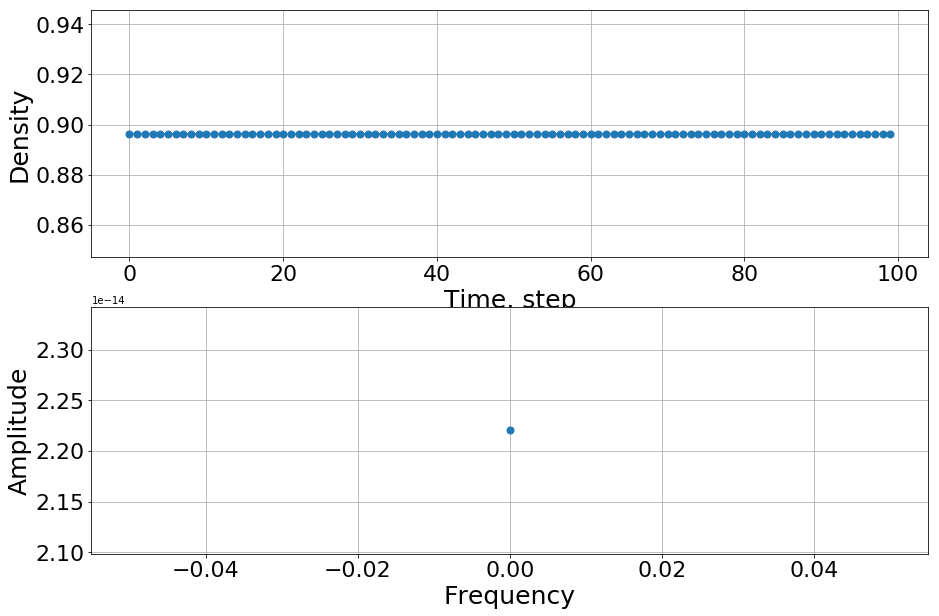

[2.22044605e-14]

===========payoff parameter:  1.135 ===========


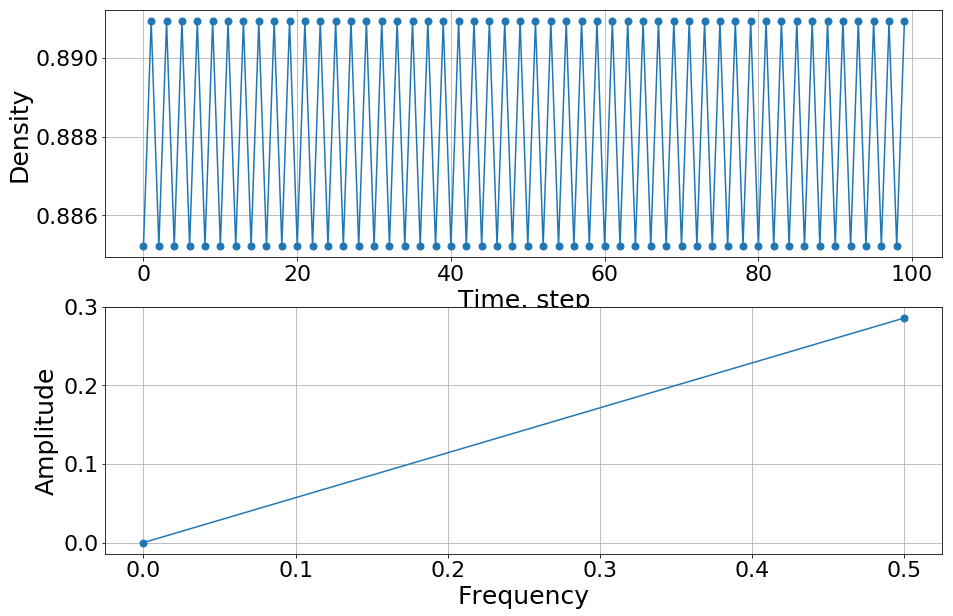

[2.77555756e-14 2.85685134e-01]

===========payoff parameter:  1.1528571428571428 ===========


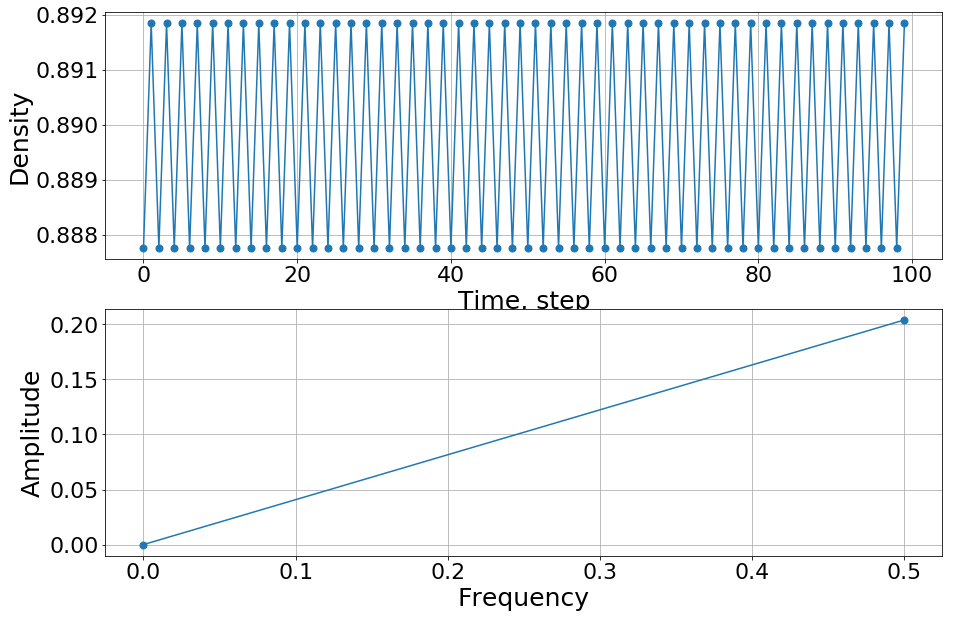

[2.22044605e-14 2.04060810e-01]

===========payoff parameter:  1.1766666666666667 ===========


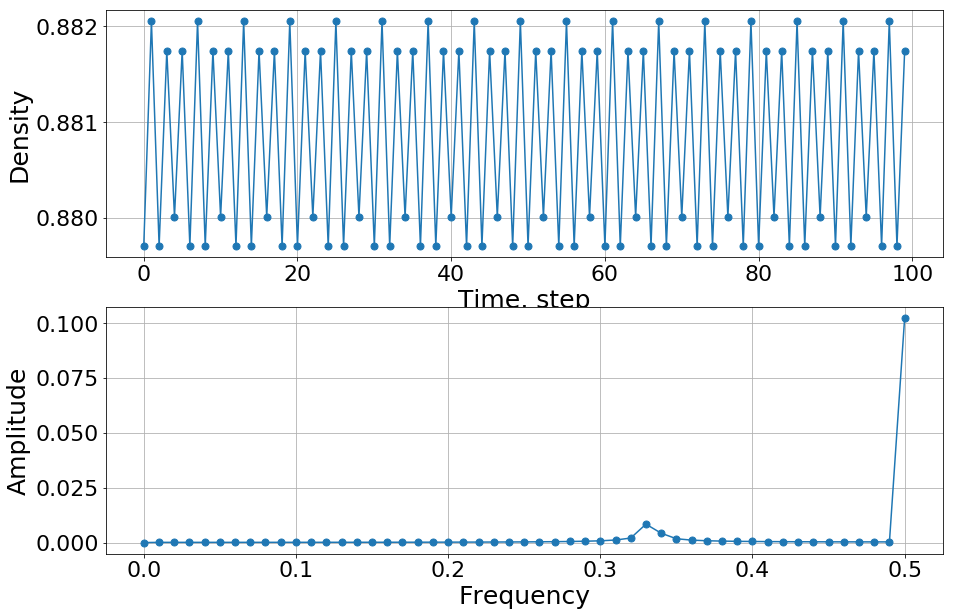

[1.74305015e-14 1.02164804e-04 1.02569600e-04 1.03249628e-04
 1.04213103e-04 1.05471845e-04 1.07041631e-04 1.08942668e-04
 1.11200221e-04 1.13845443e-04 1.16916441e-04 1.20459671e-04
 1.24531745e-04 1.29201791e-04 1.34554580e-04 1.40694689e-04
 1.47752123e-04 1.55890028e-04 1.65315436e-04 1.76294527e-04
 1.89174775e-04 2.04417891e-04 2.22650230e-04 2.44742482e-04
 2.71940628e-04 3.06091215e-04 3.50050981e-04 4.08484609e-04
 4.89560013e-04 6.08991042e-04 8.01357205e-04 1.16053148e-03
 2.06203377e-03 8.38774932e-03 4.27181967e-03 1.74340910e-03
 1.11367461e-03 8.29303753e-04 6.68413002e-04 5.65760131e-04
 4.95265990e-04 4.44476315e-04 4.06704467e-04 3.78051829e-04
 3.56105121e-04 3.39304726e-04 3.26613545e-04 3.17332891e-04
 3.10995805e-04 3.07304004e-04 1.02336496e-01]

===========payoff parameter:  1.21 ===========


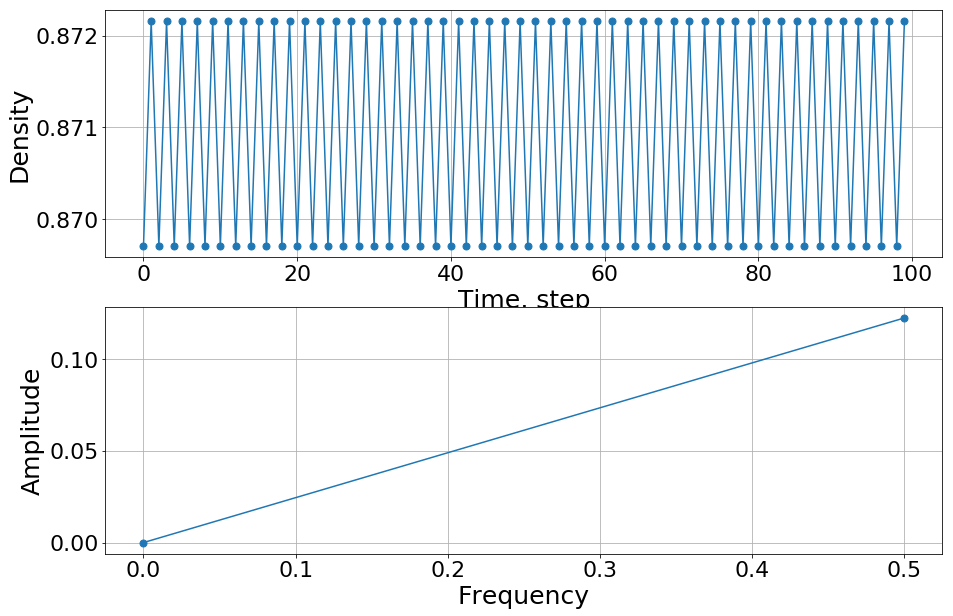

[1.66533454e-14 1.22436486e-01]

===========payoff parameter:  1.26 ===========


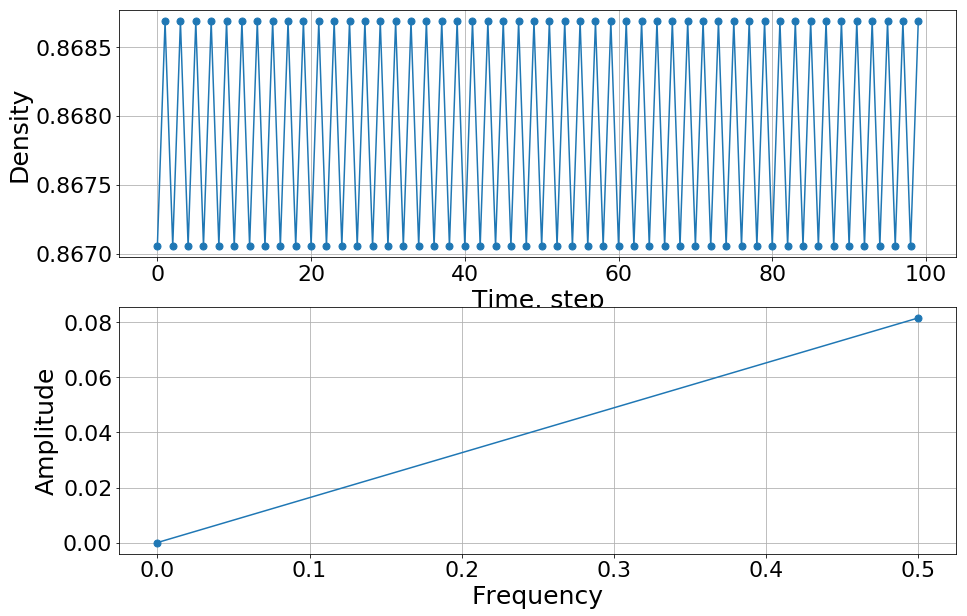

[3.33066907e-14 8.16243240e-02]

===========payoff parameter:  1.2957142857142858 ===========


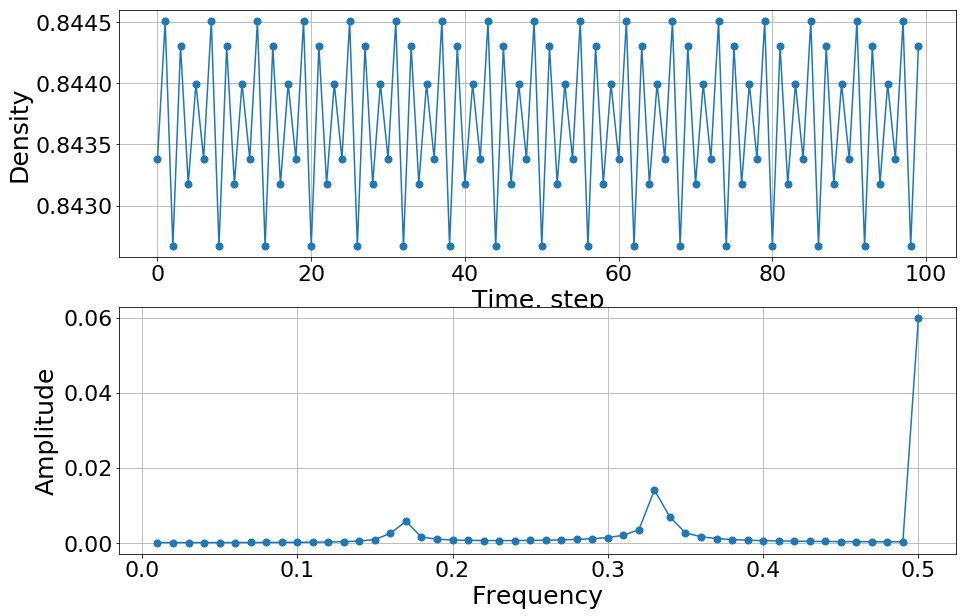

[0.00017036 0.0001713  0.00017294 0.00017541 0.00017893 0.00018383
 0.00019065 0.00020026 0.00021409 0.0002346  0.00026617 0.00031714
 0.0004051  0.00057383 0.0009716  0.00263417 0.0058295  0.00163743
 0.00106306 0.00085242 0.00075604 0.0007125  0.00070031 0.00071117
 0.00074279 0.00079691 0.00087945 0.00100284 0.00119248 0.00150547
 0.00209786 0.00359524 0.01413387 0.00696891 0.0027578  0.00171064
 0.00123867 0.00097214 0.00080238 0.00068597 0.00060219 0.00053993
 0.00049271 0.00045655 0.00042887 0.00040795 0.00039265 0.0003822
 0.00037611 0.05989185]

===========payoff parameter:  1.3433333333333333 ===========


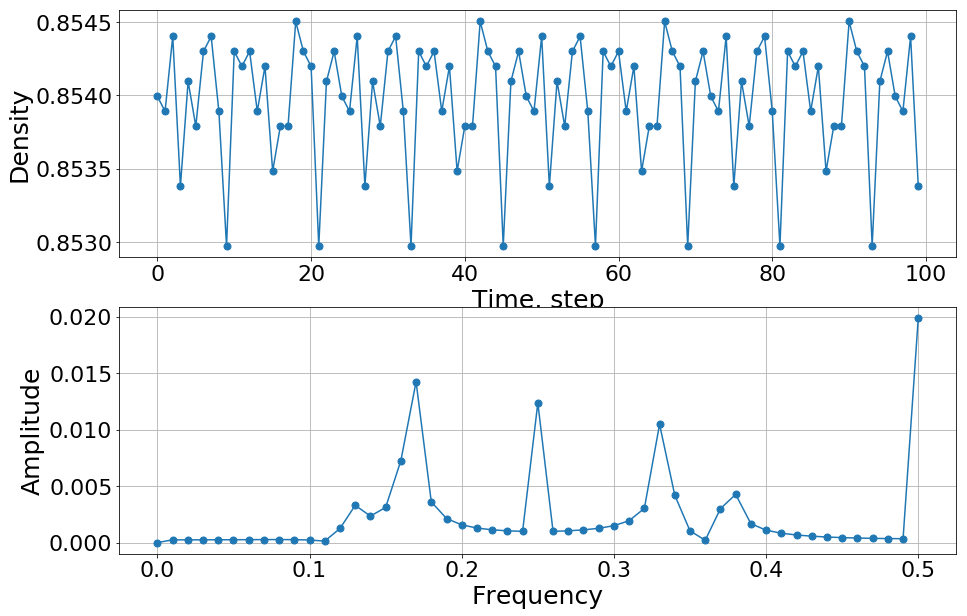

[2.46469511e-14 2.38641093e-04 2.40354487e-04 2.43213293e-04
 2.47194323e-04 2.52189492e-04 2.57866095e-04 2.63326299e-04
 2.66214627e-04 2.60116039e-04 2.25964641e-04 1.29846191e-04
 1.24990809e-03 3.29807477e-03 2.34600916e-03 3.11450356e-03
 7.25501564e-03 1.42425548e-02 3.60441944e-03 2.13042599e-03
 1.56866177e-03 1.28733235e-03 1.13010001e-03 1.04063817e-03
 9.94681069e-04 1.23726328e-02 9.96634579e-04 1.04207803e-03
 1.12498148e-03 1.26284431e-03 1.49639058e-03 1.93698838e-03
 3.02690969e-03 1.04703630e-02 4.19111507e-03 1.03830920e-03
 2.05147361e-04 3.00168596e-03 4.27108530e-03 1.67178798e-03
 1.09712894e-03 8.29057679e-04 6.70664094e-04 5.65959651e-04
 4.92468004e-04 4.39315137e-04 4.00618038e-04 3.72977560e-04
 3.54372673e-04 3.43620835e-04 1.98959290e-02]

===========payoff parameter:  1.41 ===========


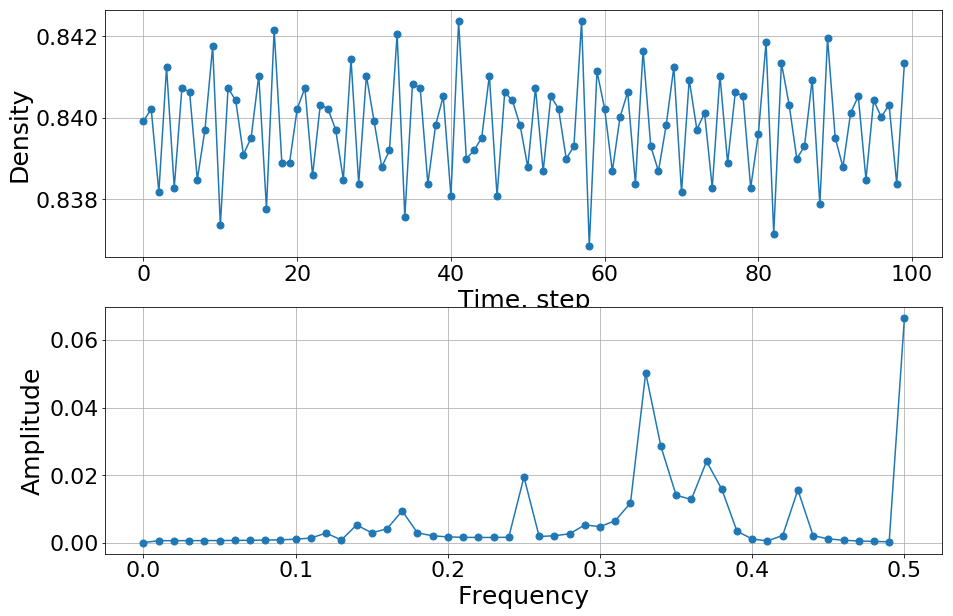

[1.37667655e-14 5.60330543e-04 5.65237502e-04 5.73872725e-04
 5.87024341e-04 6.06042434e-04 6.33210237e-04 6.72502976e-04
 7.31272750e-04 8.24521184e-04 9.88300960e-04 1.34118872e-03
 2.82276628e-03 7.55165186e-04 5.21062998e-03 2.89299948e-03
 4.05601283e-03 9.37661753e-03 2.87830250e-03 1.99935266e-03
 1.68499906e-03 1.55184249e-03 1.50614864e-03 1.51582027e-03
 1.56950499e-03 1.94002706e-02 1.80919829e-03 2.01553758e-03
 2.59749283e-03 5.23704023e-03 4.70245603e-03 6.49955437e-03
 1.16993547e-02 5.02635150e-02 2.84605575e-02 1.40171891e-02
 1.27687888e-02 2.40373752e-02 1.57991002e-02 3.36020889e-03
 1.05671923e-03 5.05809456e-04 2.08447583e-03 1.55848468e-02
 2.06551535e-03 1.08368423e-03 6.91965826e-04 4.71323060e-04
 3.28526942e-04 2.37824966e-04 6.65238241e-02]

===========payoff parameter:  1.51 ===========


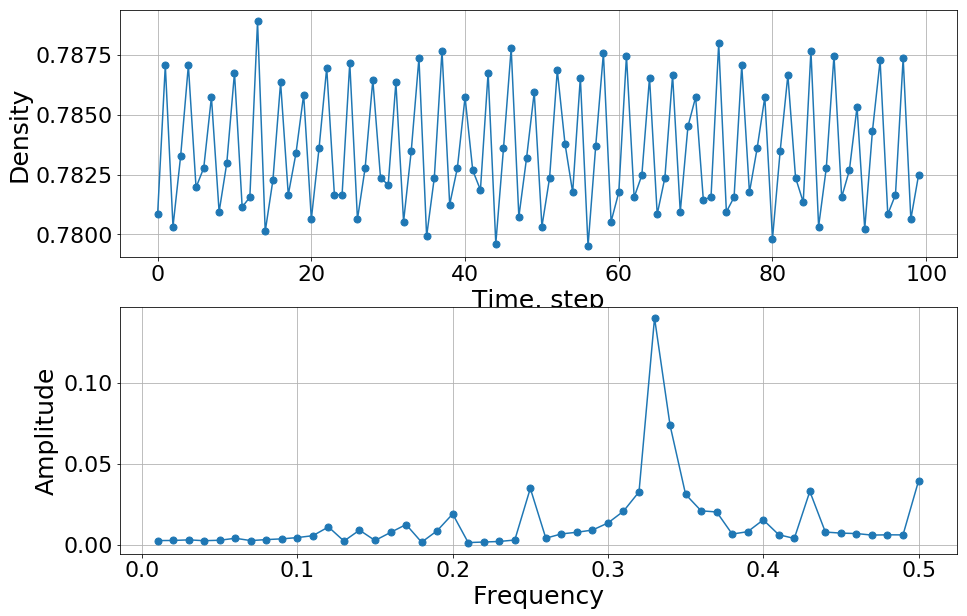

[0.00271672 0.00278814 0.00315263 0.00264328 0.00292212 0.00414384
 0.00270851 0.00333235 0.00377578 0.00456618 0.0057444  0.01114137
 0.00241435 0.00916285 0.0027791  0.00775428 0.01261644 0.00171058
 0.00878186 0.01914211 0.00148836 0.00181394 0.0021675  0.00305754
 0.03494284 0.0041855  0.00683216 0.00785406 0.00920054 0.01358199
 0.02085287 0.03277638 0.14011449 0.07383278 0.0312485  0.02107854
 0.02037968 0.00674041 0.00820723 0.01550688 0.00632405 0.00403987
 0.03306253 0.00797572 0.00732539 0.00705718 0.00610019 0.00627091
 0.00621951 0.03948577]

===========payoff parameter:  1.61 ===========


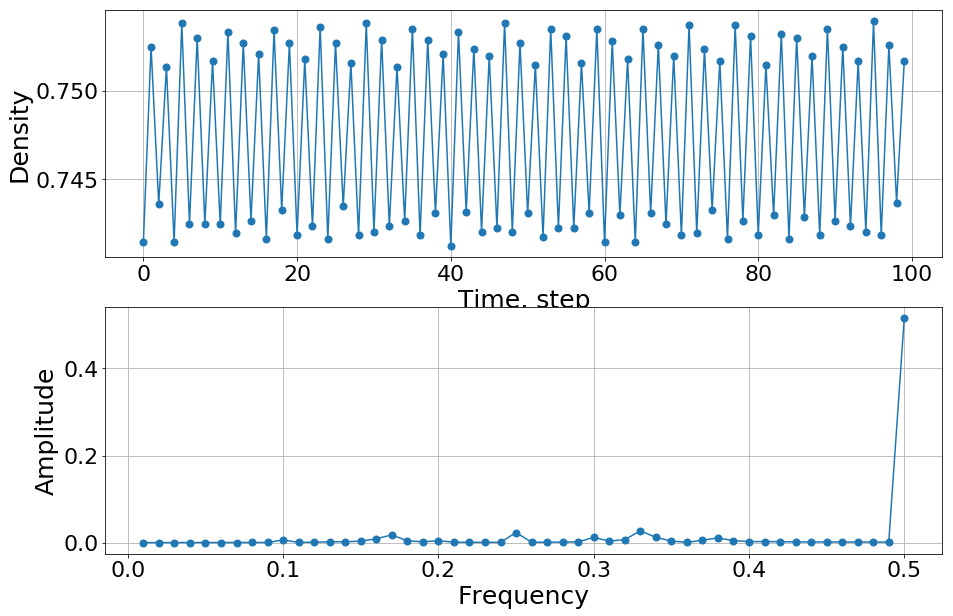

[0.00066574 0.00067348 0.00068672 0.00070601 0.00073219 0.00076653
 0.00081082 0.00086772 0.00094103 0.00649783 0.00116106 0.00142526
 0.00242322 0.00259522 0.00389439 0.00938192 0.01832109 0.0045272
 0.00259576 0.00481109 0.00150103 0.00131834 0.00123918 0.00123305
 0.02367193 0.00140134 0.00158323 0.00185641 0.00227074 0.01244068
 0.00416868 0.00717658 0.02767678 0.01275104 0.00413902 0.001062
 0.00600584 0.01133776 0.00508658 0.00289225 0.00302547 0.00263329
 0.00237368 0.00219183 0.00206088 0.00196611 0.00189886 0.00185387
 0.00182799 0.51504948]

===========payoff parameter:  1.6766666666666667 ===========


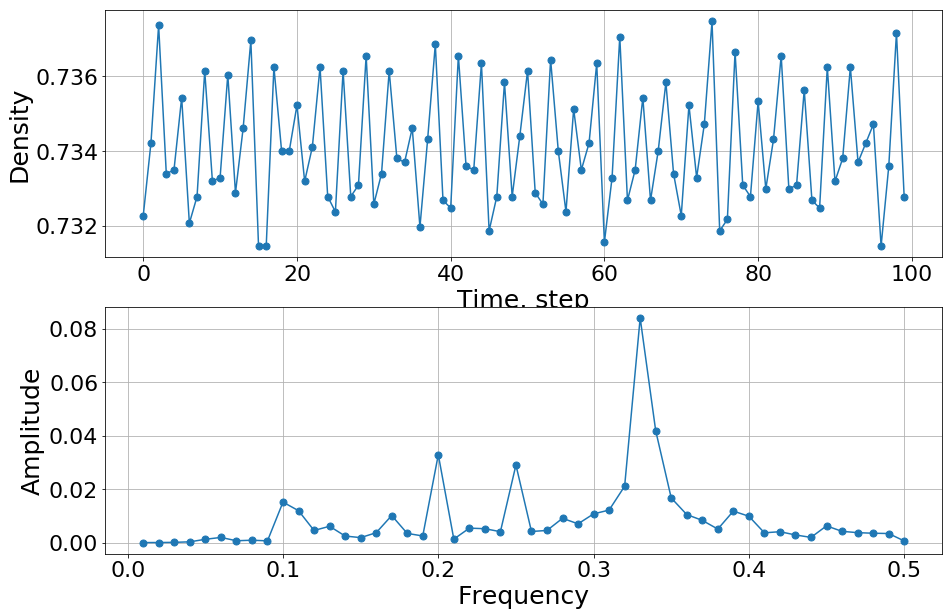

[9.90954634e-05 1.16818146e-04 1.81629798e-04 3.76248636e-04
 1.32711913e-03 2.02181638e-03 7.78525908e-04 9.80514541e-04
 7.40847929e-04 1.52286283e-02 1.20168281e-02 4.62035267e-03
 6.19814054e-03 2.54076127e-03 1.94902189e-03 3.78283609e-03
 1.02071703e-02 3.52677434e-03 2.56617486e-03 3.29515598e-02
 1.38028918e-03 5.49240948e-03 5.28488923e-03 4.16342863e-03
 2.91072915e-02 4.24430793e-03 4.63122034e-03 9.17695633e-03
 7.10439252e-03 1.08247049e-02 1.22525251e-02 2.11694129e-02
 8.40928991e-02 4.19264655e-02 1.67815977e-02 1.05684522e-02
 8.40179952e-03 5.14924333e-03 1.18586441e-02 9.94206429e-03
 3.74386962e-03 4.16433759e-03 2.94709690e-03 2.03614771e-03
 6.34184101e-03 4.29711034e-03 3.80960026e-03 3.58994695e-03
 3.48416958e-03 7.14212835e-04]

===========payoff parameter:  1.76 ===========


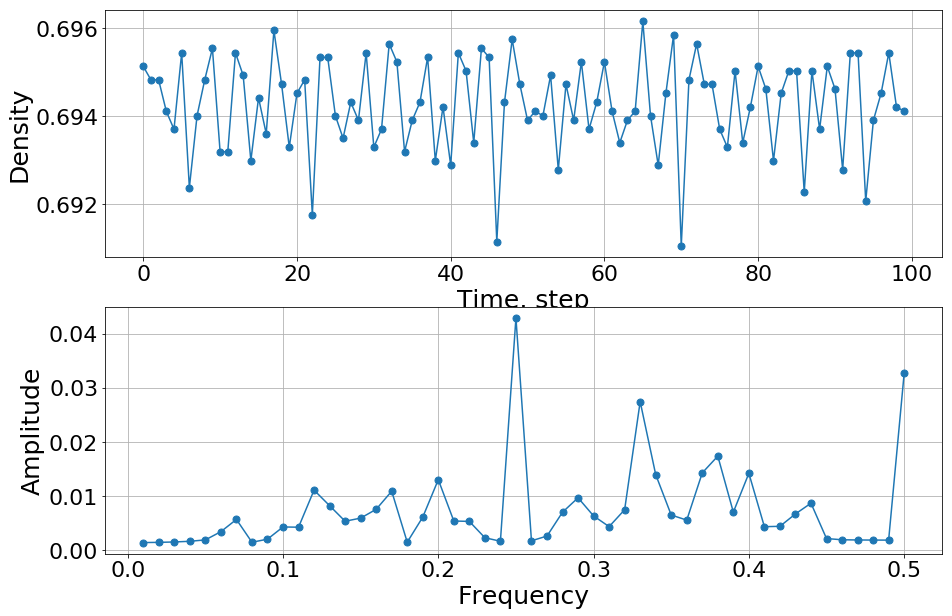

[0.00144792 0.00148653 0.00155891 0.00168529 0.00193978 0.0034605
 0.00571615 0.00150821 0.00207328 0.004327   0.00428307 0.01112449
 0.00825617 0.00538526 0.00596082 0.00758405 0.0109234  0.00152059
 0.0061444  0.01304767 0.00542558 0.00535343 0.0023407  0.00169437
 0.04288798 0.00177496 0.00265121 0.00704658 0.00971177 0.00636483
 0.00438689 0.00750639 0.02744679 0.01399375 0.00652898 0.00559304
 0.01430472 0.01739832 0.0070625  0.01422388 0.00437669 0.00444728
 0.0067313  0.00871015 0.00218981 0.00196444 0.00192653 0.00190868
 0.00189834 0.03264973]

===========payoff parameter:  1.81 ===========


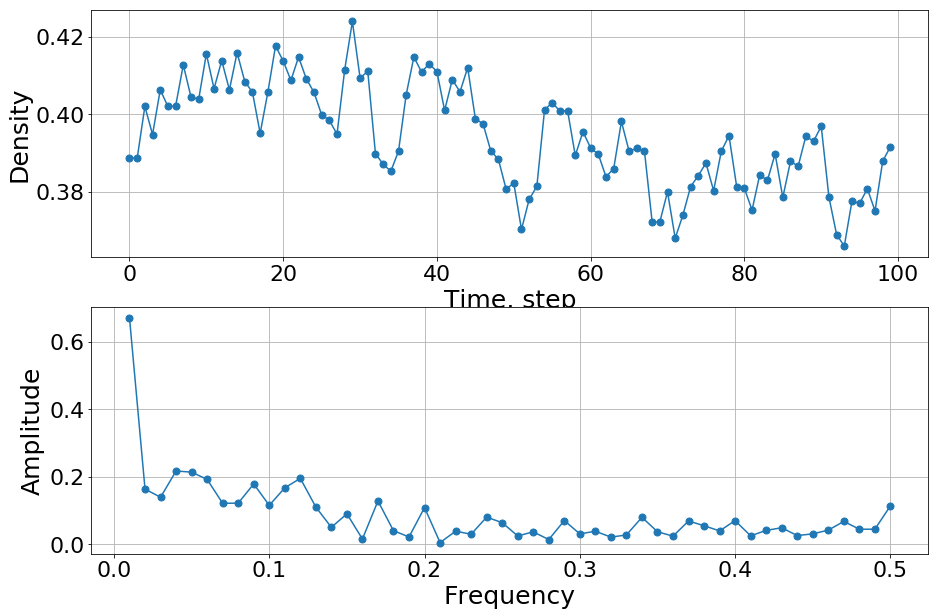

[0.67129551 0.16363024 0.1395667  0.21738369 0.21402042 0.19246661
 0.12158473 0.12203797 0.17895621 0.11552941 0.16745281 0.19552142
 0.11044425 0.05037094 0.09032478 0.01564975 0.12845544 0.04030588
 0.02177699 0.10895358 0.00510713 0.03879661 0.02987057 0.08049428
 0.06418718 0.02475499 0.03690736 0.01404151 0.07044722 0.03083213
 0.0387323  0.02127791 0.02771471 0.07989988 0.03729985 0.02402038
 0.06906138 0.05503697 0.03970542 0.07025945 0.02498644 0.04126853
 0.04907203 0.02583949 0.03093402 0.04199551 0.06787311 0.04470476
 0.04471153 0.11396796]

===========payoff parameter:  2.01 ===========


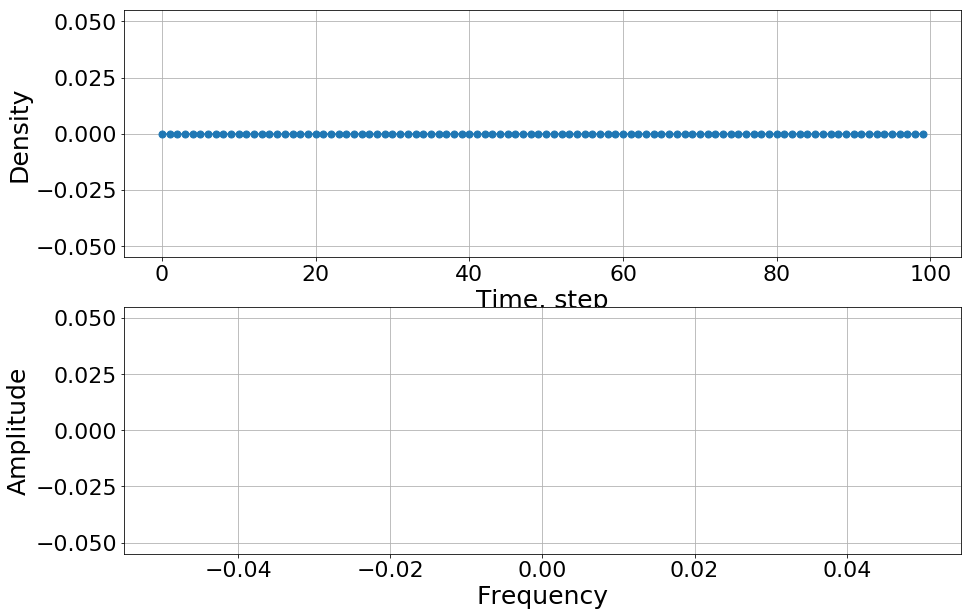

[]

===========payoff parameter:  2.26 ===========


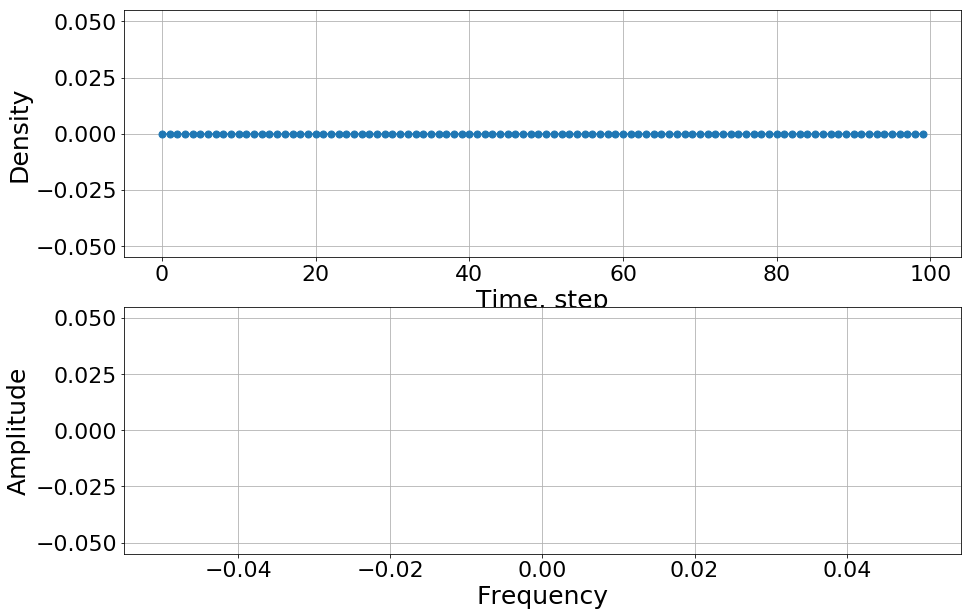

[]

===========payoff parameter:  2.3433333333333333 ===========


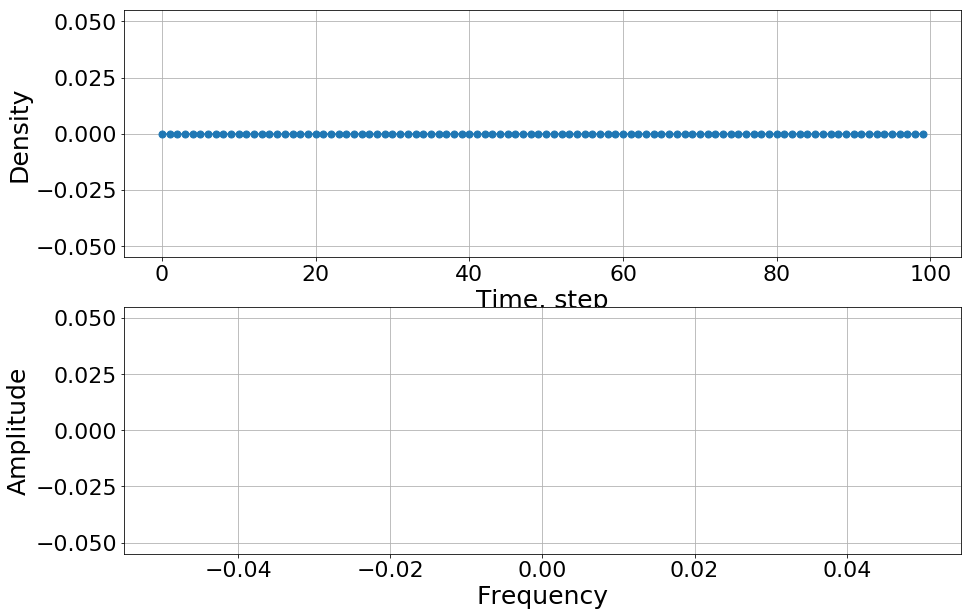

[]

===========payoff parameter:  2.51 ===========


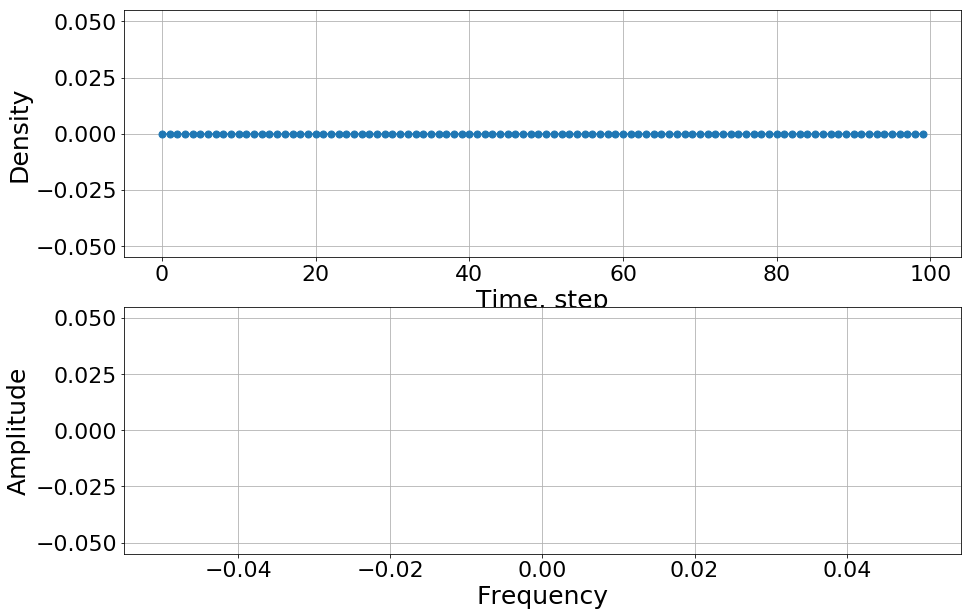

[]

===========payoff parameter:  2.6766666666666663 ===========


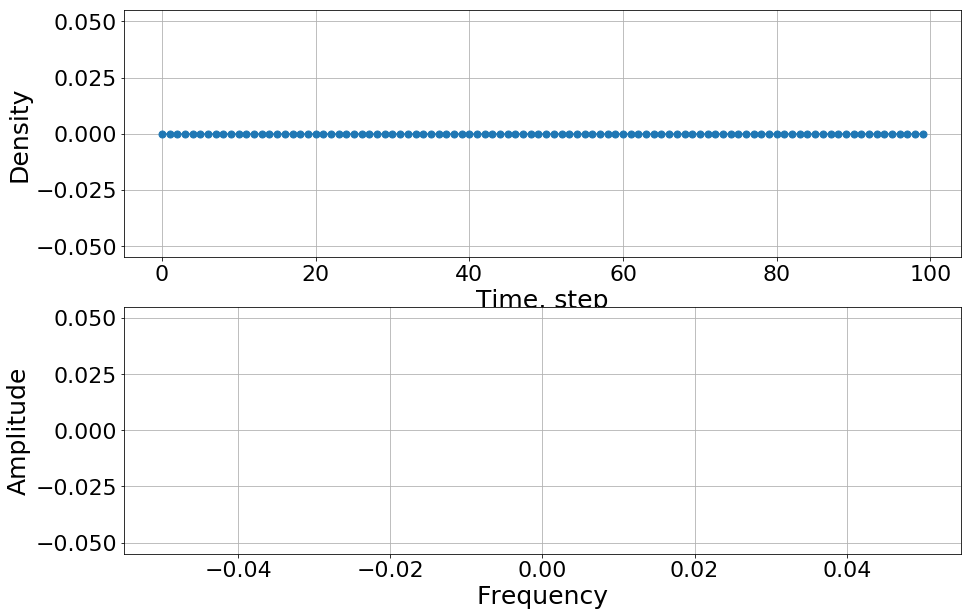

[]


In [5]:
den21=c_density()
for i in range(len(b_points)):
    print('\n===========payoff parameter: ',b_points[i],'===========')
    fourier(den21[i])

### cooperator percentage = 50


===========payoff parameter:  1.01 ===========


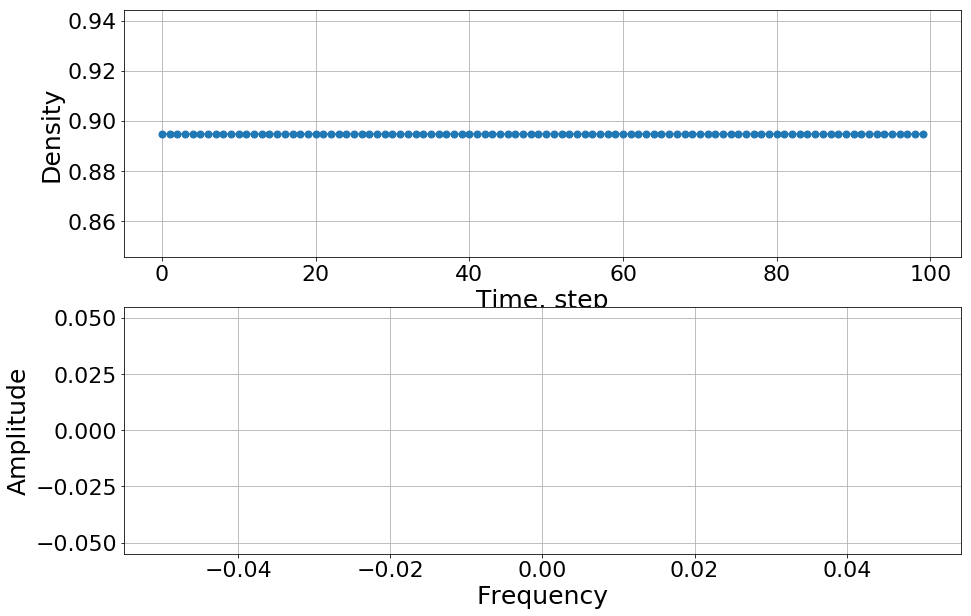

[]

===========payoff parameter:  1.135 ===========


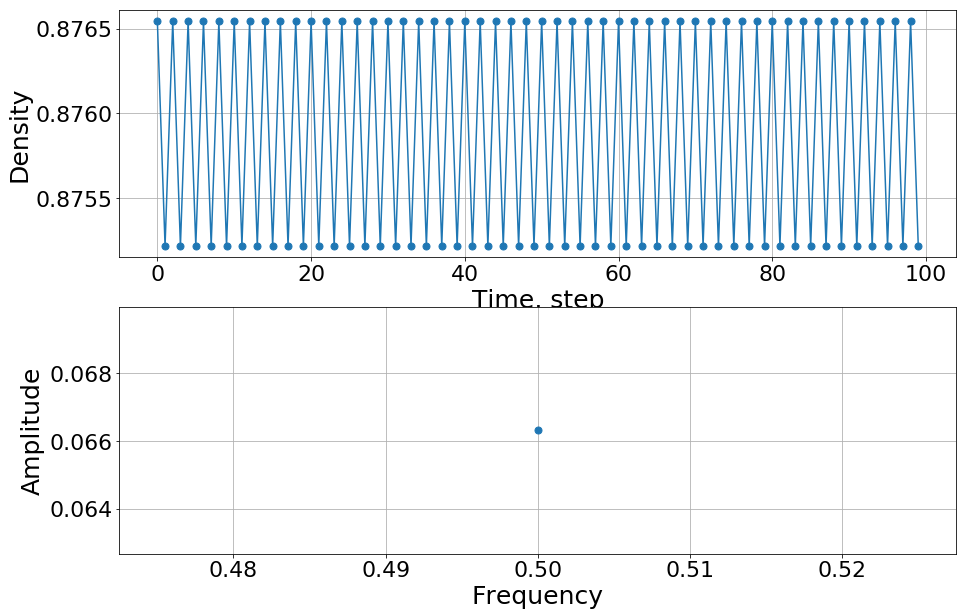

[0.06631976]

===========payoff parameter:  1.1528571428571428 ===========


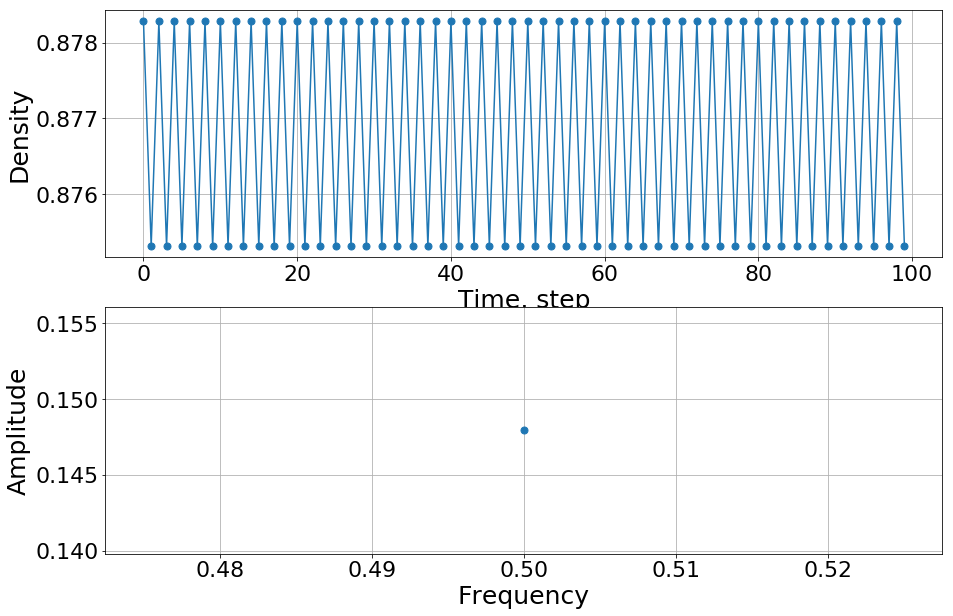

[0.14794409]

===========payoff parameter:  1.1766666666666667 ===========


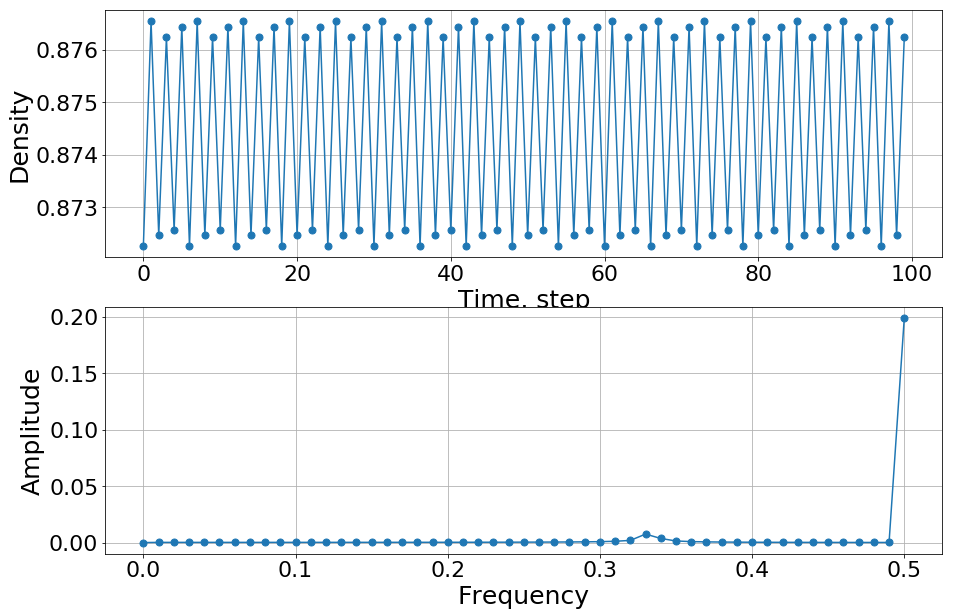

[2.09832152e-14 1.70194015e-04 1.70625509e-04 1.71349618e-04
 1.72373911e-04 1.73709272e-04 1.75370210e-04 1.77375276e-04
 1.79747629e-04 1.82515763e-04 1.85714461e-04 1.89386028e-04
 1.93581888e-04 1.98364681e-04 2.03811022e-04 2.10015189e-04
 2.17094088e-04 2.25194068e-04 2.34500408e-04 2.45250792e-04
 2.57754855e-04 2.72423250e-04 2.89812113e-04 3.10693368e-04
 3.36170222e-04 3.67875857e-04 4.08334695e-04 4.61665949e-04
 5.35078723e-04 6.42437327e-04 8.14244298e-04 1.13329432e-03
 1.93077145e-03 7.51210038e-03 3.64986612e-03 1.41713615e-03
 8.58718801e-04 6.04718249e-04 4.59451303e-04 3.65383580e-04
 2.99525438e-04 2.50912245e-04 2.13678802e-04 1.84436751e-04
 1.61132142e-04 1.42495498e-04 1.27755685e-04 1.16478078e-04
 1.08459020e-04 1.03640361e-04 1.99061320e-01]

===========payoff parameter:  1.21 ===========


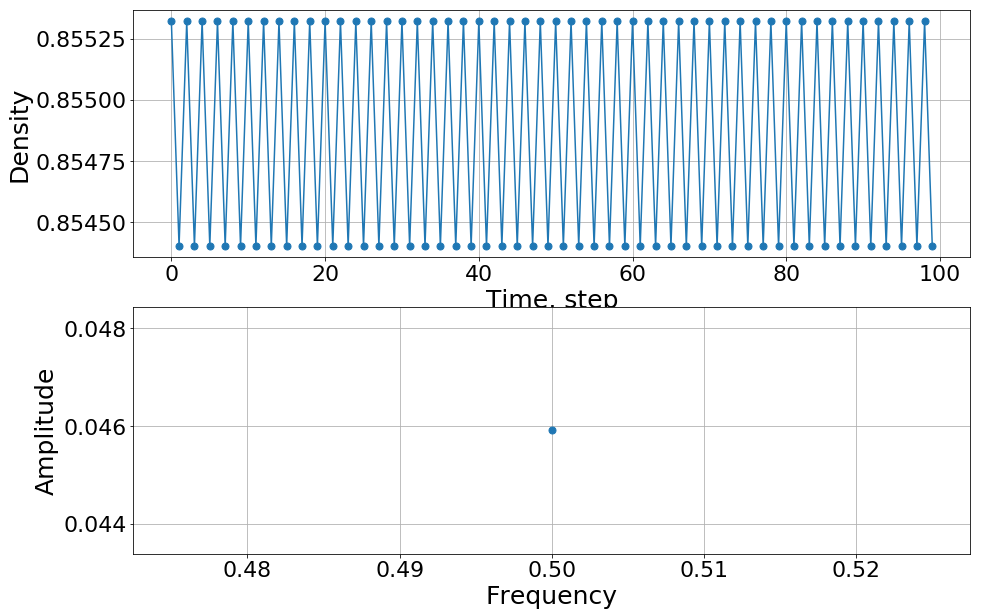

[0.04591368]

===========payoff parameter:  1.26 ===========


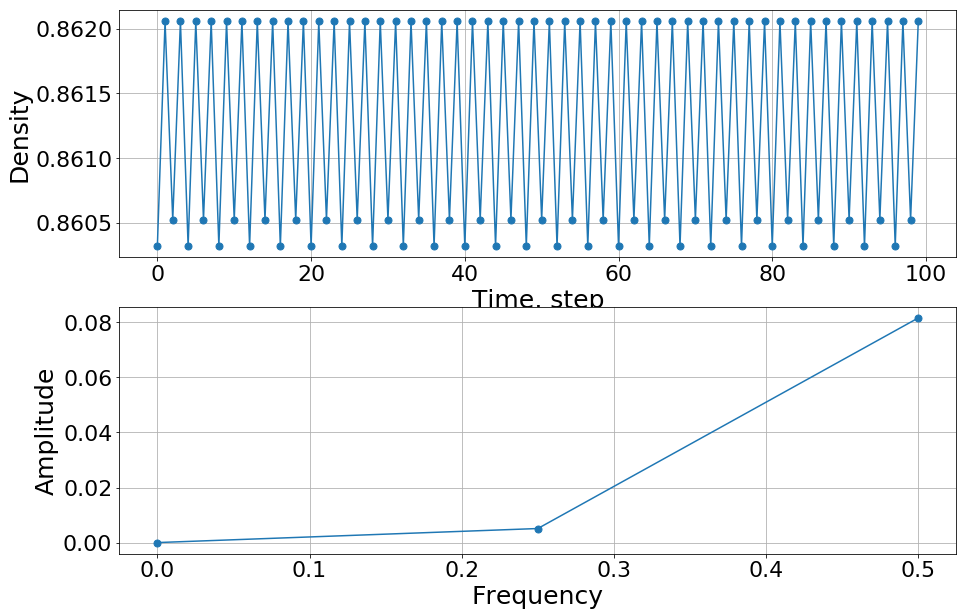

[1.38777878e-14 5.10152025e-03 8.16243240e-02]

===========payoff parameter:  1.2957142857142858 ===========


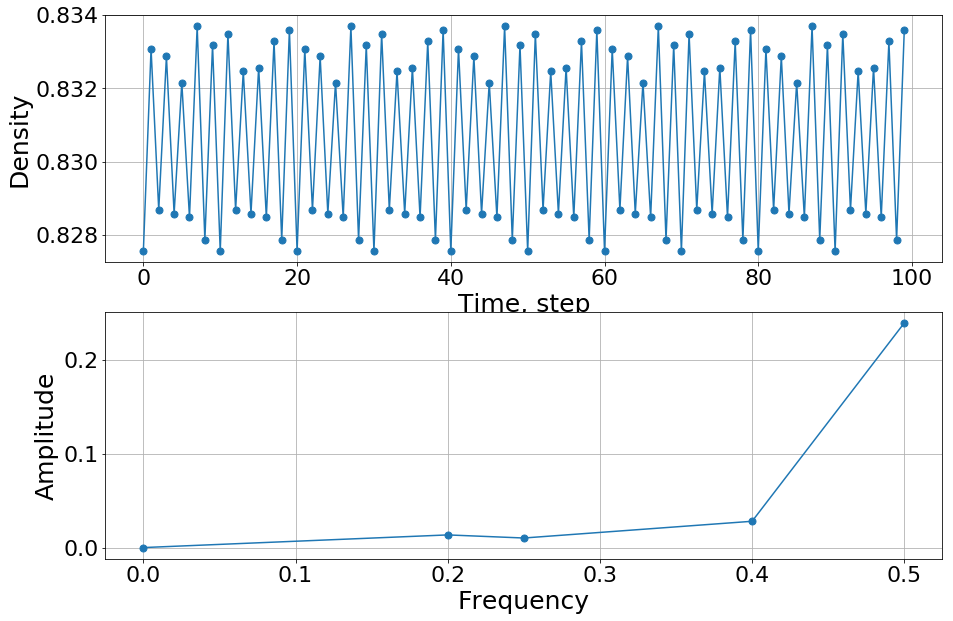

[2.38697950e-14 1.35093482e-02 1.02030405e-02 2.80665011e-02
 2.39771452e-01]

===========payoff parameter:  1.3433333333333333 ===========


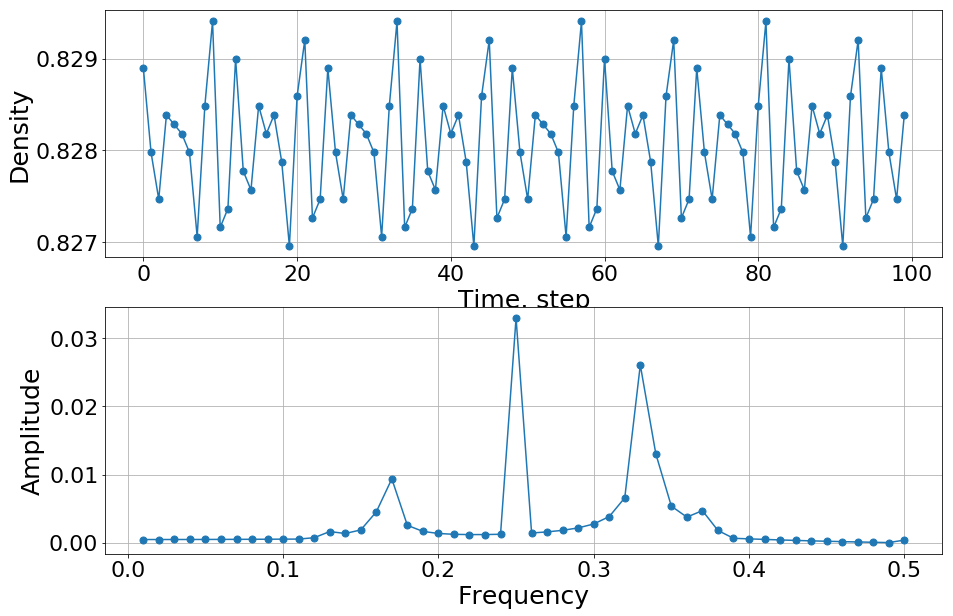

[4.93639476e-04 4.95128879e-04 4.97651499e-04 5.01270329e-04
 5.06077790e-04 5.12196133e-04 5.19765591e-04 5.28887471e-04
 5.39412426e-04 5.50238401e-04 5.58853683e-04 7.60349979e-04
 1.66333737e-03 1.37757574e-03 1.90292713e-03 4.54923441e-03
 9.39202163e-03 2.57763119e-03 1.68555066e-03 1.38178055e-03
 1.25859401e-03 1.21686574e-03 1.22288784e-03 1.26443850e-03
 3.29853427e-02 1.45106844e-03 1.61189661e-03 1.84472743e-03
 2.19632517e-03 2.77161755e-03 3.85803876e-03 6.61111743e-03
 2.60933060e-02 1.30543169e-02 5.38541445e-03 3.77943593e-03
 4.73230112e-03 1.82433439e-03 6.76166025e-04 5.91351564e-04
 5.11843425e-04 4.34305187e-04 3.63163609e-04 2.98918160e-04
 2.40725706e-04 1.87445889e-04 1.37986614e-04 9.14584130e-05
 4.76488977e-05 4.08121620e-04]

===========payoff parameter:  1.41 ===========


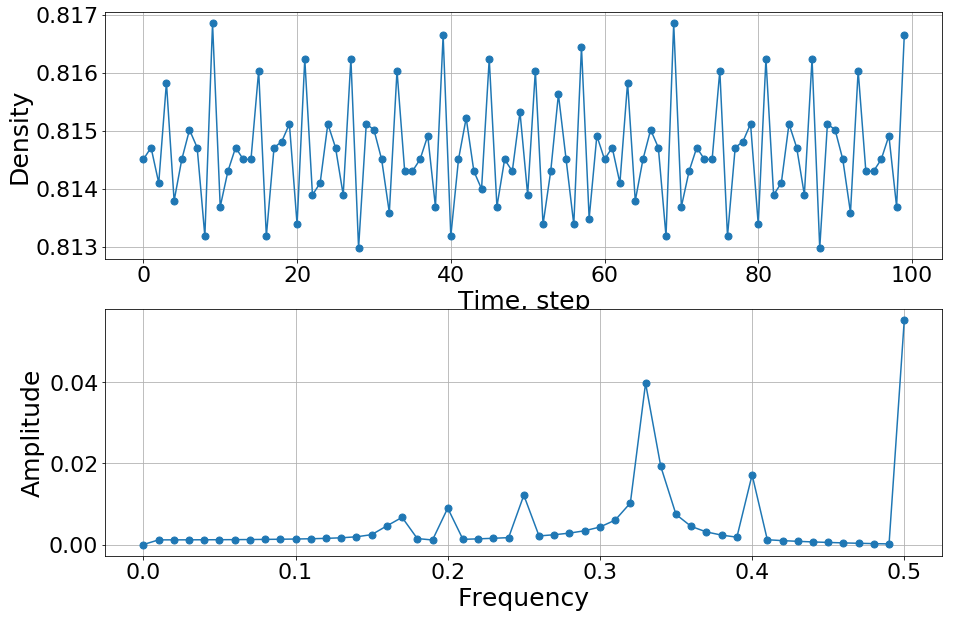

[1.60982339e-14 1.15790743e-03 1.16264021e-03 1.17068016e-03
 1.18227190e-03 1.19779507e-03 1.21781185e-03 1.24314781e-03
 1.27503212e-03 1.31535209e-03 1.36714420e-03 1.43562181e-03
 1.53056772e-03 1.67277459e-03 1.91545954e-03 2.44508797e-03
 4.60970082e-03 6.71481513e-03 1.48002440e-03 1.12973333e-03
 8.99217885e-03 1.28686734e-03 1.41238166e-03 1.55156378e-03
 1.71019695e-03 1.21673130e-02 2.12888079e-03 2.42574771e-03
 2.82718825e-03 3.40699987e-03 4.32692724e-03 6.02535334e-03
 1.02549694e-02 3.97981425e-02 1.92558990e-02 7.43171349e-03
 4.46682050e-03 3.11221804e-03 2.33223030e-03 1.82216114e-03
 1.71977052e-02 1.18753421e-03 9.73095463e-04 7.98246408e-04
 6.51425755e-04 5.25106437e-04 4.14375695e-04 3.16427220e-04
 2.31150860e-04 1.64450692e-04 5.54025099e-02]

===========payoff parameter:  1.51 ===========


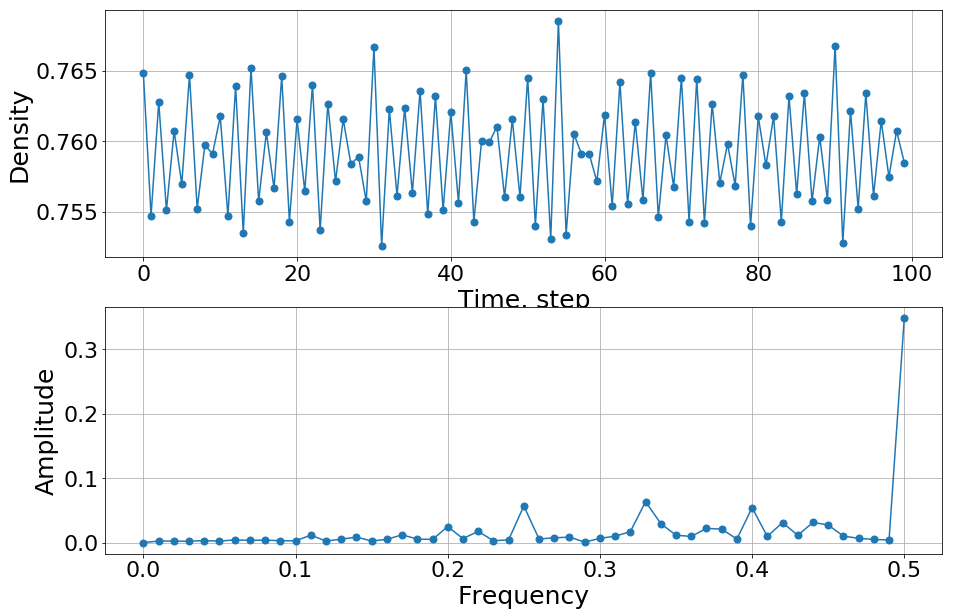

[1.94289029e-14 2.39337907e-03 2.30922817e-03 2.01732635e-03
 3.06954342e-03 2.29107917e-03 4.15931859e-03 3.47947447e-03
 3.72844522e-03 2.92849975e-03 2.62281902e-03 1.15066882e-02
 2.38471948e-03 5.28379285e-03 8.49480577e-03 2.48013033e-03
 4.94682847e-03 1.21033401e-02 5.37042433e-03 4.93647527e-03
 2.47179990e-02 6.24260271e-03 1.72969511e-02 2.87702002e-03
 4.15324576e-03 5.67085322e-02 5.58318213e-03 7.41504718e-03
 8.47513594e-03 7.07833478e-04 6.55793533e-03 9.87933328e-03
 1.68940578e-02 6.34873895e-02 2.93834883e-02 1.14534418e-02
 9.47193493e-03 2.20175366e-02 2.08706189e-02 5.42264919e-03
 5.40358222e-02 9.60935552e-03 3.10643244e-02 1.12386592e-02
 3.12967497e-02 2.72441598e-02 9.97040518e-03 6.61708751e-03
 4.81519662e-03 4.04484951e-03 3.48331803e-01]

===========payoff parameter:  1.61 ===========


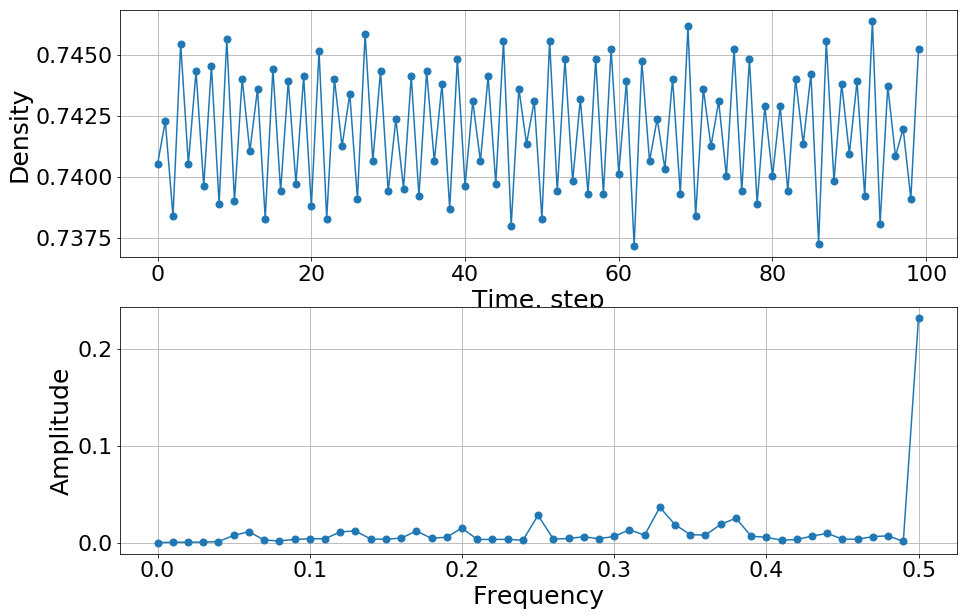

[1.04360964e-14 3.09978004e-04 3.68941124e-04 4.94523332e-04
 1.04082435e-03 7.41669482e-03 1.11983954e-02 2.57844861e-03
 1.66060575e-03 3.28440111e-03 3.99320738e-03 3.88423361e-03
 1.10337588e-02 1.19679138e-02 3.64078506e-03 3.46852306e-03
 4.53250543e-03 1.19563680e-02 4.29278692e-03 5.60936489e-03
 1.49945089e-02 3.24282112e-03 3.19790565e-03 3.34697778e-03
 2.41639425e-03 2.81117375e-02 3.61328885e-03 4.20161840e-03
 5.98996999e-03 3.92096307e-03 6.36792506e-03 1.31524179e-02
 7.62607548e-03 3.63645767e-02 1.85064522e-02 8.13984988e-03
 7.72878227e-03 1.87532903e-02 2.51274676e-02 6.65410025e-03
 5.32849936e-03 2.44722155e-03 3.17223880e-03 6.68416641e-03
 9.49376098e-03 3.54578649e-03 3.42013575e-03 6.11187663e-03
 6.97467022e-03 1.18541105e-03 2.31506989e-01]

===========payoff parameter:  1.6766666666666667 ===========


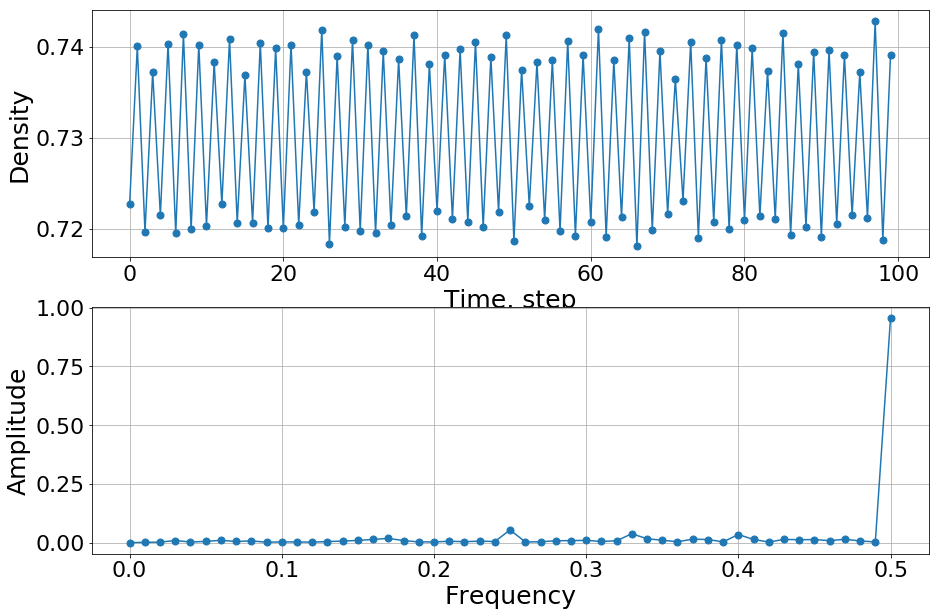

[1.74305015e-14 9.43479597e-04 1.98777978e-03 8.70365133e-03
 2.40281877e-03 4.99042827e-03 9.64343699e-03 4.58121829e-03
 7.20631941e-03 1.37983499e-03 2.91061785e-03 2.61385783e-03
 1.76082865e-03 4.42569555e-03 6.23330194e-03 9.14609510e-03
 1.34285291e-02 1.76610624e-02 8.53391907e-03 2.84424973e-03
 2.81995341e-03 5.58206847e-03 3.85182024e-03 5.89633175e-03
 4.47485517e-03 5.38887665e-02 2.64708578e-03 3.43641564e-03
 7.62458052e-03 8.39846094e-03 9.31175573e-03 4.82942420e-03
 7.56420228e-03 3.77193538e-02 1.61101398e-02 1.00872673e-02
 3.36559949e-03 1.45949516e-02 1.30571588e-02 2.97288452e-03
 3.42665923e-02 1.31103069e-02 2.27509501e-03 1.34527413e-02
 1.21751064e-02 1.27786147e-02 8.31129076e-03 1.39803885e-02
 6.99161358e-03 2.61832954e-03 9.56330987e-01]

===========payoff parameter:  1.76 ===========


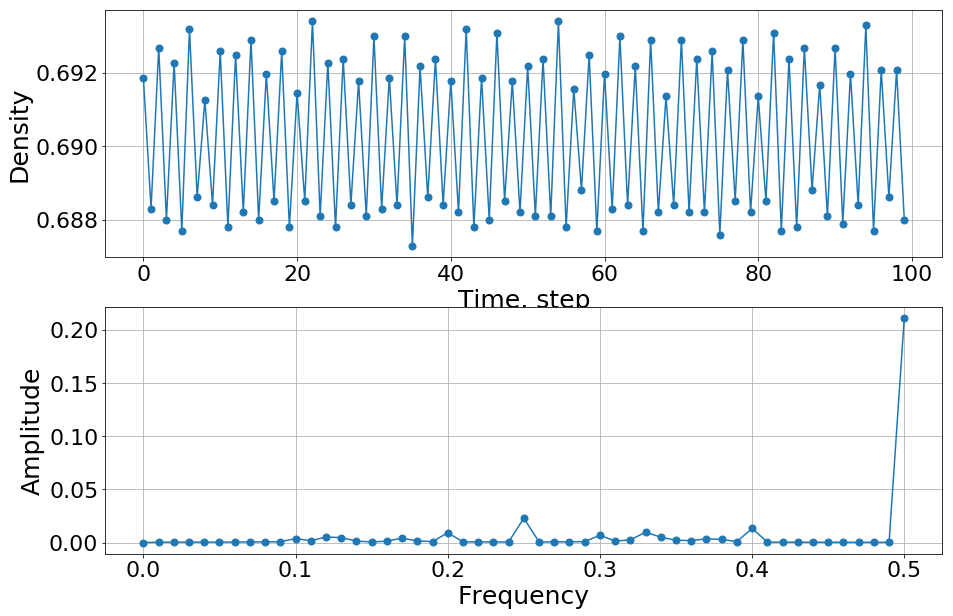

[1.36557432e-14 3.76959005e-04 3.85719956e-04 4.01092498e-04
 4.24400297e-04 4.57902745e-04 5.05422835e-04 5.73677140e-04
 6.75378110e-04 8.37617314e-04 3.70748025e-03 1.80706854e-03
 5.13885973e-03 4.73904680e-03 1.36447952e-03 6.35763816e-04
 1.30555081e-03 4.26171547e-03 1.42344769e-03 9.88774372e-04
 9.16421768e-03 7.07758537e-04 6.50944229e-04 6.19793742e-04
 6.07653639e-04 2.29196266e-02 6.33930519e-04 6.76431181e-04
 7.47738240e-04 8.64852217e-04 6.89865998e-03 1.46068105e-03
 2.48179176e-03 9.81920181e-03 5.01934840e-03 2.20591624e-03
 1.83348114e-03 3.52360217e-03 2.91656794e-03 9.60502472e-04
 1.32445674e-02 4.65738187e-04 3.87800091e-04 3.38603203e-04
 3.05051602e-04 2.81267995e-04 2.64218400e-04 2.52190776e-04
 2.44173523e-04 2.39571898e-04 2.11304969e-01]

===========payoff parameter:  1.81 ===========


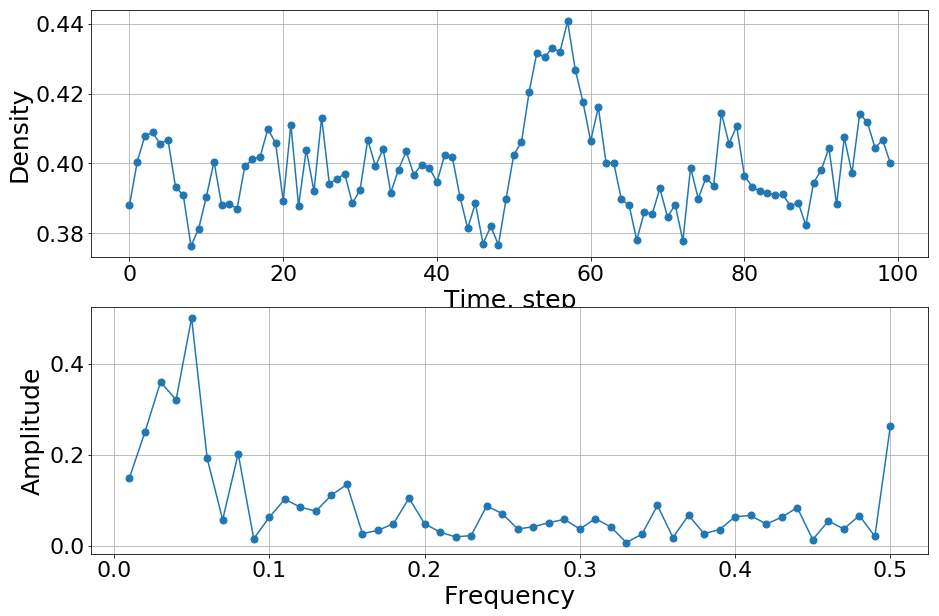

[0.14993149 0.25026683 0.35972429 0.32059797 0.5000626  0.19232284
 0.05762972 0.2023064  0.01587593 0.06280555 0.10245421 0.08513735
 0.07625938 0.11135886 0.13492331 0.02714741 0.03416952 0.04895707
 0.10489977 0.04876771 0.03037376 0.01983606 0.02285585 0.08750038
 0.07118191 0.03725735 0.04213025 0.05104945 0.05840357 0.03717946
 0.05995399 0.0416392  0.00745766 0.02592798 0.08895025 0.01821422
 0.0675872  0.02700531 0.03602426 0.06422467 0.06694331 0.04798609
 0.06299812 0.08427251 0.01386066 0.05477985 0.03735908 0.06660847
 0.02110462 0.2637486 ]

===========payoff parameter:  2.01 ===========


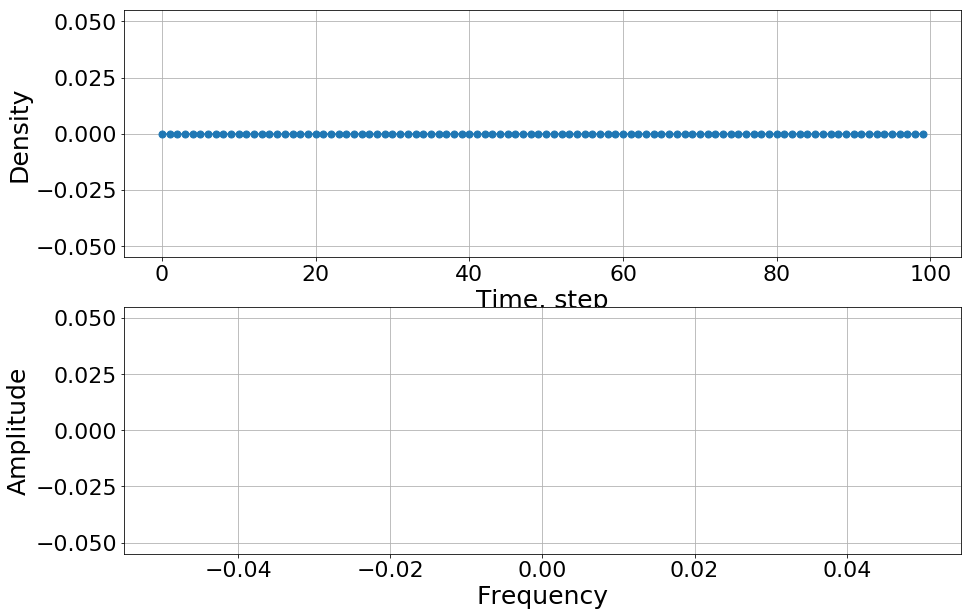

[]

===========payoff parameter:  2.26 ===========


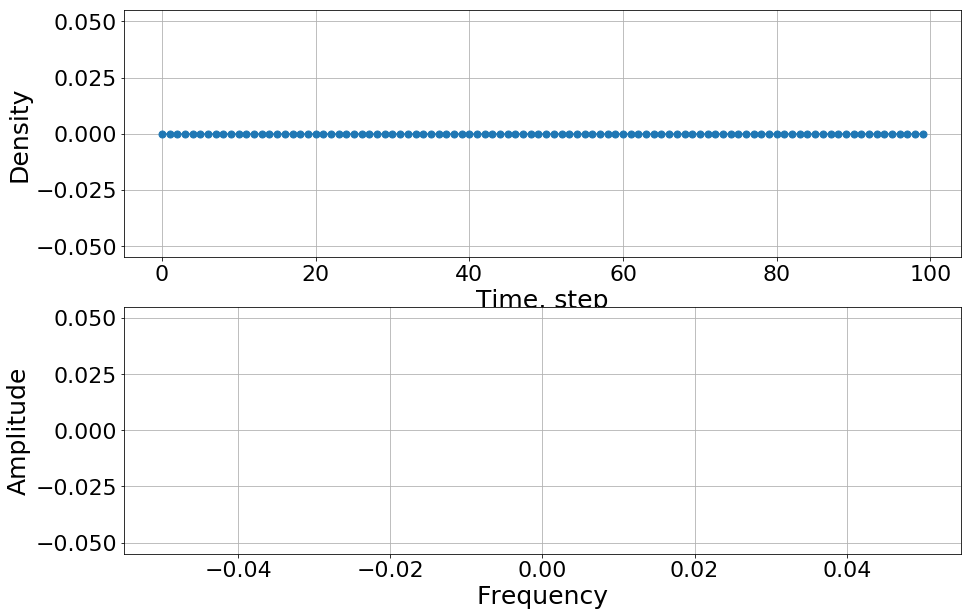

[]

===========payoff parameter:  2.3433333333333333 ===========


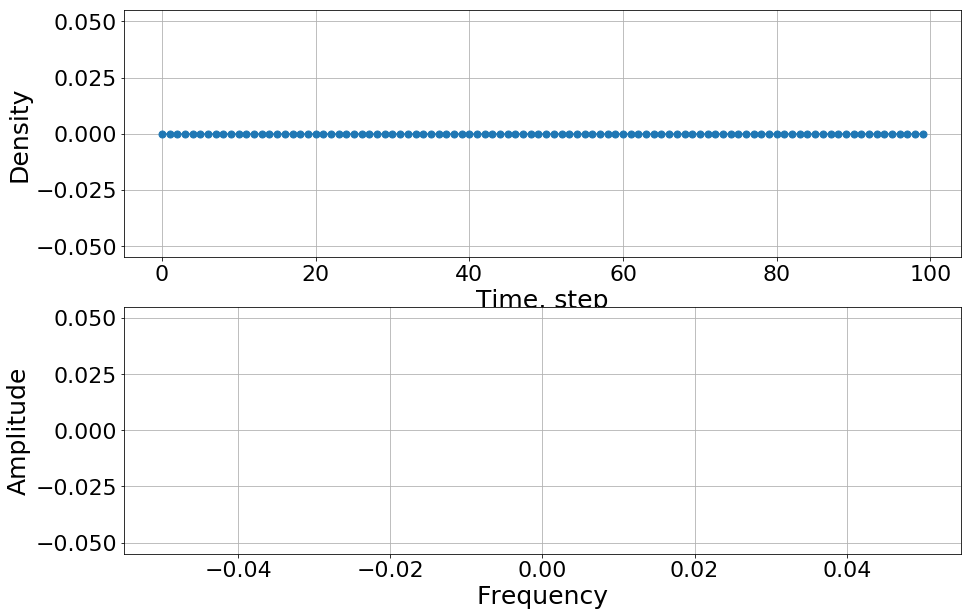

[]

===========payoff parameter:  2.51 ===========


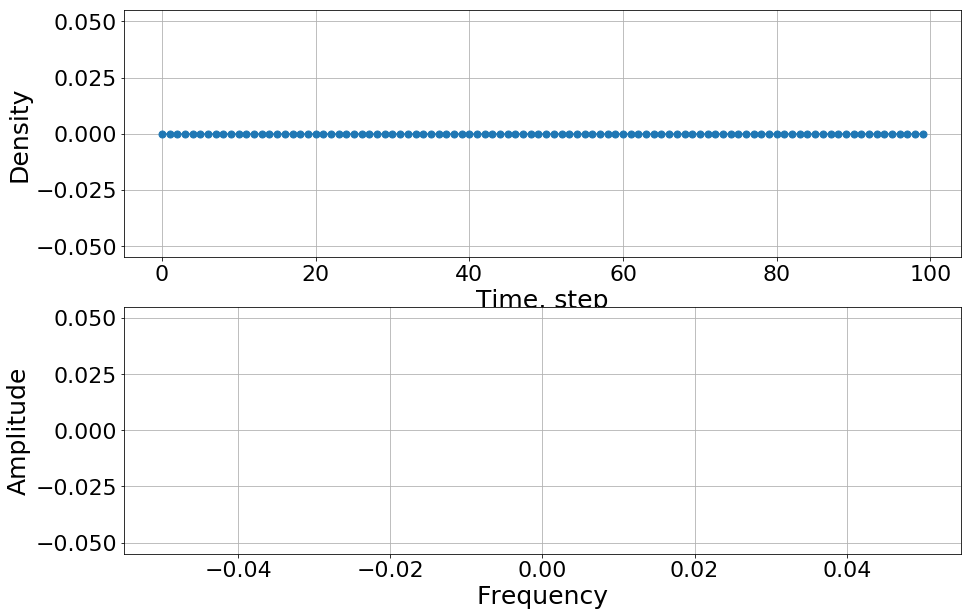

[]

===========payoff parameter:  2.6766666666666663 ===========


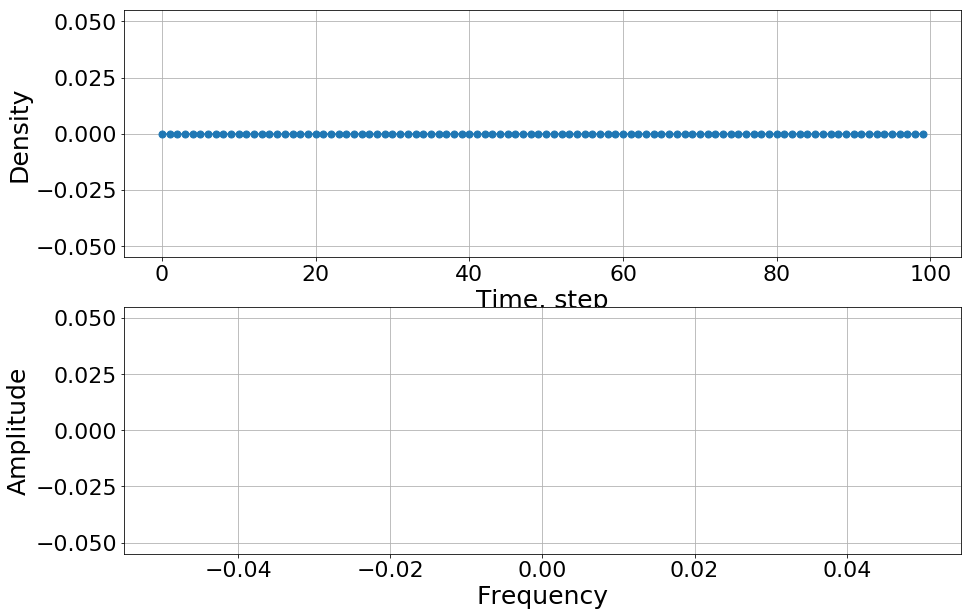

[]


In [6]:
den50=c_density(percentage=50)
for i in range(len(b_points)):
    print('\n===========payoff parameter: ',b_points[i],'===========')
    fourier(den50[i])

### cooperator percentage = 70


===========payoff parameter:  1.01 ===========


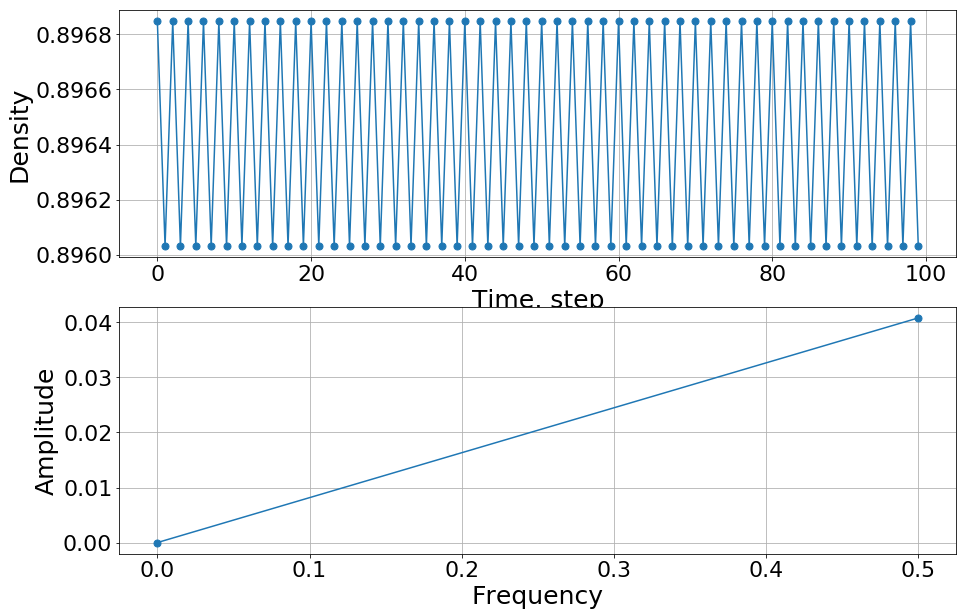

[1.66533454e-14 4.08121620e-02]

===========payoff parameter:  1.135 ===========


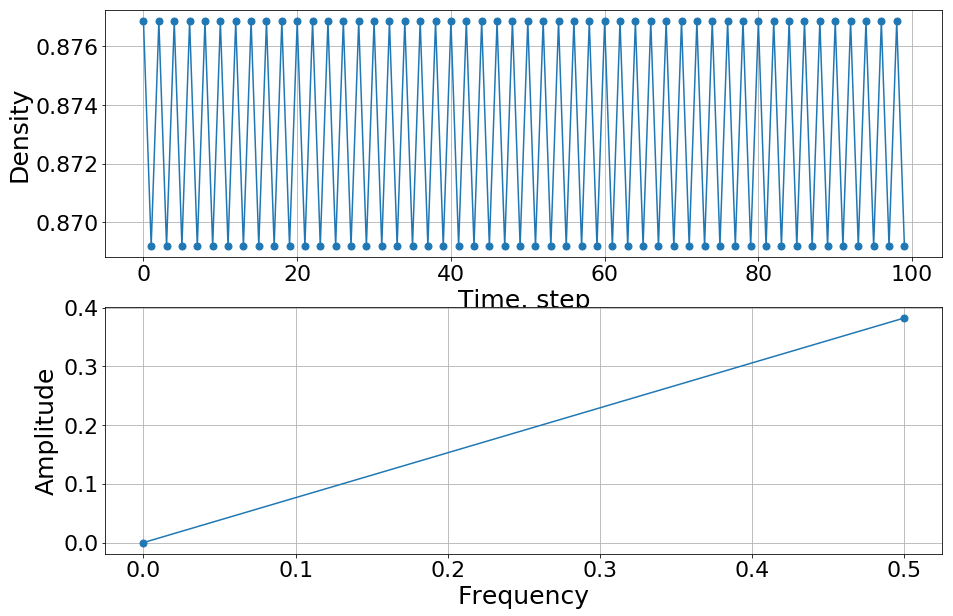

[2.22044605e-14 3.82614019e-01]

===========payoff parameter:  1.1528571428571428 ===========


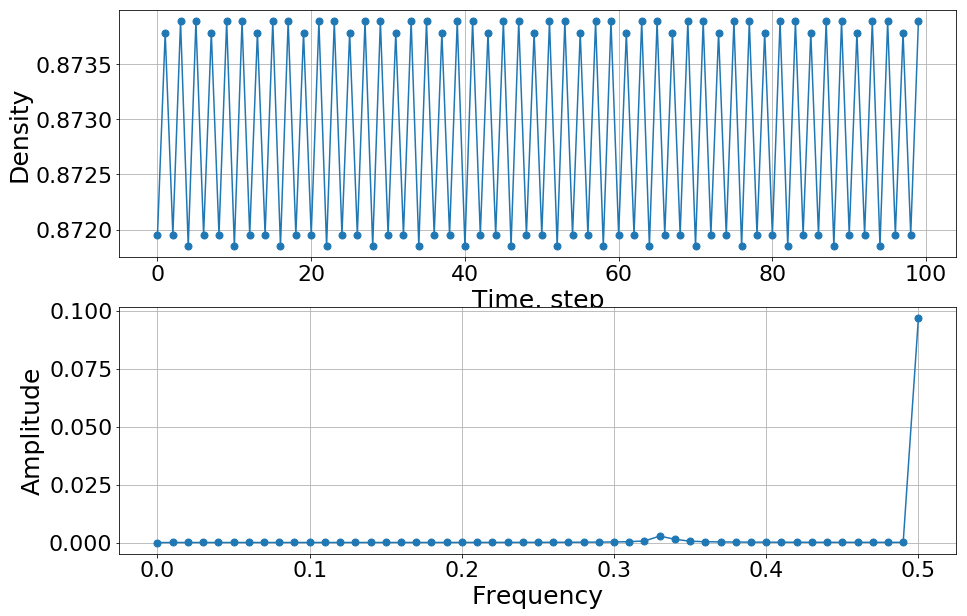

[1.75415238e-14 3.40549348e-05 3.41898666e-05 3.44165427e-05
 3.47377009e-05 3.51572816e-05 3.56805438e-05 3.63142228e-05
 3.70667405e-05 3.79484808e-05 3.89721468e-05 4.01532238e-05
 4.15105816e-05 4.30672637e-05 4.48515268e-05 4.68982296e-05
 4.92507075e-05 5.19633426e-05 5.51051455e-05 5.87648424e-05
 6.30582582e-05 6.81392969e-05 7.42167432e-05 8.15808273e-05
 9.06468762e-05 1.02030405e-04 1.16683660e-04 1.36161536e-04
 1.63186671e-04 2.02997014e-04 2.67119068e-04 3.86843826e-04
 6.87344592e-04 2.79591644e-03 1.42393989e-03 5.81136366e-04
 3.71224869e-04 2.76434584e-04 2.22804334e-04 1.88586710e-04
 1.65088663e-04 1.48158772e-04 1.35568156e-04 1.26017276e-04
 1.18701707e-04 1.13101575e-04 1.08871182e-04 1.05777630e-04
 1.03665268e-04 1.02434668e-04 9.68268544e-02]

===========payoff parameter:  1.1766666666666667 ===========


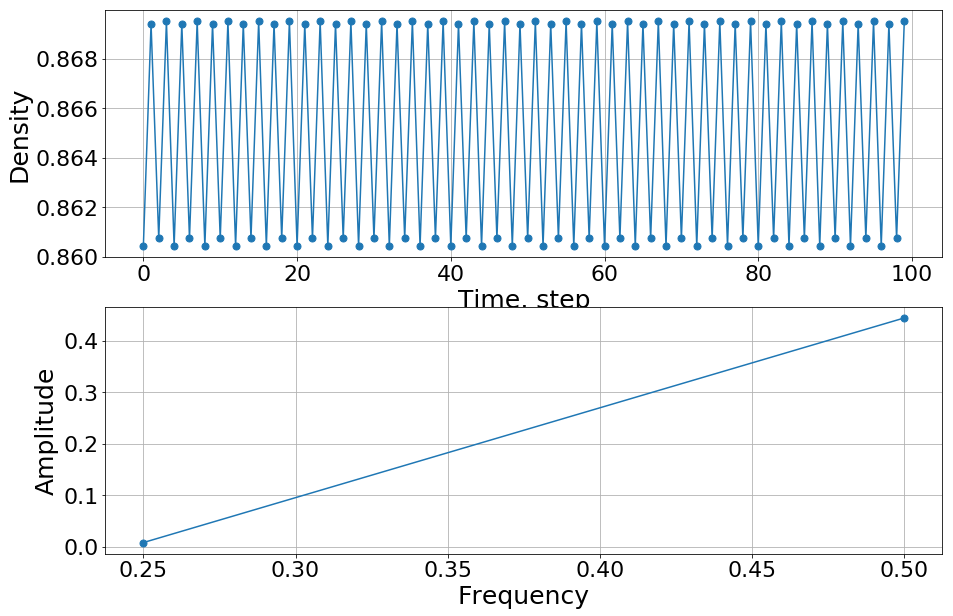

[0.00806621 0.44383226]

===========payoff parameter:  1.21 ===========


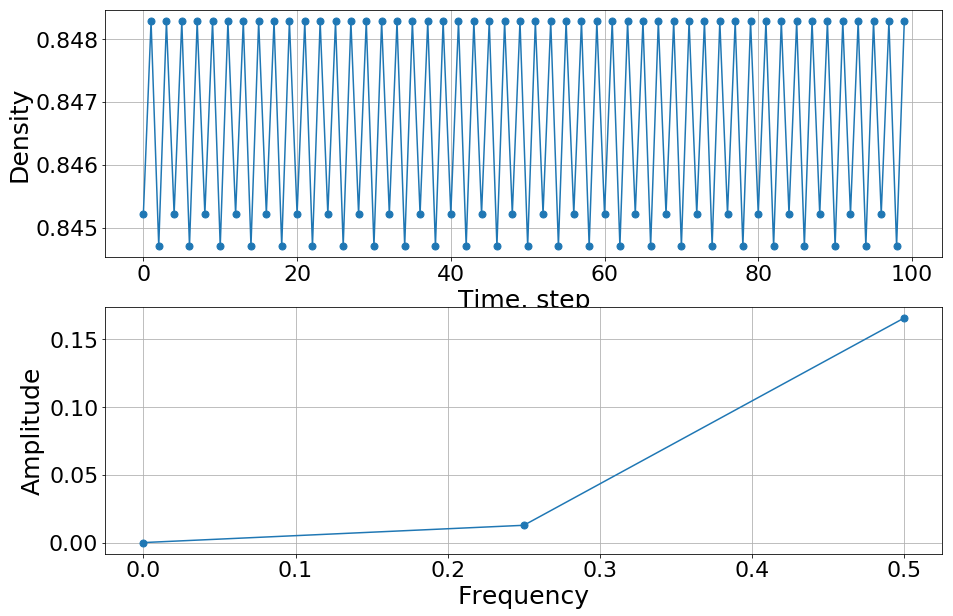

[1.66533454e-14 1.27538006e-02 1.65799408e-01]

===========payoff parameter:  1.26 ===========


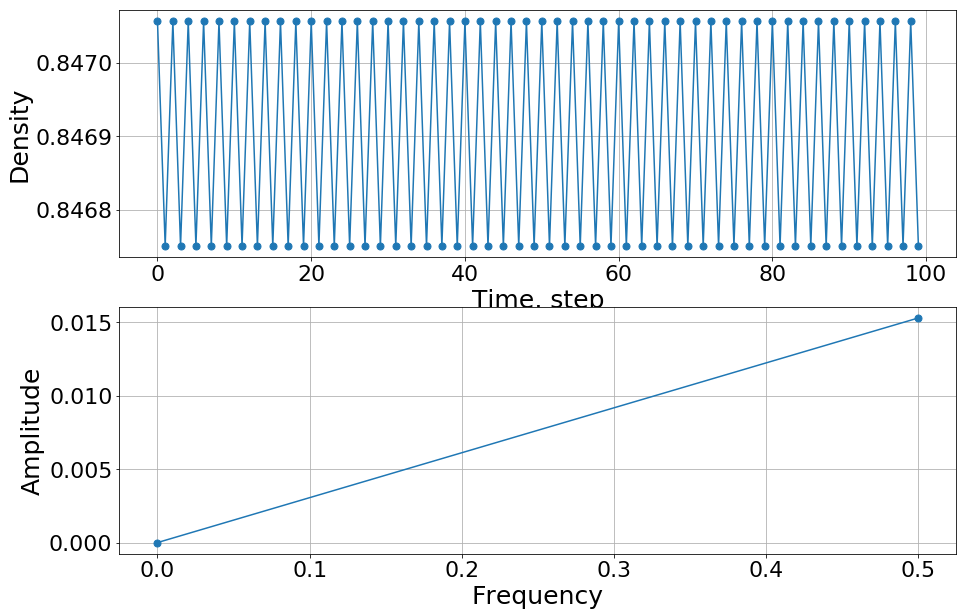

[3.33066907e-14 1.53045608e-02]

===========payoff parameter:  1.2957142857142858 ===========


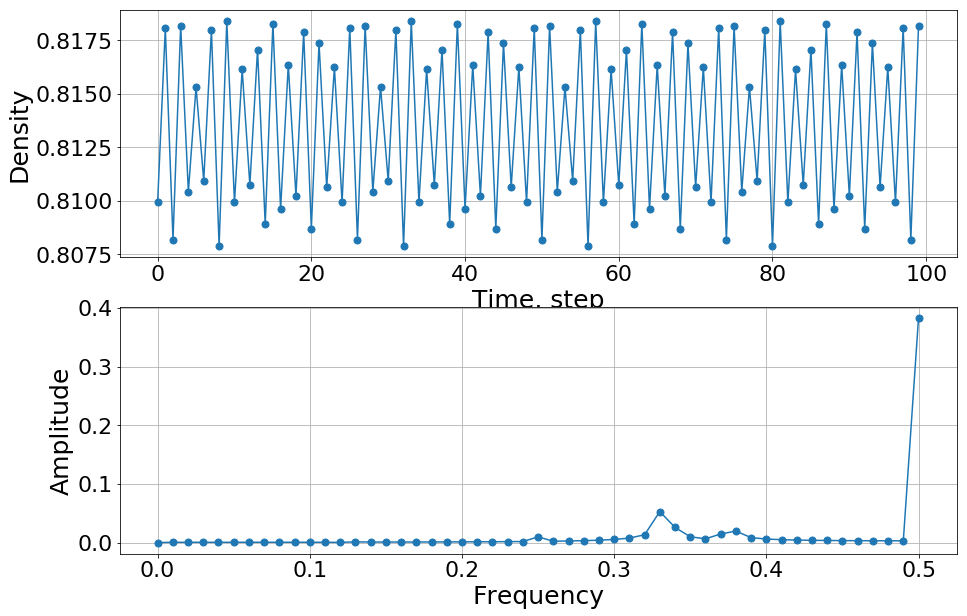

[2.25375274e-14 4.76965577e-04 4.79427872e-04 4.83498965e-04
 4.89115977e-04 4.96156858e-04 5.04386458e-04 5.13340240e-04
 5.22050146e-04 5.28303565e-04 5.26177056e-04 4.94458609e-04
 3.23808317e-04 1.22517956e-03 9.20838047e-04 9.00320306e-04
 9.24884972e-04 9.69777037e-04 1.02944706e-03 1.10305034e-03
 1.19170968e-03 1.29789005e-03 1.42541862e-03 1.57986927e-03
 1.76934294e-03 9.71916597e-03 2.30803673e-03 2.70595471e-03
 3.25201290e-03 4.04621033e-03 5.30695900e-03 7.62330110e-03
 1.33401571e-02 5.28665927e-02 2.57937767e-02 9.88397524e-03
 6.44232215e-03 1.46107511e-02 1.96099119e-02 8.39143762e-03
 6.02029439e-03 4.92951296e-03 4.28739345e-03 3.86365262e-03
 3.56698373e-03 3.35328138e-03 3.19851739e-03 3.08861474e-03
 3.01504369e-03 2.97270766e-03 3.83022141e-01]

===========payoff parameter:  1.3433333333333333 ===========


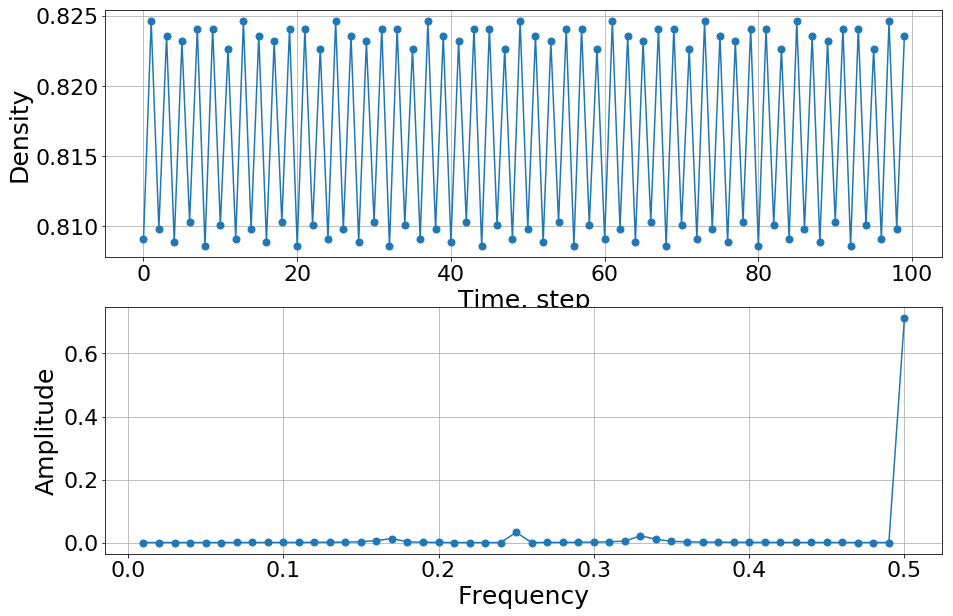

[7.50334521e-04 7.56754659e-04 7.67749303e-04 7.83795185e-04
 8.05637997e-04 8.34392484e-04 8.71711981e-04 9.20081442e-04
 9.83345328e-04 1.06771630e-03 1.18385895e-03 1.35166327e-03
 1.61284905e-03 2.07197388e-03 3.08519050e-03 7.14835215e-03
 1.32026802e-02 3.04393859e-03 1.61110093e-03 1.06186686e-03
 7.98013288e-04 6.73558829e-04 6.34918141e-04 6.55619692e-04
 3.28919505e-02 8.27941092e-04 9.80263028e-04 1.19593767e-03
 1.51401569e-03 2.02393535e-03 2.97097292e-03 5.33842966e-03
 2.19136130e-02 1.12411188e-02 4.61329670e-03 2.95923760e-03
 2.21022883e-03 1.78505868e-03 1.51281457e-03 1.32516608e-03
 1.18947225e-03 1.08820118e-03 1.01112566e-03 9.51911122e-04
 9.06461008e-04 8.72049370e-04 8.46838531e-04 8.29599580e-04
 8.19547133e-04 7.12478319e-01]

===========payoff parameter:  1.41 ===========


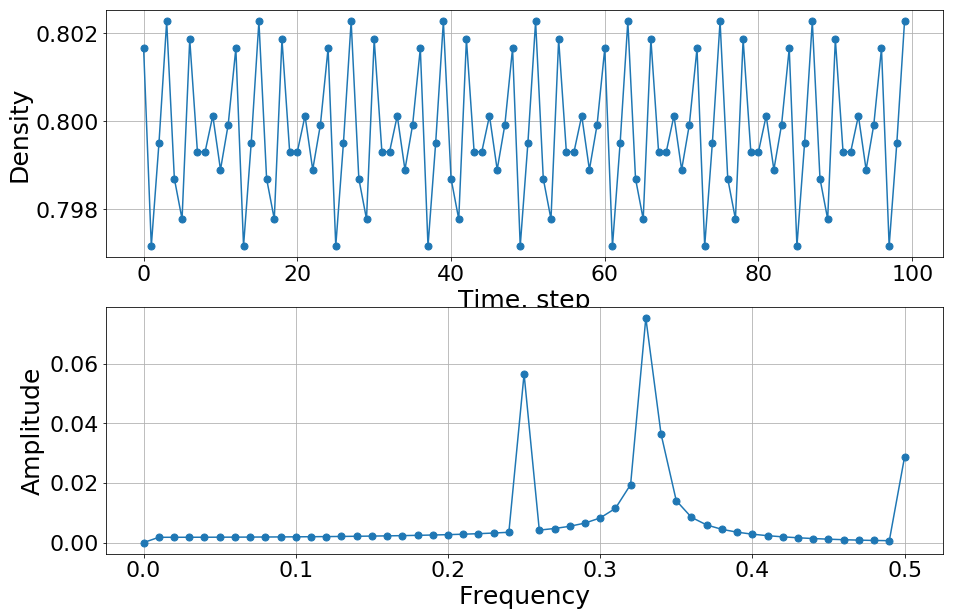

[1.42108547e-14 1.76999443e-03 1.77441159e-03 1.78182362e-03
 1.79230713e-03 1.80597223e-03 1.82296568e-03 1.84347509e-03
 1.86773458e-03 1.89603213e-03 1.92871917e-03 1.96622291e-03
 2.00906247e-03 2.05786988e-03 2.11341784e-03 2.17665669e-03
 2.24876430e-03 2.33121443e-03 2.42587194e-03 2.53512794e-03
 2.66209582e-03 2.81090276e-03 2.98713557e-03 3.19854541e-03
 3.45620569e-03 5.65919347e-02 4.18476061e-03 4.72228441e-03
 5.46135183e-03 6.54093957e-03 8.26676910e-03 1.14686104e-02
 1.94654535e-02 7.54037774e-02 3.64486074e-02 1.40665552e-02
 8.46259503e-03 5.90829478e-03 4.44245164e-03 3.48826965e-03
 2.81509491e-03 2.31273208e-03 1.92204326e-03 1.60868697e-03
 1.35173139e-03 1.13829084e-03 9.60969746e-04 8.16811598e-04
 7.07047201e-04 6.36681887e-04 2.86705438e-02]

===========payoff parameter:  1.51 ===========


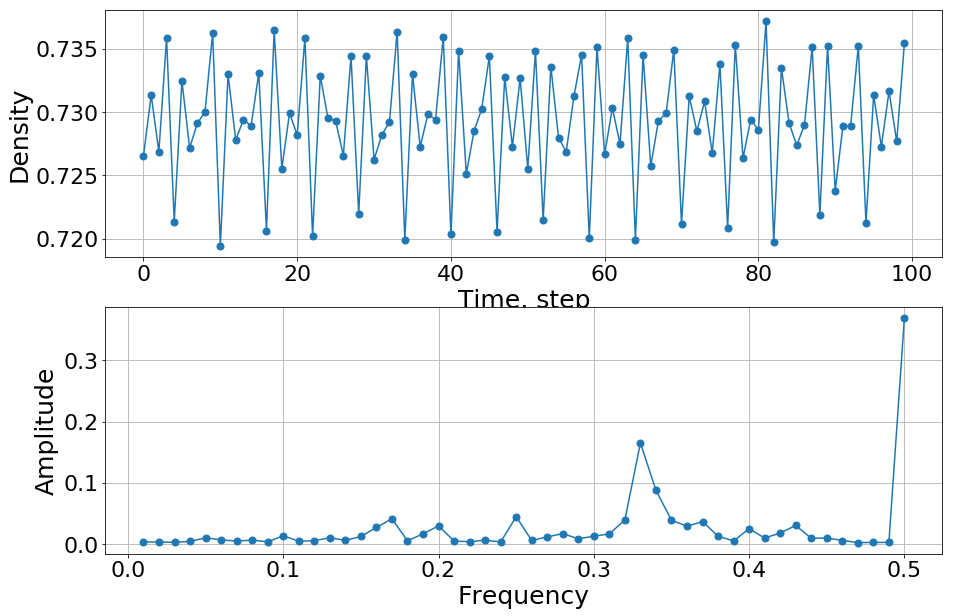

[0.00393035 0.00386219 0.00331228 0.00500582 0.01057717 0.00753452
 0.00533776 0.00705223 0.00415565 0.01408581 0.00519245 0.00593977
 0.01085887 0.00652529 0.01287013 0.02761941 0.04173109 0.00581664
 0.01718603 0.03011426 0.00550159 0.00436477 0.00692886 0.00394657
 0.04513862 0.00648835 0.012154   0.01767297 0.00905841 0.01348725
 0.01705501 0.03989795 0.16513174 0.08808233 0.03933021 0.02960864
 0.03709704 0.01329549 0.00565028 0.02558982 0.01036584 0.01849388
 0.03086684 0.00990618 0.01047718 0.00633617 0.00297404 0.00315936
 0.00324584 0.36863585]

===========payoff parameter:  1.61 ===========


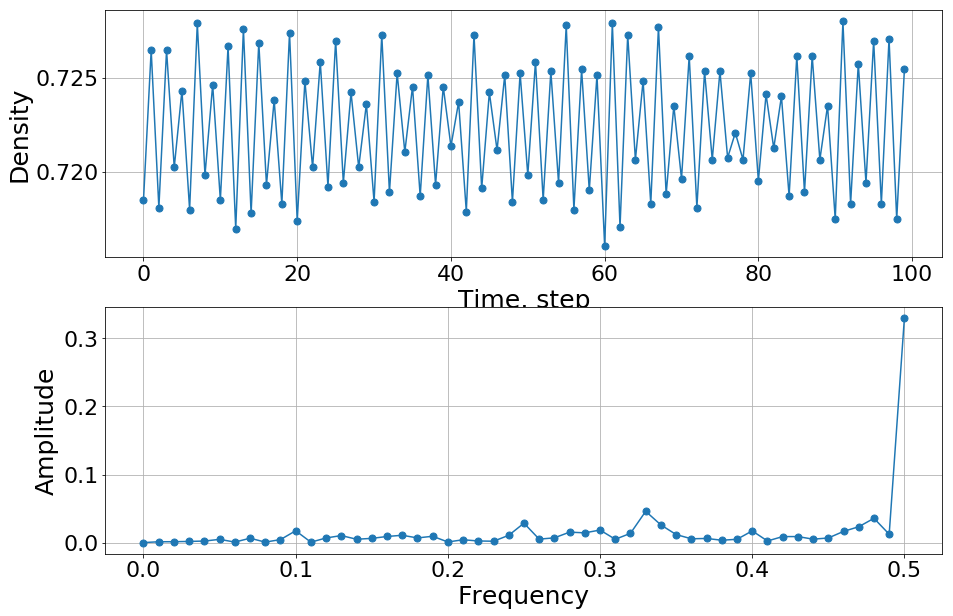

[1.62092562e-14 1.16815392e-03 1.27918258e-03 1.66719010e-03
 2.21795272e-03 4.72379934e-03 7.21101617e-04 6.38104519e-03
 6.67295537e-04 4.38487229e-03 1.73233178e-02 5.98563490e-04
 6.77646718e-03 1.02949658e-02 4.88744343e-03 6.16942433e-03
 8.92854246e-03 1.07392529e-02 6.82520706e-03 9.26321056e-03
 8.73867243e-04 4.12984007e-03 2.34154590e-03 1.96525511e-03
 1.06558677e-02 2.84979159e-02 5.04355652e-03 6.94589290e-03
 1.53176777e-02 1.42917684e-02 1.84200261e-02 4.82069748e-03
 1.35894057e-02 4.59428199e-02 2.58847626e-02 1.17657143e-02
 5.57094002e-03 6.02718959e-03 3.44118758e-03 4.82796789e-03
 1.71564800e-02 2.34729744e-03 8.79940391e-03 8.81972528e-03
 5.00165432e-03 6.73290302e-03 1.64268935e-02 2.32488830e-02
 3.56612042e-02 1.22273522e-02 3.30068360e-01]

===========payoff parameter:  1.6766666666666667 ===========


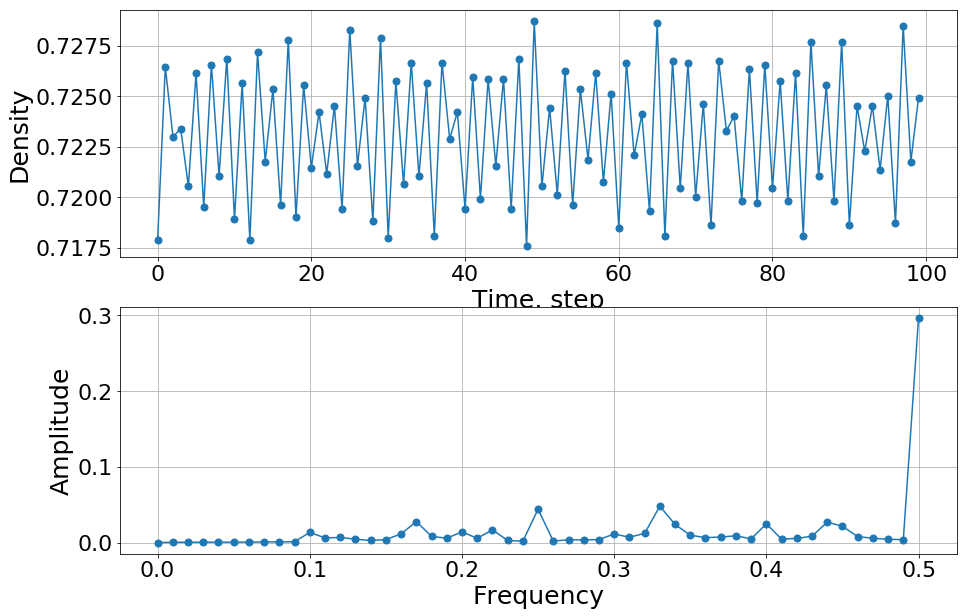

[1.80966353e-14 3.84271763e-04 3.99727519e-04 5.55288046e-04
 5.75647821e-04 5.63594903e-04 6.36962152e-04 8.41197761e-04
 9.16336035e-04 1.16114681e-03 1.34279861e-02 6.15544785e-03
 6.77745733e-03 4.48180228e-03 2.77508716e-03 3.89717383e-03
 1.15691865e-02 2.77008752e-02 8.26660143e-03 5.70968258e-03
 1.41792995e-02 5.59553852e-03 1.68187260e-02 2.80468560e-03
 1.77747415e-03 4.41434521e-02 1.90558737e-03 3.75812386e-03
 3.44094769e-03 3.99886794e-03 1.13673115e-02 7.02481907e-03
 1.21066869e-02 4.80236065e-02 2.40052250e-02 9.73103171e-03
 6.50907609e-03 7.29349948e-03 8.99281515e-03 4.92008089e-03
 2.47334779e-02 4.54269711e-03 5.50987460e-03 8.36766964e-03
 2.70457700e-02 2.15253612e-02 7.88100349e-03 5.66209794e-03
 4.32577721e-03 3.83019767e-03 2.96704418e-01]

===========payoff parameter:  1.76 ===========


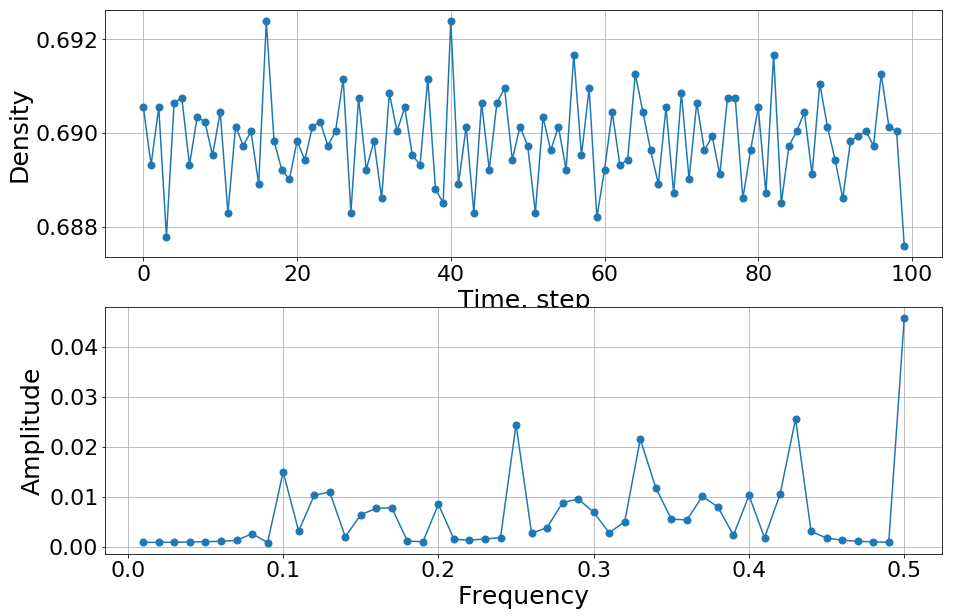

[0.00083237 0.00084489 0.00086787 0.00090538 0.00096558 0.00106564
 0.00121839 0.00258338 0.00079657 0.01495495 0.00310727 0.01024213
 0.01095225 0.00195576 0.00637138 0.00766276 0.00777187 0.00108815
 0.00096383 0.00847699 0.00147689 0.00126358 0.00152675 0.00177208
 0.02445007 0.00264939 0.00381016 0.00882494 0.00952517 0.00686204
 0.00275781 0.00500453 0.02152689 0.01176381 0.00549332 0.00532786
 0.01004639 0.00792207 0.00226256 0.01024389 0.00175832 0.01046302
 0.02558758 0.00301493 0.00171402 0.00127194 0.00105599 0.00093778
 0.00087661 0.04581165]

===========payoff parameter:  1.81 ===========


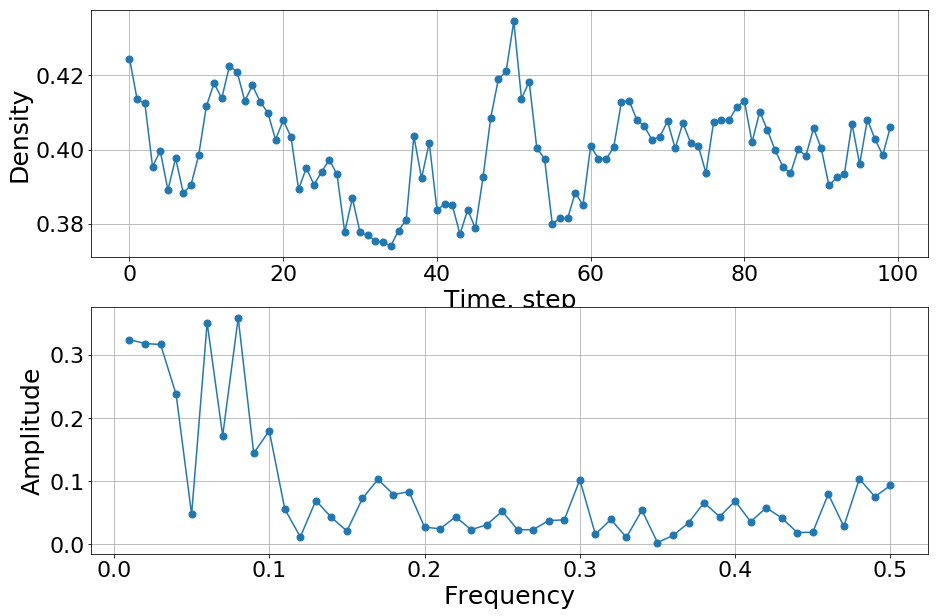

[0.3241464  0.31794936 0.31649755 0.23769181 0.04766649 0.35099609
 0.17201551 0.35848409 0.14431719 0.18007546 0.0560515  0.01188182
 0.06949033 0.04282905 0.02128894 0.07273324 0.10311037 0.07900912
 0.08345987 0.02745415 0.02473927 0.04373983 0.02343455 0.03100151
 0.05263078 0.0230654  0.02349873 0.03778621 0.03895366 0.10232479
 0.01611067 0.0395615  0.01130144 0.05413025 0.00298084 0.01417465
 0.03423092 0.0662174  0.04396128 0.06866843 0.03600033 0.05810878
 0.04202431 0.01886412 0.01927374 0.07974969 0.02852758 0.10379832
 0.07554039 0.09335782]

===========payoff parameter:  2.01 ===========


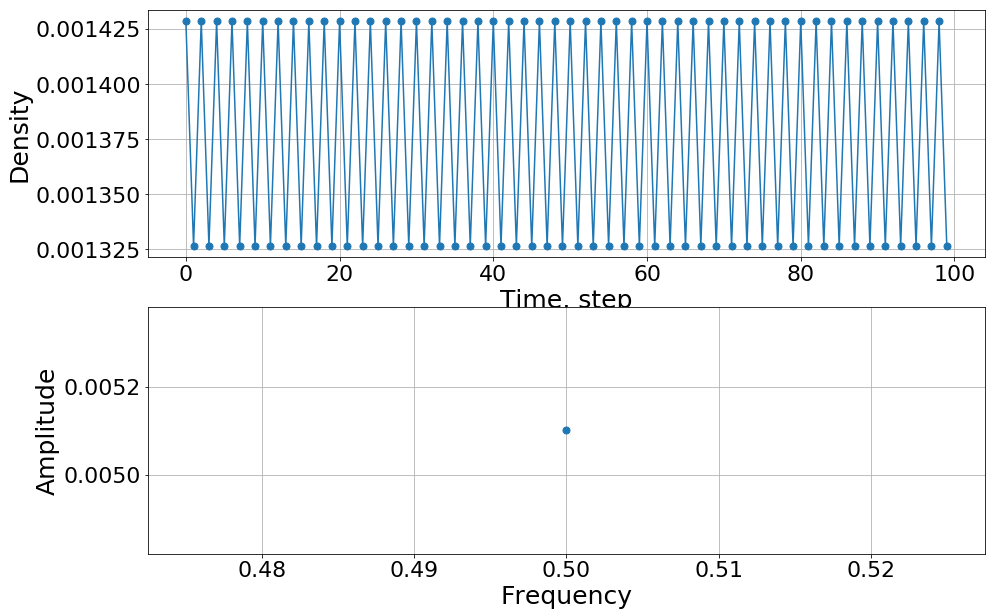

[0.00510152]

===========payoff parameter:  2.26 ===========


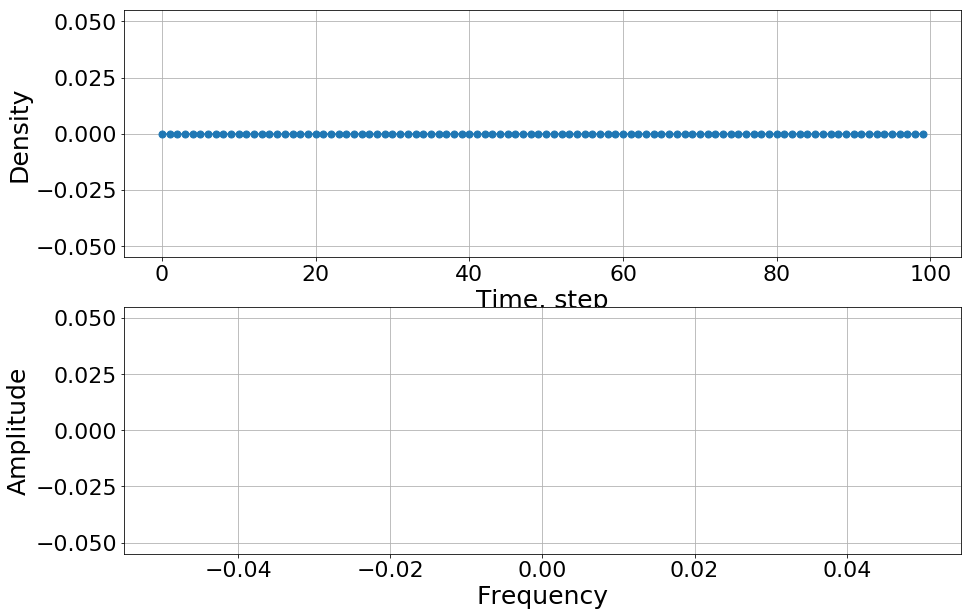

[]

===========payoff parameter:  2.3433333333333333 ===========


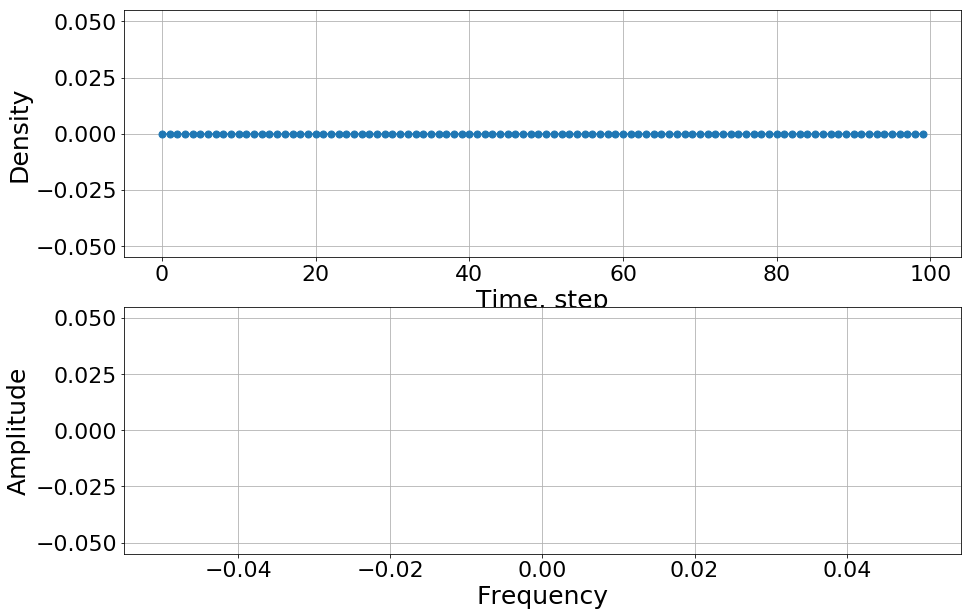

[]

===========payoff parameter:  2.51 ===========


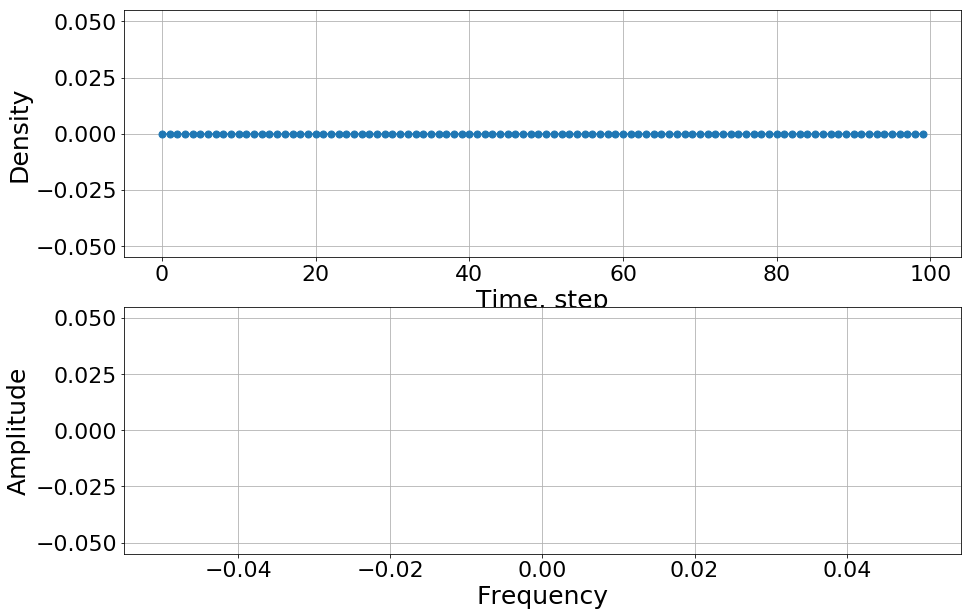

[]

===========payoff parameter:  2.6766666666666663 ===========


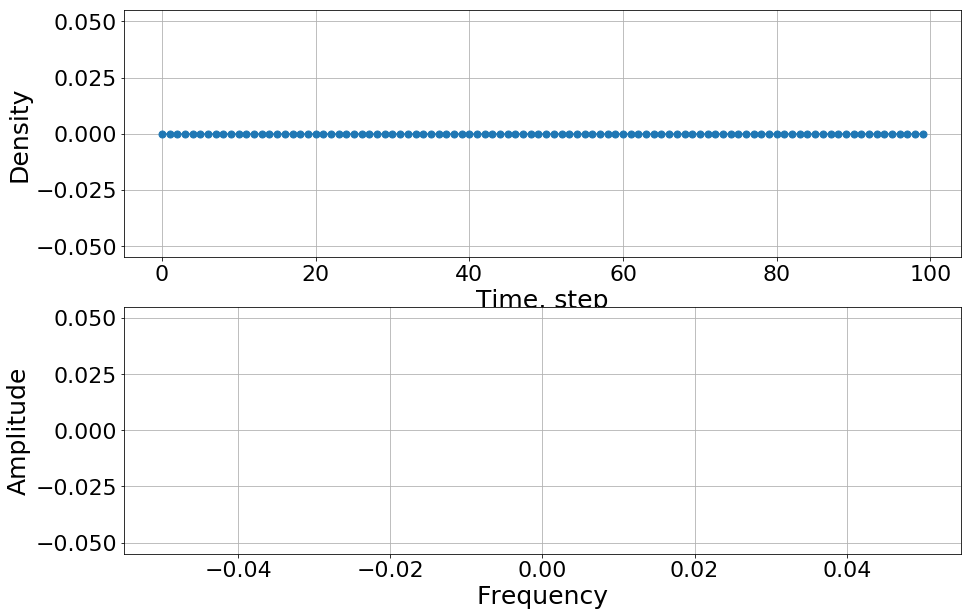

[]


In [7]:
den70=c_density(percentage=70)
for i in range(len(b_points)):
    print('\n===========payoff parameter: ',b_points[i],'===========')
    fourier(den70[i])

# off_percentage = 50

### cooperator percentage = 21


===========payoff parameter:  1.01 ===========


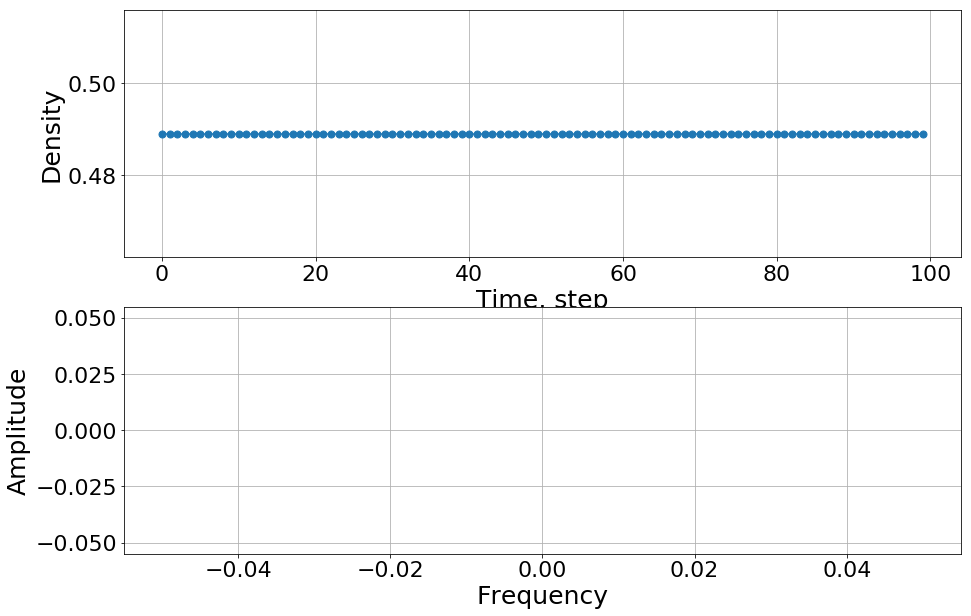

[]

===========payoff parameter:  1.135 ===========


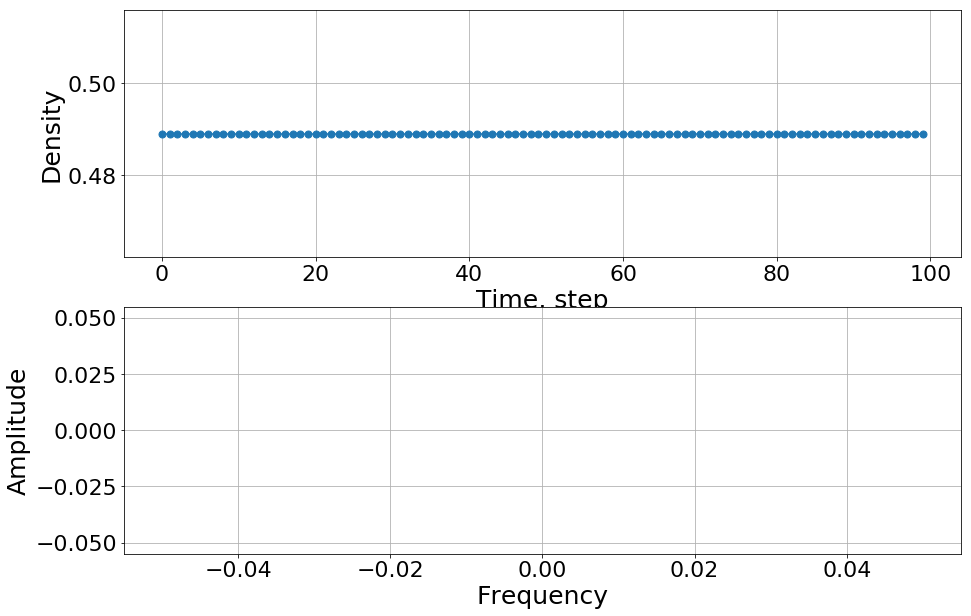

[]

===========payoff parameter:  1.1528571428571428 ===========


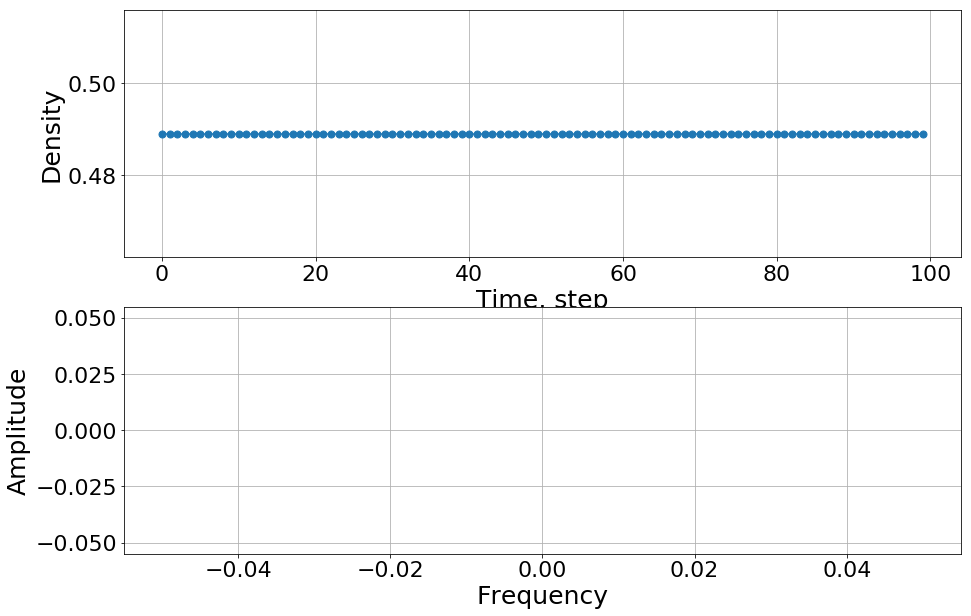

[]

===========payoff parameter:  1.1766666666666667 ===========


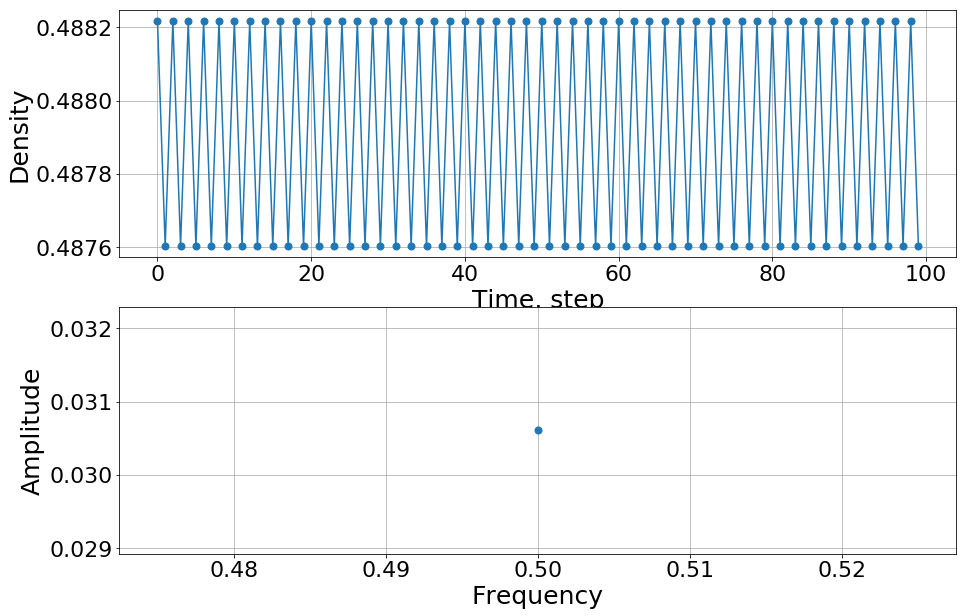

[0.03060912]

===========payoff parameter:  1.21 ===========


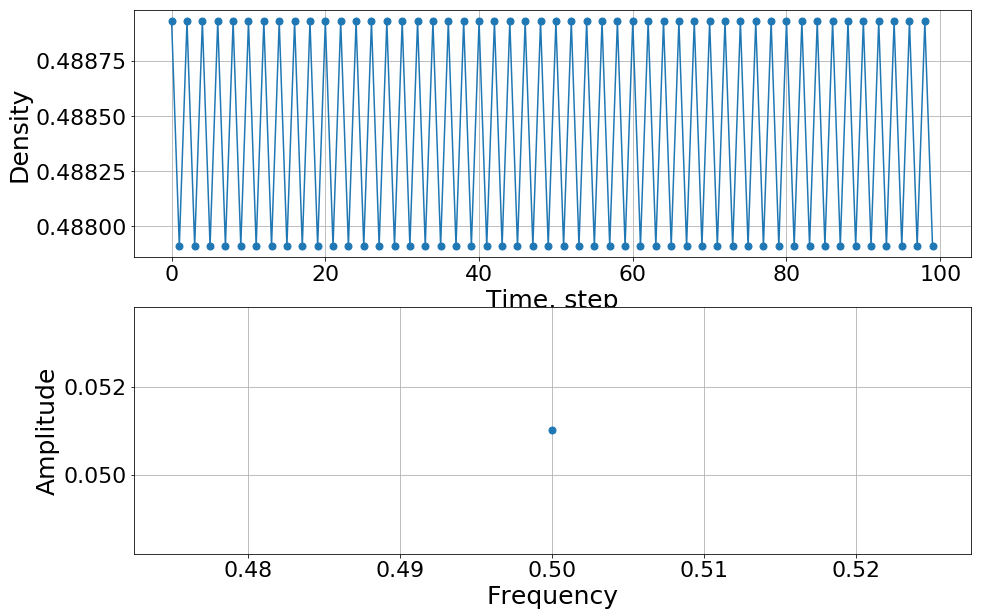

[0.0510152]

===========payoff parameter:  1.26 ===========


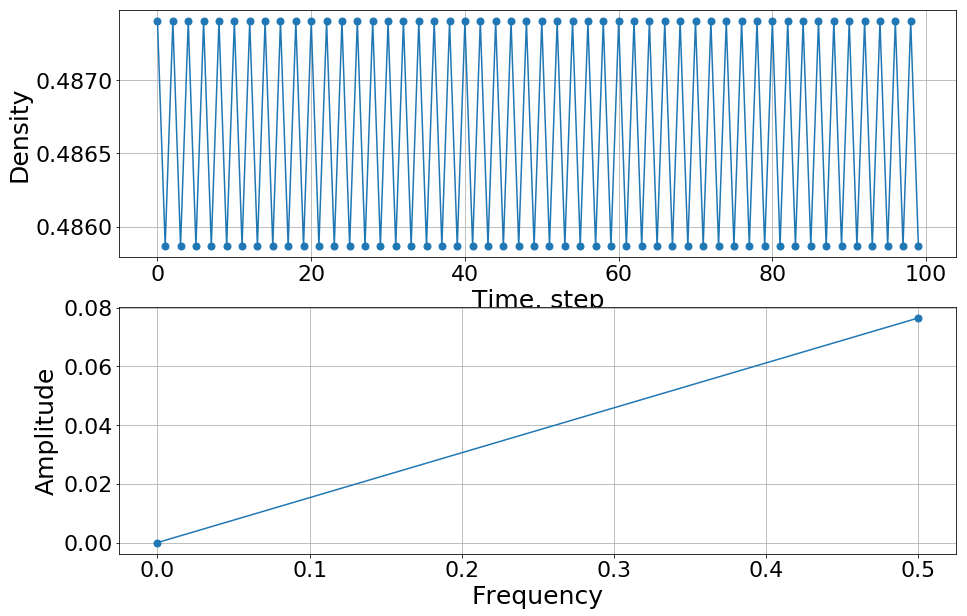

[1.11022302e-14 7.65228038e-02]

===========payoff parameter:  1.2957142857142858 ===========


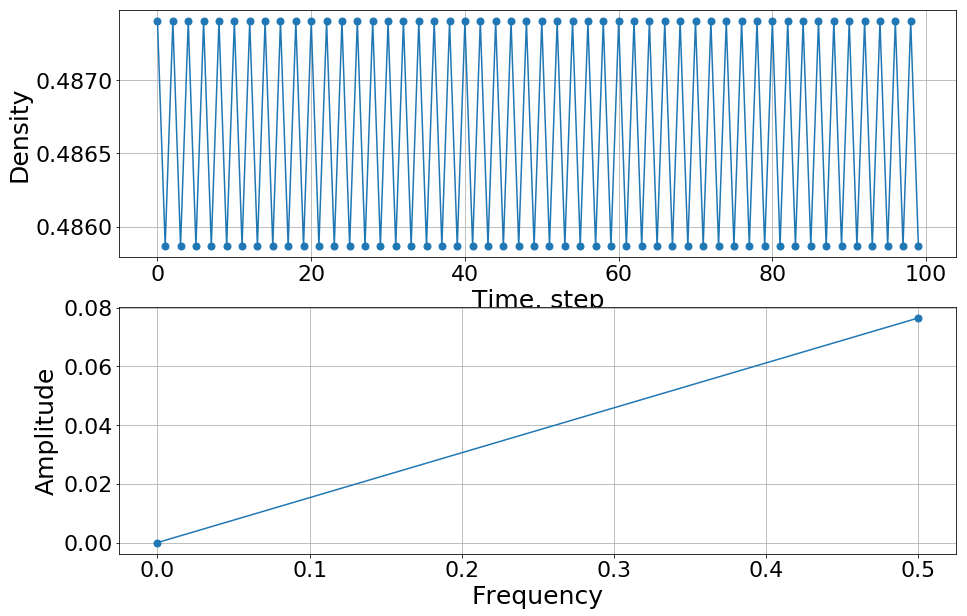

[1.11022302e-14 7.65228038e-02]

===========payoff parameter:  1.3433333333333333 ===========


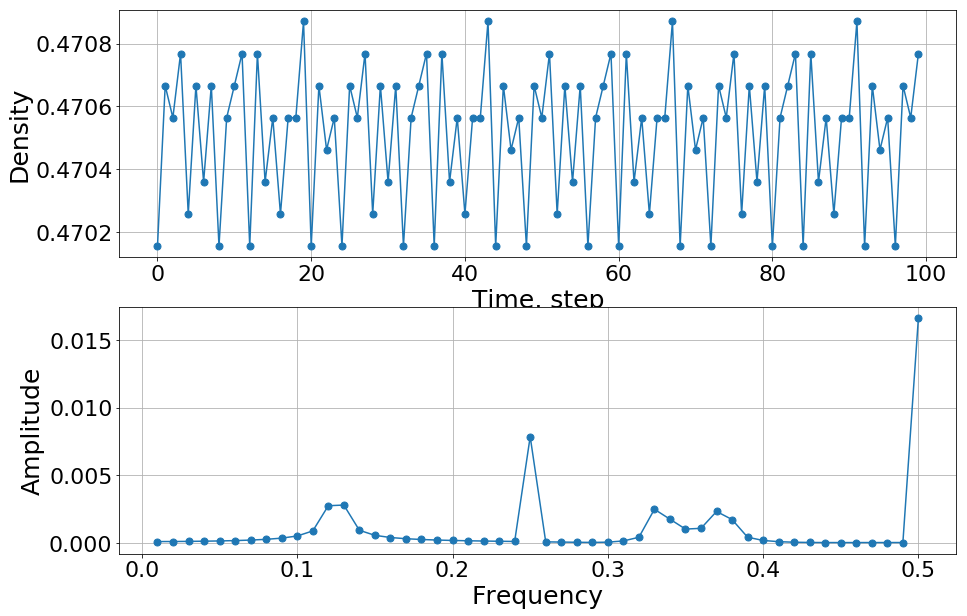

[1.20753149e-04 1.25998352e-04 1.35076017e-04 1.48595685e-04
 1.67655024e-04 1.94194666e-04 2.31735757e-04 2.87097653e-04
 3.75061931e-04 5.34238137e-04 9.06409656e-04 2.76807952e-03
 2.81657433e-03 9.54575012e-04 5.81724305e-04 4.21477192e-04
 3.31983637e-04 2.74538282e-04 2.34228459e-04 2.04060810e-04
 1.80288341e-04 1.60682682e-04 1.43785048e-04 1.28536522e-04
 7.86693461e-03 9.96155970e-05 8.45004432e-05 6.88911540e-05
 5.83371741e-05 7.79442937e-05 1.66874086e-04 4.37656053e-04
 2.50695107e-03 1.77424692e-03 1.04338333e-03 1.09865861e-03
 2.34440203e-03 1.74802217e-03 4.42957899e-04 2.04060810e-04
 1.14001685e-04 7.32495333e-05 5.52720962e-05 4.88501304e-05
 4.76272788e-05 4.82624502e-05 4.93117416e-05 5.02265645e-05
 5.08147112e-05 1.66309560e-02]

===========payoff parameter:  1.41 ===========


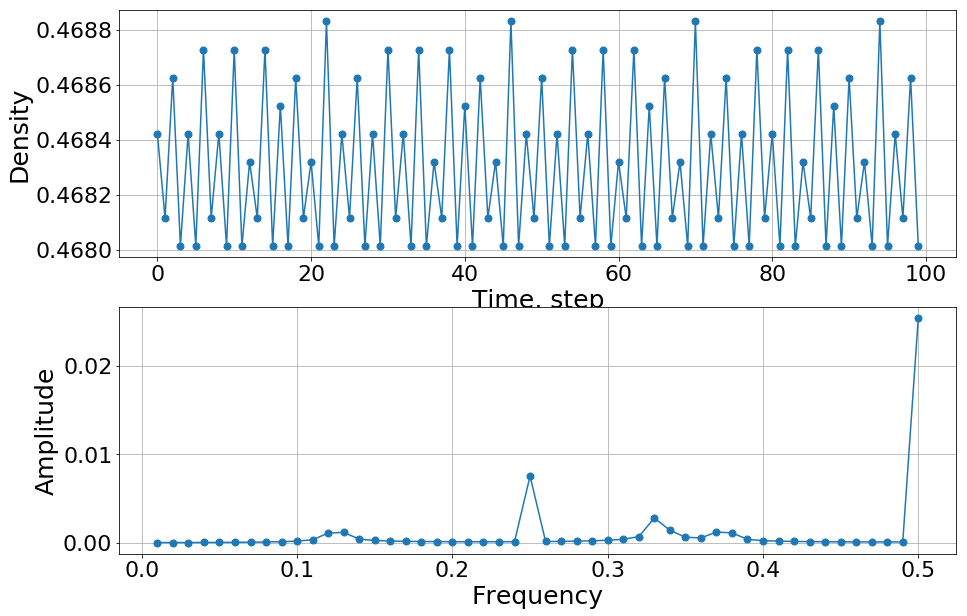

[3.46617568e-05 3.66504461e-05 4.00913654e-05 4.52231240e-05
 5.24867857e-05 6.26729364e-05 7.72241576e-05 9.89397072e-05
 1.33891700e-04 1.97947717e-04 3.49396619e-04 1.11311766e-03
 1.18530805e-03 4.21940313e-04 2.71204795e-04 2.08236157e-04
 1.74767306e-04 1.54961618e-04 1.42789466e-04 1.35509747e-04
 1.31761231e-04 1.30871702e-04 1.32580569e-04 1.36936111e-04
 7.55093934e-03 1.55401798e-04 1.71645390e-04 1.95573942e-04
 2.32219392e-04 2.92812473e-04 4.08146628e-04 7.02437979e-04
 2.80089131e-03 1.43824250e-03 6.39587424e-04 5.60205205e-04
 1.21635376e-03 1.13443799e-03 3.95007169e-04 2.54791556e-04
 1.96055915e-04 1.63688262e-04 1.43266192e-04 1.29402052e-04
 1.19627733e-04 1.12655924e-04 1.07757720e-04 1.04502613e-04
 1.02638005e-04 2.54055709e-02]

===========payoff parameter:  1.51 ===========


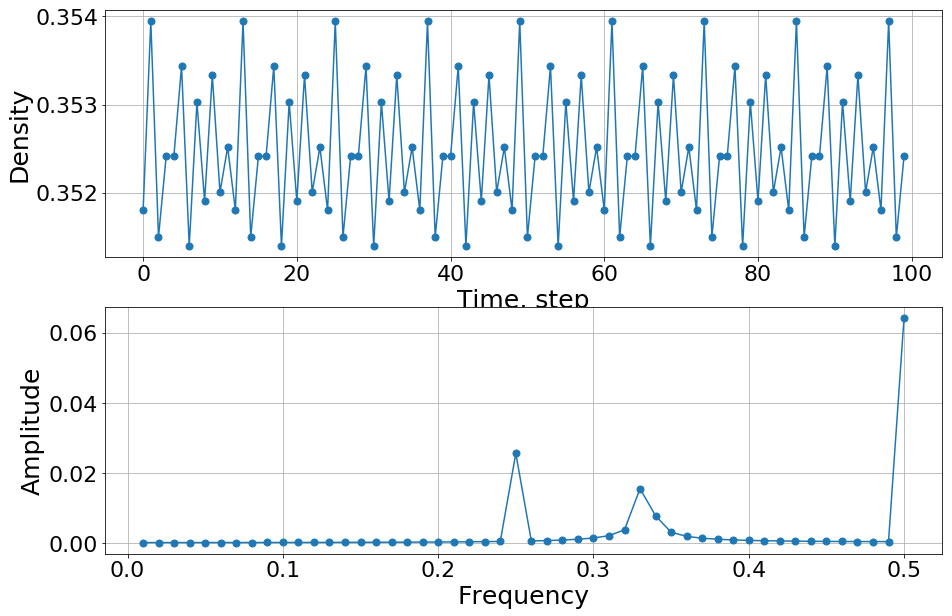

[0.00023833 0.0002391  0.00024039 0.00024223 0.00024462 0.00024761
 0.00025122 0.00025551 0.00026053 0.00026635 0.00027306 0.00028077
 0.00028959 0.0002997  0.00031128 0.00032457 0.00033988 0.00035759
 0.00037819 0.00040233 0.00043087 0.00046496 0.00050622 0.00055697
 0.02564233 0.00070249 0.00081123 0.00096199 0.00118394 0.00154125
 0.00220815 0.00388156 0.01562188 0.00787299 0.00318018 0.00201117
 0.00148313 0.00118427 0.00099351 0.00086245 0.00076797 0.00069767
 0.00064432 0.00060343 0.00057211 0.00054845 0.00053113 0.00051931
 0.00051242 0.06427916]

===========payoff parameter:  1.61 ===========


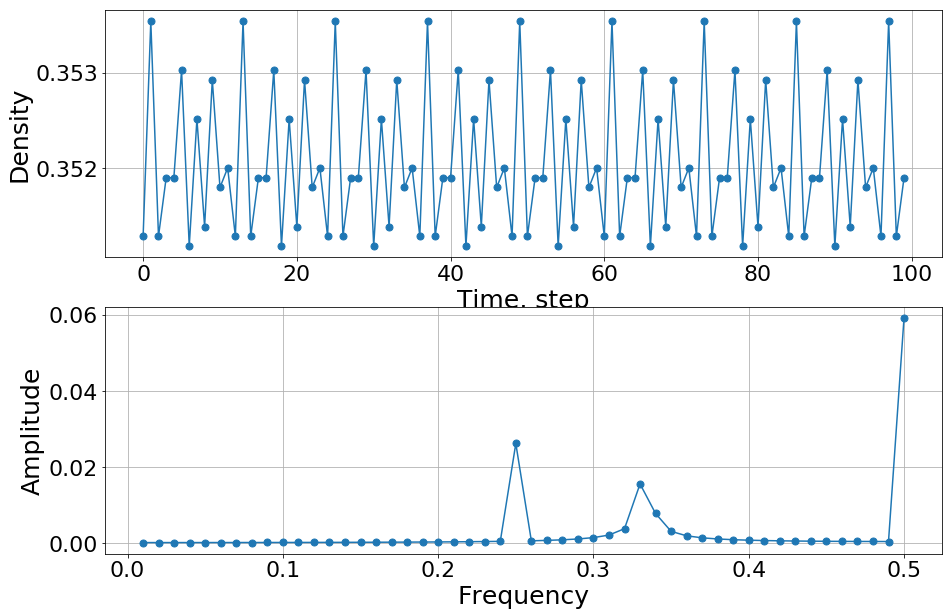

[0.00023833 0.0002391  0.00024039 0.00024223 0.00024462 0.00024761
 0.00025122 0.00025551 0.00026053 0.00026635 0.00027306 0.00028077
 0.00028959 0.0002997  0.00031128 0.00032457 0.00033988 0.00035759
 0.00037819 0.00040233 0.00043087 0.00046496 0.00050622 0.00055697
 0.02623432 0.00070249 0.00081123 0.00096199 0.00118394 0.00154125
 0.00220815 0.00388156 0.01562188 0.00787299 0.00318018 0.00201117
 0.00148313 0.00118427 0.00099351 0.00086245 0.00076797 0.00069767
 0.00064432 0.00060343 0.00057211 0.00054845 0.00053113 0.00051931
 0.00051242 0.05917763]

===========payoff parameter:  1.6766666666666667 ===========


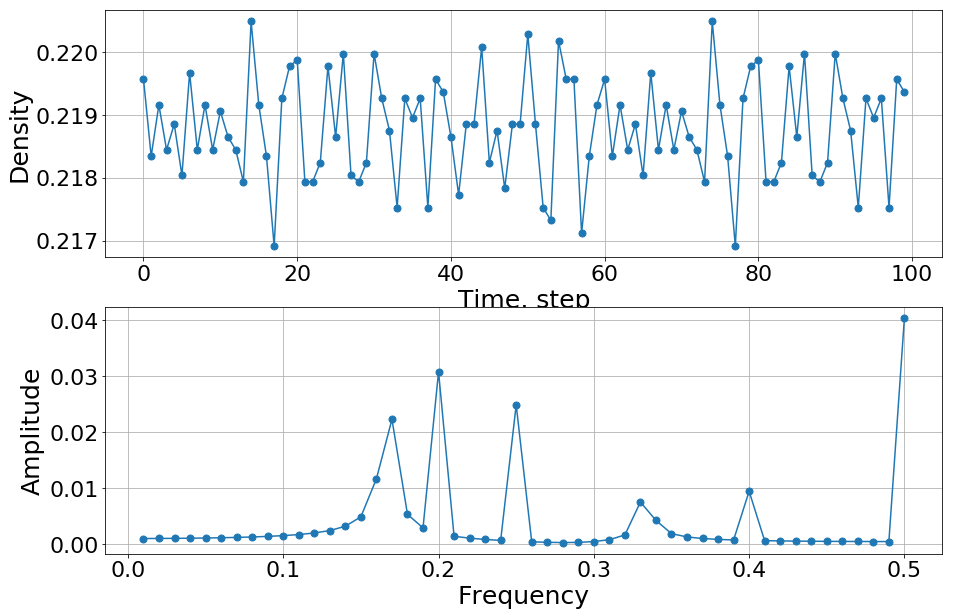

[0.00098966 0.00099992 0.00101751 0.00104324 0.00107837 0.00112479
 0.00118529 0.00126408 0.00136764 0.00150648 0.00169855 0.00197729
 0.00241272 0.00317987 0.00487398 0.01166148 0.02228813 0.00531361
 0.00288711 0.03077844 0.00138684 0.00105356 0.00082115 0.00064726
 0.02487743 0.00039882 0.00031162 0.00026353 0.00029463 0.00044468
 0.00077771 0.00162465 0.00750842 0.00422485 0.00186484 0.0012677
 0.00099219 0.0008324  0.00072778 0.00942582 0.00059961 0.00055818
 0.00052609 0.00050104 0.00048157 0.00046665 0.00045563 0.00044804
 0.0004436  0.04040404]

===========payoff parameter:  1.76 ===========


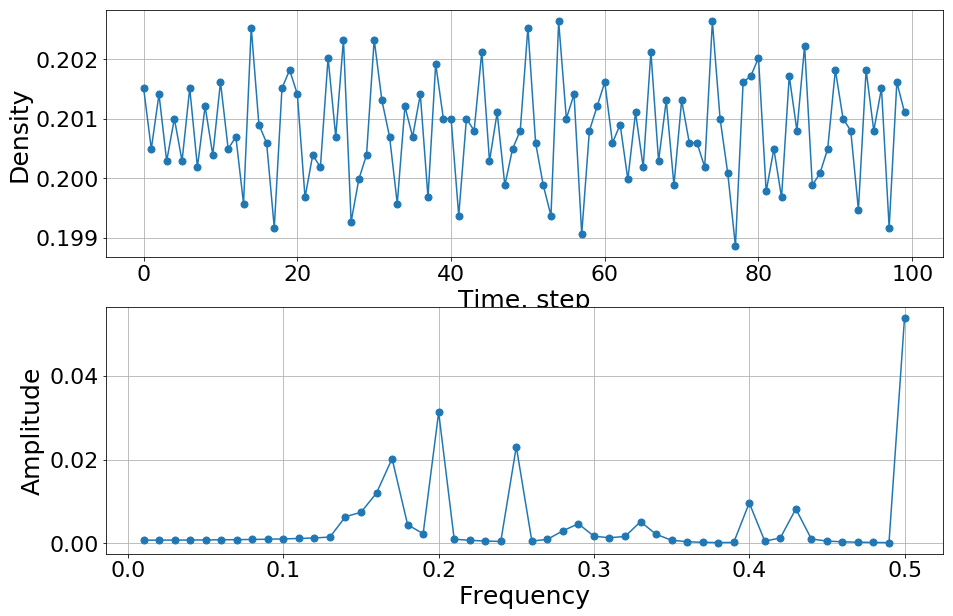

[0.00078924 0.00079578 0.00080693 0.00082313 0.00084503 0.00087356
 0.00091005 0.00095633 0.00101498 0.00108953 0.00118479 0.00130923
 0.0015376  0.00639746 0.00743077 0.01205016 0.02022612 0.00448623
 0.00231431 0.0312671  0.00102447 0.00075362 0.00057902 0.00047624
 0.02307444 0.00057045 0.00098004 0.00302788 0.0046912  0.00171936
 0.00137241 0.00166164 0.00519337 0.00218255 0.00076046 0.00041968
 0.00027626 0.00022027 0.00023726 0.00966176 0.00055767 0.00130323
 0.00824391 0.00106338 0.00057528 0.00039341 0.00029864 0.00024365
 0.0002137  0.05377002]

===========payoff parameter:  1.81 ===========


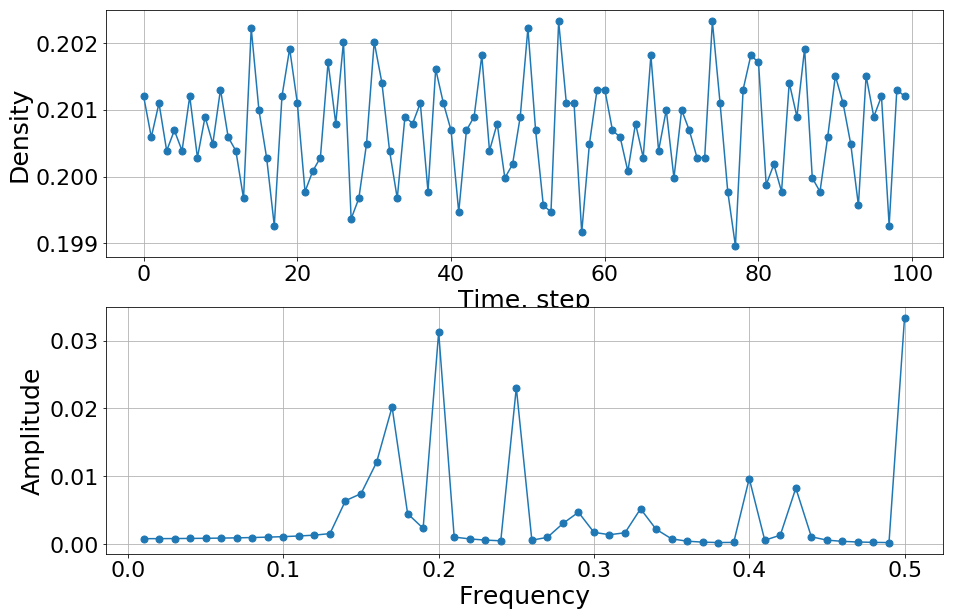

[0.00078924 0.00079578 0.00080693 0.00082313 0.00084503 0.00087356
 0.00091005 0.00095633 0.00101498 0.00108953 0.00118479 0.00130923
 0.0015376  0.00639746 0.00743077 0.01205016 0.02022612 0.00448623
 0.00231431 0.0312671  0.00102447 0.00075362 0.00057902 0.00047624
 0.02307444 0.00057045 0.00098004 0.00302788 0.0046912  0.00171936
 0.00137241 0.00166164 0.00519337 0.00218255 0.00076046 0.00041968
 0.00027626 0.00022027 0.00023726 0.00966176 0.00055767 0.00130323
 0.00824391 0.00106338 0.00057528 0.00039341 0.00029864 0.00024365
 0.0002137  0.03336394]

===========payoff parameter:  2.01 ===========


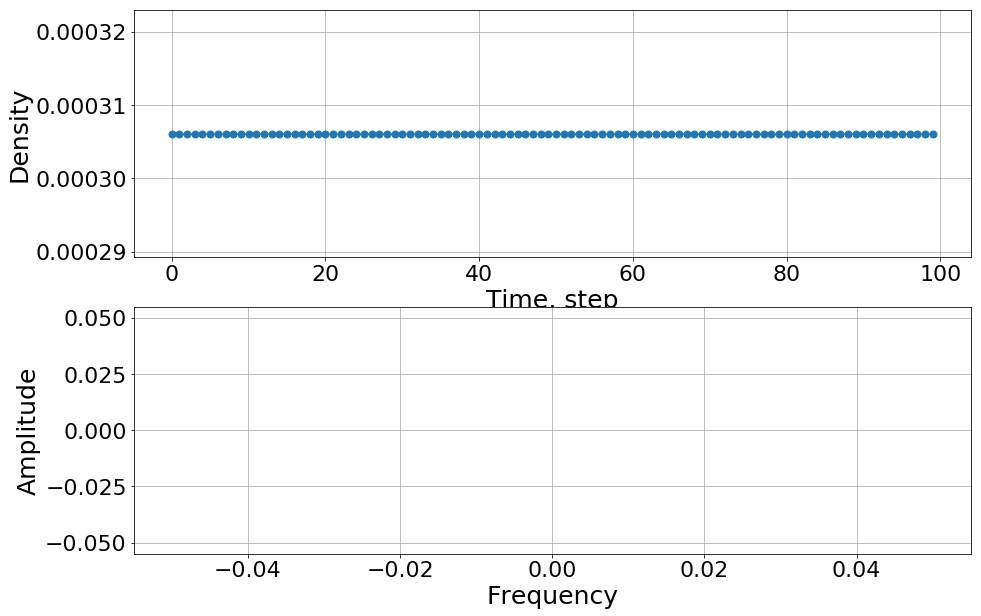

[]

===========payoff parameter:  2.26 ===========


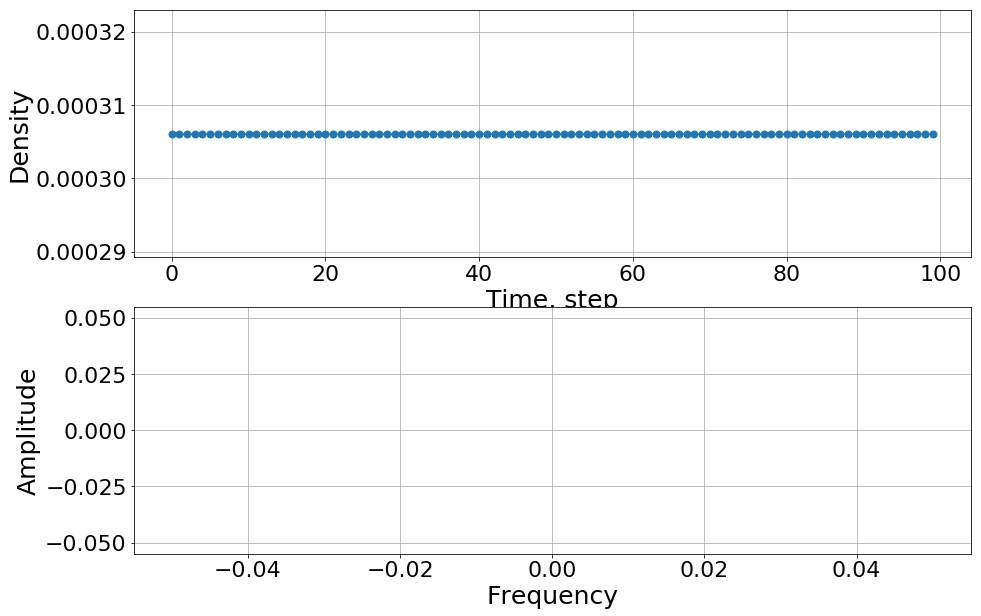

[]

===========payoff parameter:  2.3433333333333333 ===========


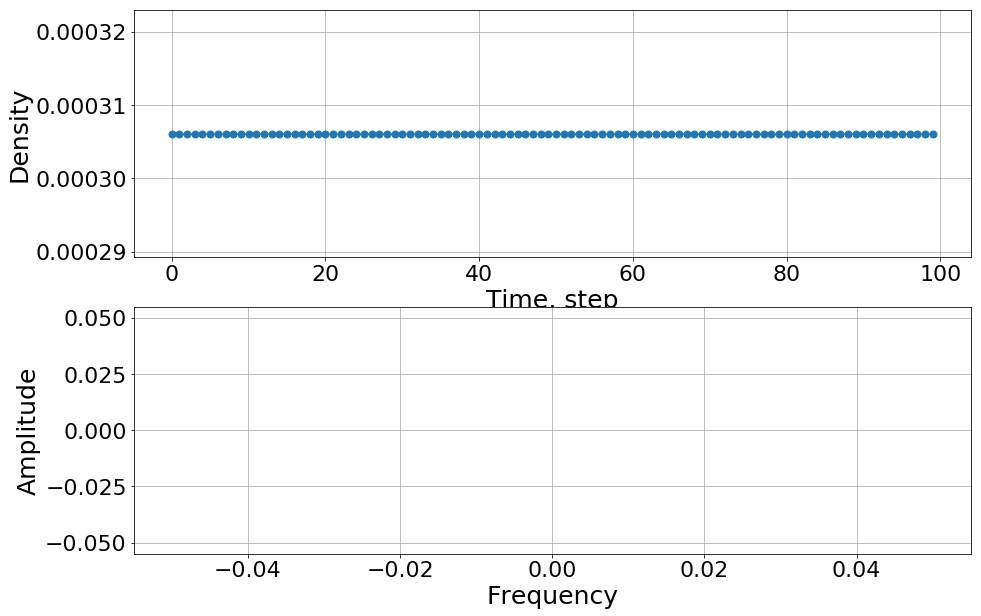

[]

===========payoff parameter:  2.51 ===========


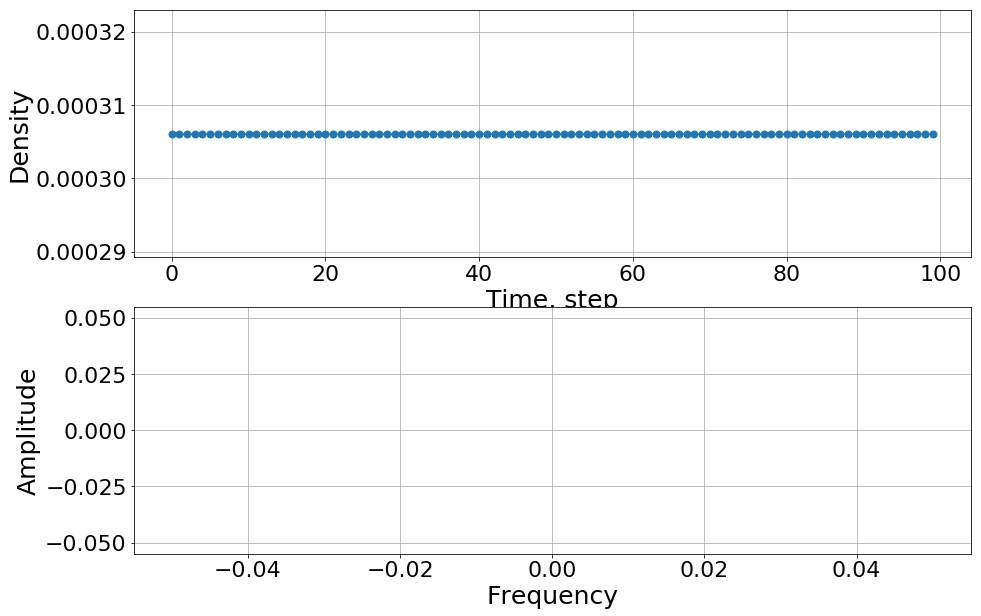

[]

===========payoff parameter:  2.6766666666666663 ===========


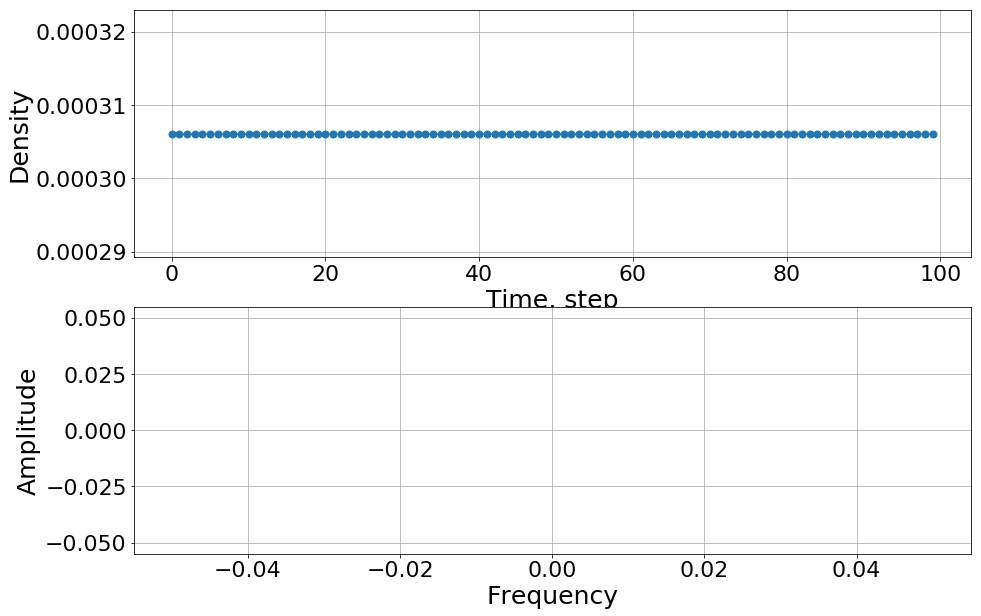

[]


In [8]:
den21=c_density(off_percentage=50)
for i in range(len(b_points)):
    print('\n===========payoff parameter: ',b_points[i],'===========')
    fourier(den21[i])

### cooperator percentage = 50


===========payoff parameter:  1.01 ===========


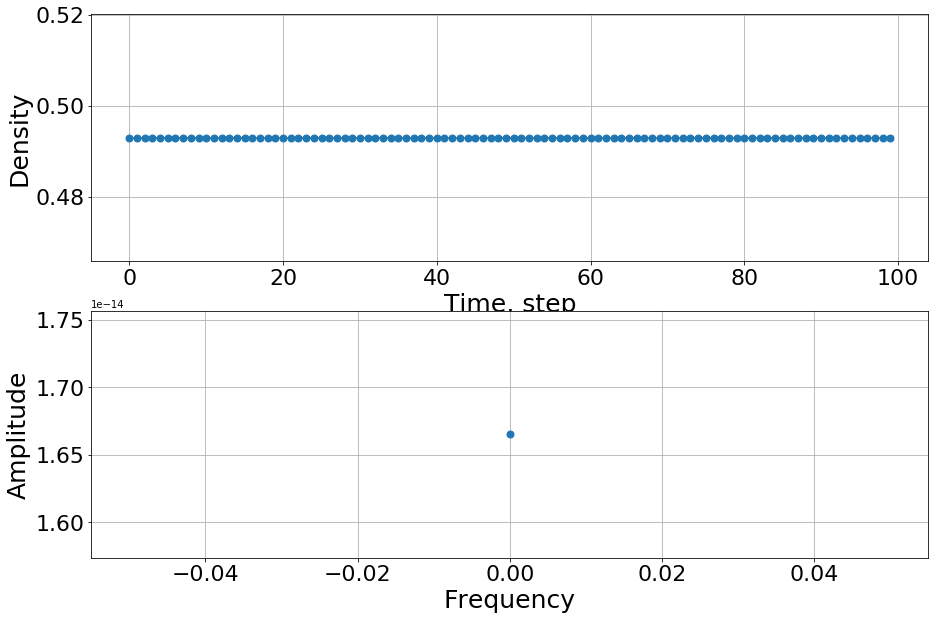

[1.66533454e-14]

===========payoff parameter:  1.135 ===========


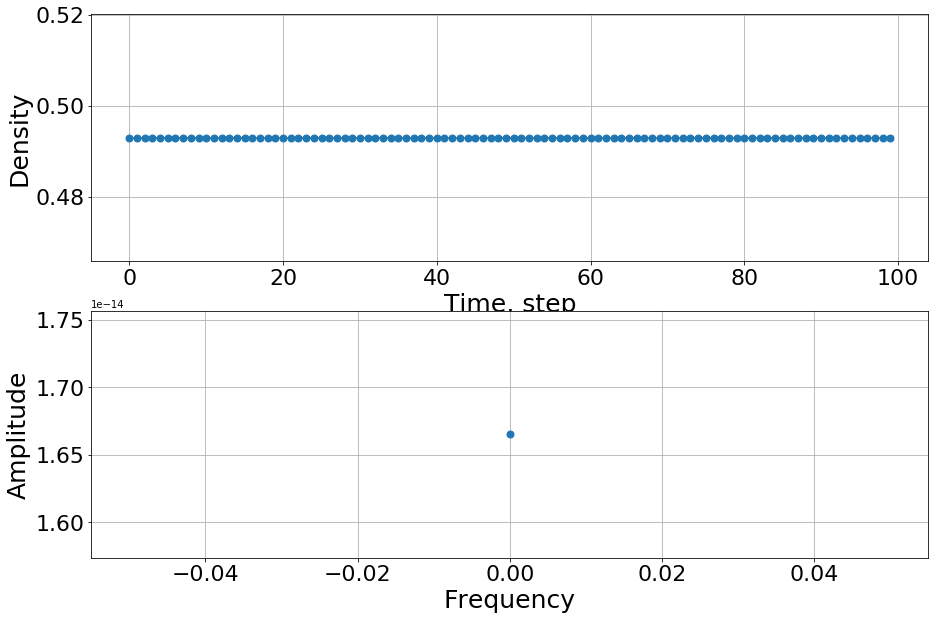

[1.66533454e-14]

===========payoff parameter:  1.1528571428571428 ===========


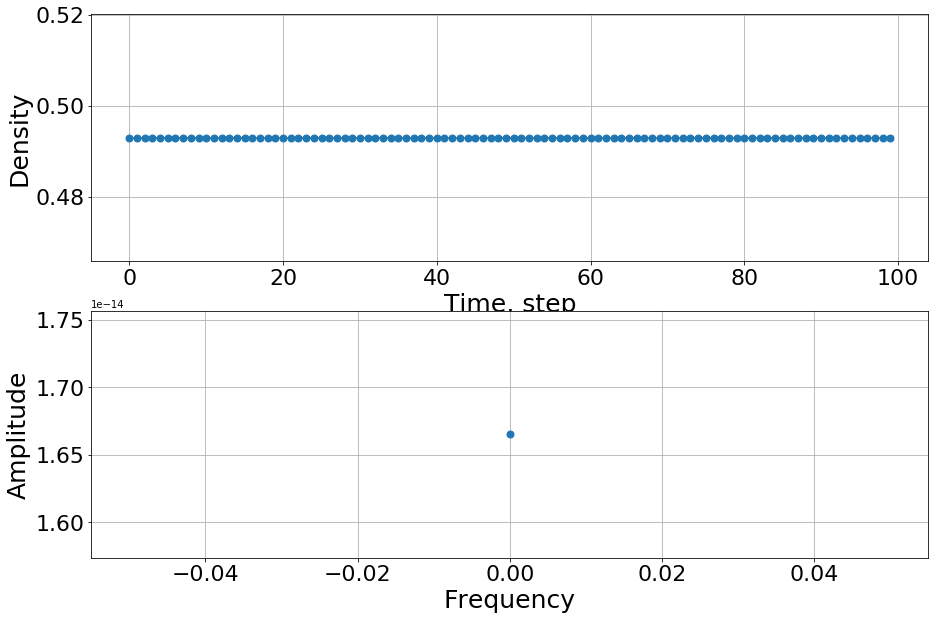

[1.66533454e-14]

===========payoff parameter:  1.1766666666666667 ===========


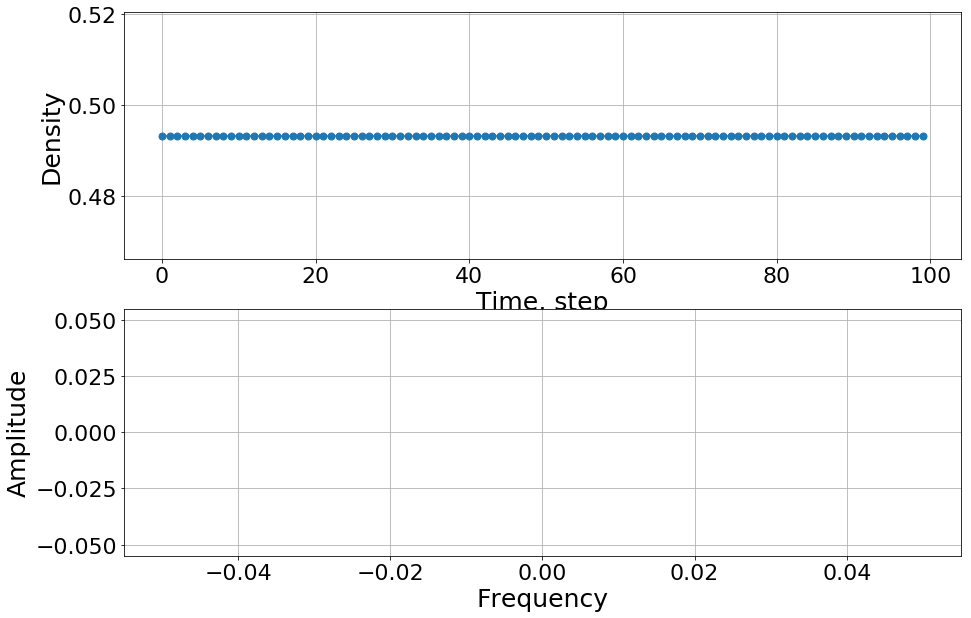

[]

===========payoff parameter:  1.21 ===========


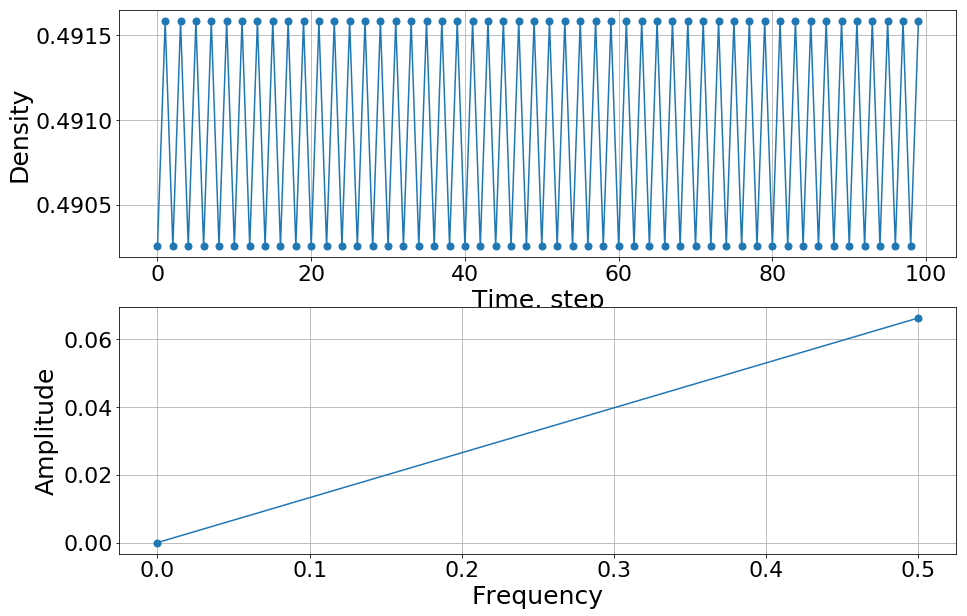

[1.38777878e-14 6.63197633e-02]

===========payoff parameter:  1.26 ===========


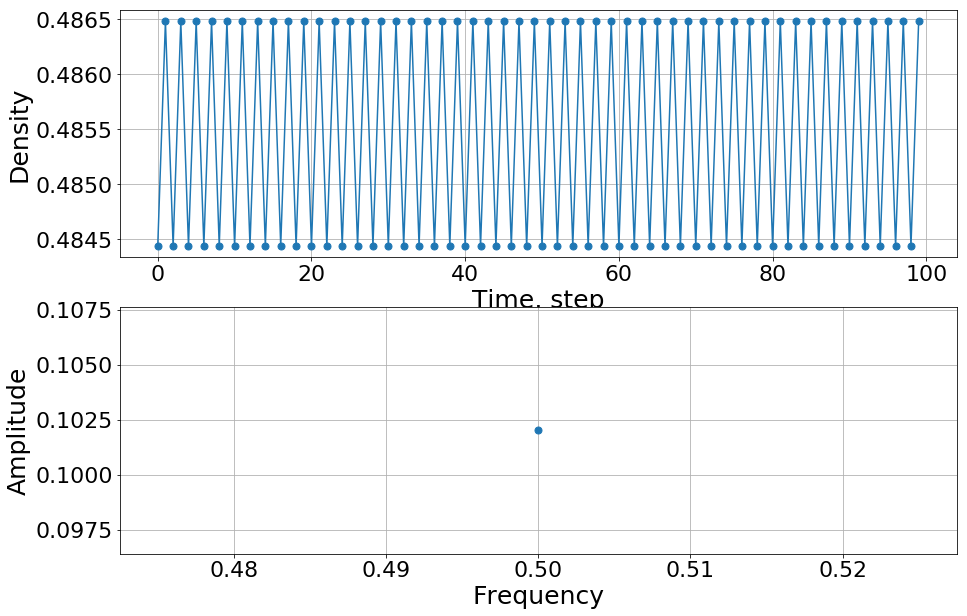

[0.10203041]

===========payoff parameter:  1.2957142857142858 ===========


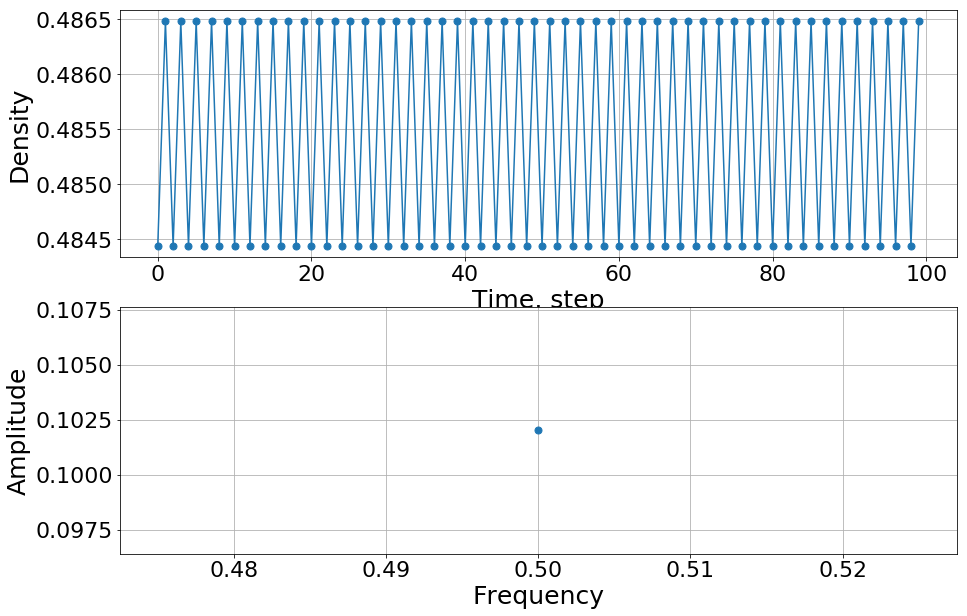

[0.10203041]

===========payoff parameter:  1.3433333333333333 ===========


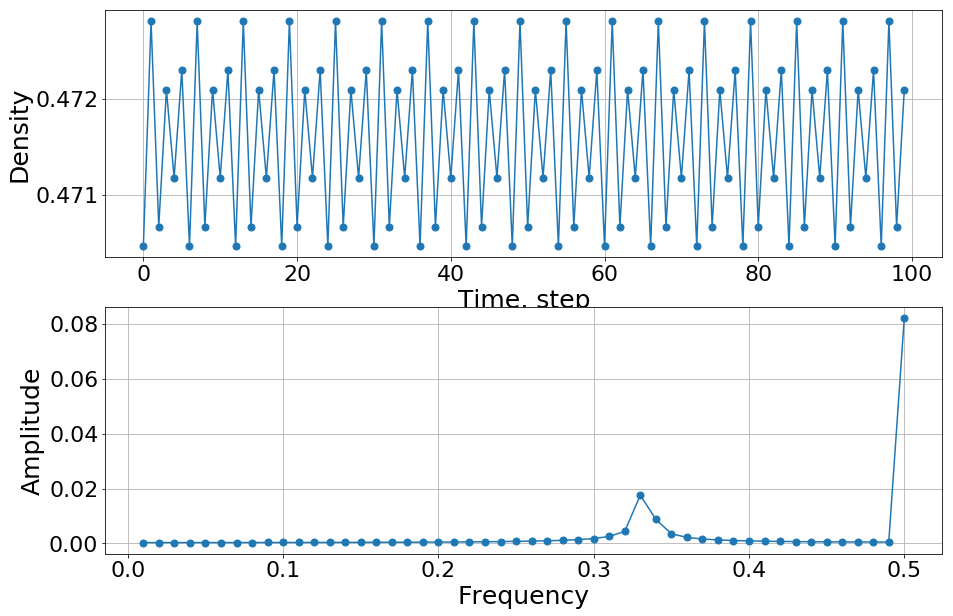

[0.00030639 0.00030729 0.0003088  0.00031094 0.00031373 0.0003172
 0.00032141 0.00032639 0.00033222 0.00033897 0.00034675 0.00035566
 0.00036586 0.00037752 0.00039086 0.00040614 0.00042371 0.000444
 0.00046757 0.00049513 0.00052764 0.00056642 0.00061327 0.00067078
 0.00074279 0.00083526 0.00095789 0.00112768 0.00137734 0.00177885
 0.00252762 0.00440535 0.01757449 0.00877739 0.00351297 0.00220096
 0.00160791 0.00127192 0.00105719 0.00090945 0.00080278 0.00072327
 0.00066282 0.00061641 0.0005808  0.00055385 0.00053411 0.00052061
 0.00051274 0.08213448]

===========payoff parameter:  1.41 ===========


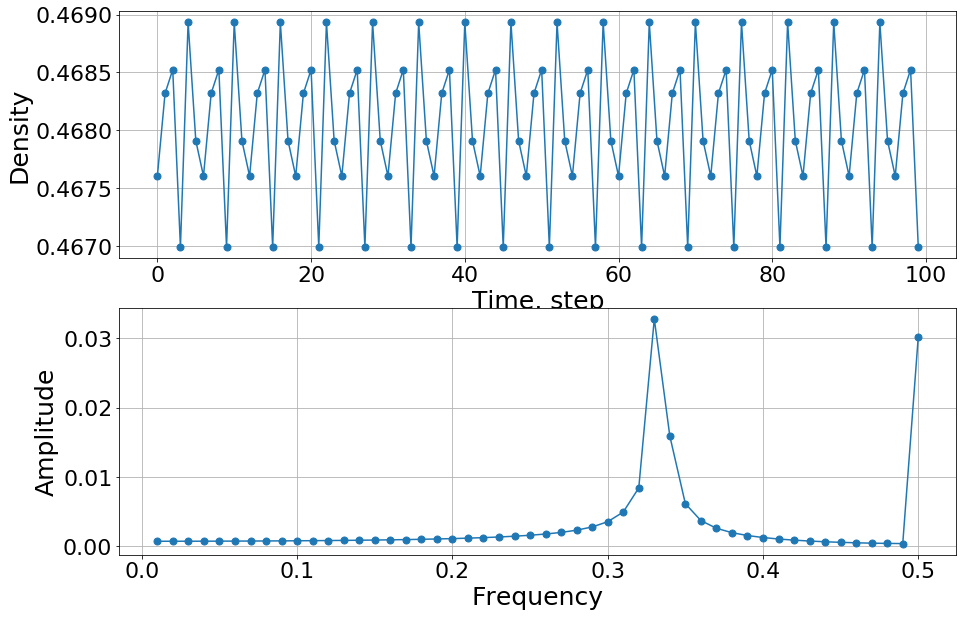

[0.00074885 0.00075074 0.00075391 0.0007584  0.00076425 0.00077153
 0.00078032 0.00079071 0.00080283 0.00081685 0.00083293 0.0008513
 0.00087224 0.00089609 0.00092324 0.00095422 0.00098967 0.00103038
 0.0010774  0.00113208 0.00119622 0.00127222 0.00136347 0.00147477
 0.00161324 0.00178989 0.00202268 0.00234304 0.00281139 0.00356071
 0.00495189 0.00842853 0.03275755 0.01589569 0.00616274 0.00372786
 0.00261981 0.0019856  0.00157444 0.0012861  0.00107277 0.00090886
 0.00077958 0.000676   0.0005926  0.0005261  0.00047476 0.00043792
 0.00041561 0.030201  ]

===========payoff parameter:  1.51 ===========


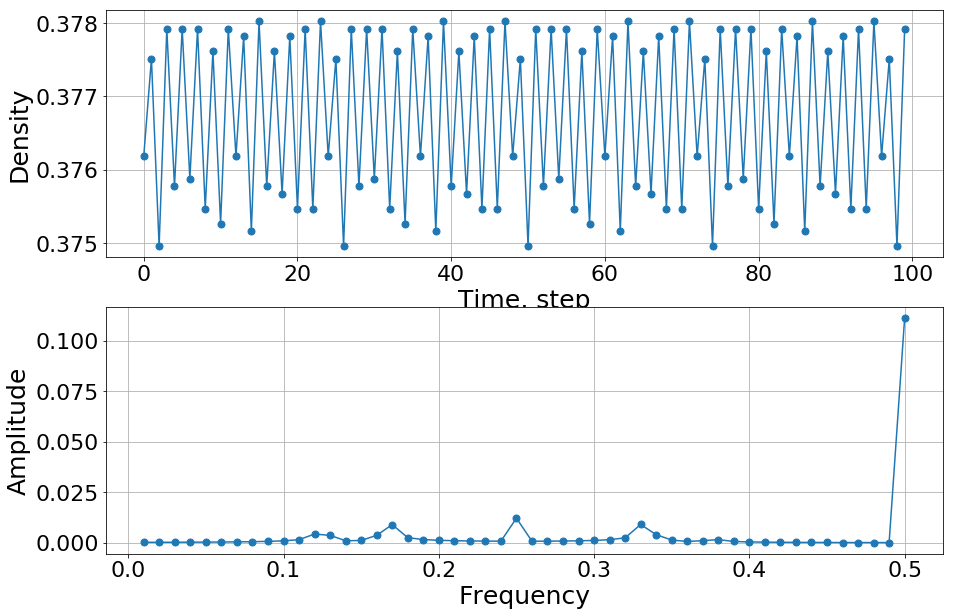

[0.00030925 0.0003189  0.00033567 0.00036069 0.00039596 0.0004448
 0.00051305 0.00061161 0.00076341 0.0010267  0.0016111  0.00438517
 0.00373428 0.00107122 0.00120998 0.00375352 0.00904474 0.00260066
 0.00166561 0.00128938 0.00109009 0.00097194 0.00089986 0.0008586
 0.01223004 0.00084612 0.00087467 0.00093358 0.00103801 0.00122327
 0.00158682 0.00251976 0.00910426 0.00406394 0.00141336 0.00074363
 0.00110006 0.0016355  0.00071044 0.0004925  0.00038385 0.00031658
 0.00027081 0.00023816 0.00021438 0.00019704 0.00018468 0.00017639
 0.00017161 0.11121314]

===========payoff parameter:  1.61 ===========


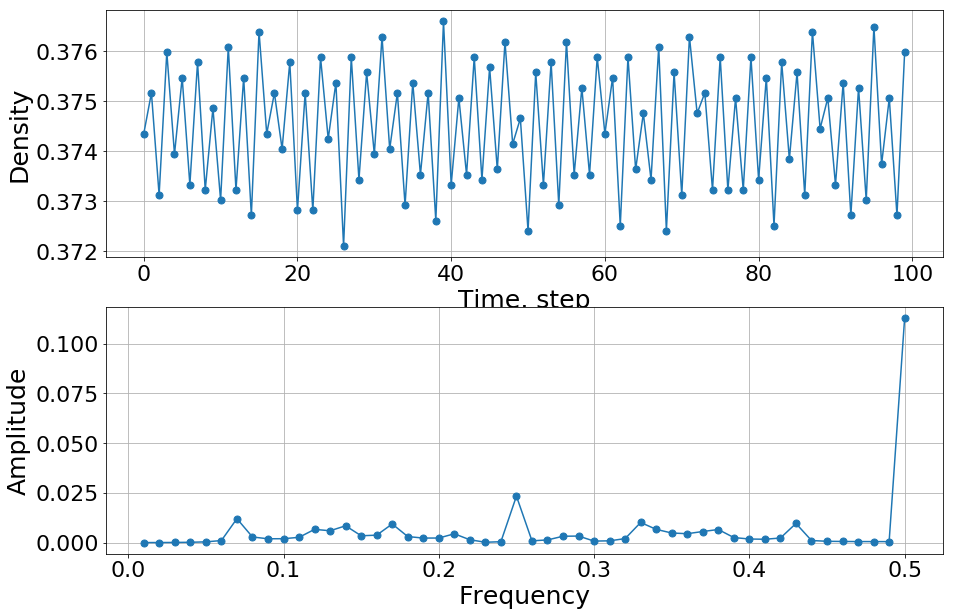

[6.15184795e-05 8.08069691e-05 1.22577923e-04 2.10417912e-04
 4.16430252e-04 1.07592108e-03 1.20592315e-02 2.87362482e-03
 1.95981169e-03 2.00357927e-03 2.69348885e-03 6.68866211e-03
 5.99175184e-03 8.48551274e-03 3.48158876e-03 3.77547228e-03
 9.40034896e-03 3.08288239e-03 2.31568867e-03 2.34449137e-03
 4.46694748e-03 1.46889389e-03 2.25834328e-04 4.88933263e-04
 2.33758761e-02 9.34411387e-04 1.38680019e-03 3.23721896e-03
 3.32846152e-03 7.99394203e-04 9.39285587e-04 2.05295703e-03
 1.01556416e-02 6.69280374e-03 4.86291576e-03 4.51271433e-03
 5.61387364e-03 6.61954656e-03 2.57287526e-03 1.85064979e-03
 1.72098372e-03 2.34865255e-03 9.65274993e-03 1.09705409e-03
 7.02060018e-04 6.07812611e-04 5.71344607e-04 5.53403398e-04
 5.44481849e-04 1.12845628e-01]

===========payoff parameter:  1.6766666666666667 ===========


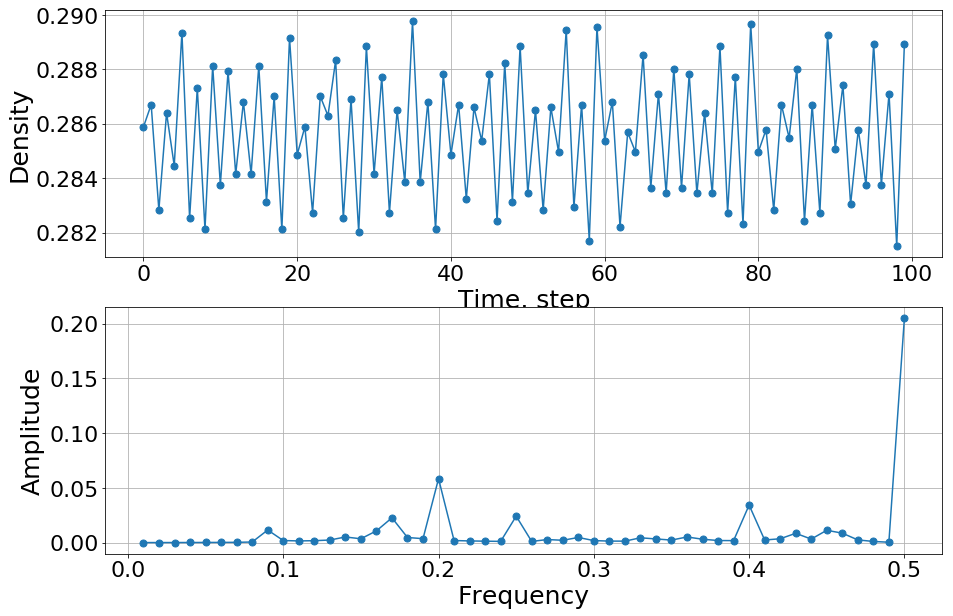

[0.00024344 0.00025669 0.00027813 0.00030721 0.00034384 0.00039035
 0.00046485 0.00074523 0.01169783 0.00208624 0.00174859 0.00195863
 0.0025613  0.00533774 0.0037031  0.01091838 0.02283463 0.00486215
 0.0038092  0.05850843 0.00209559 0.00173966 0.00149871 0.00133022
 0.02429952 0.00127732 0.00300564 0.002335   0.00488772 0.00205816
 0.00158443 0.00154287 0.00460596 0.00354224 0.00251475 0.00534358
 0.00331121 0.00209997 0.0020295  0.03442105 0.00258557 0.00371373
 0.00868106 0.0034299  0.01144557 0.00881844 0.00267462 0.00125959
 0.00055542 0.20508111]

===========payoff parameter:  1.76 ===========


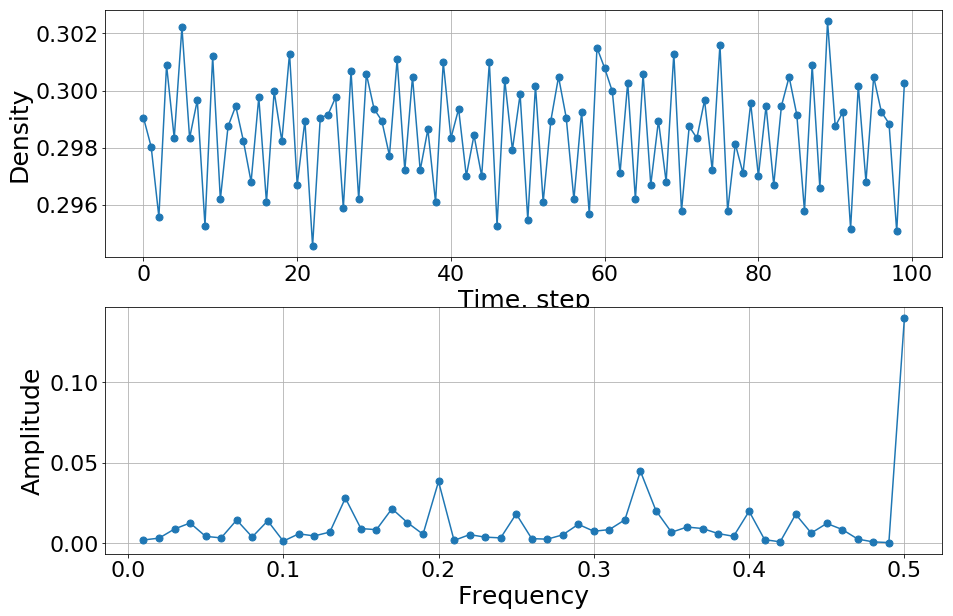

[0.00198075 0.00311103 0.00879743 0.01252792 0.004221   0.00326134
 0.01437108 0.003824   0.01386559 0.0012495  0.00578578 0.00448572
 0.00688327 0.02798572 0.00905961 0.00837454 0.02140359 0.01271793
 0.00552821 0.03830355 0.00168897 0.00529193 0.00373906 0.00327459
 0.01816743 0.0028116  0.00246984 0.00517284 0.01170178 0.00738367
 0.00842684 0.01449953 0.04466978 0.02021697 0.00677348 0.00999988
 0.00909255 0.00596501 0.00424416 0.01981019 0.00214396 0.00083084
 0.01793342 0.00627725 0.0122509  0.00846708 0.00249752 0.00077423
 0.0003616  0.13988369]

===========payoff parameter:  1.81 ===========


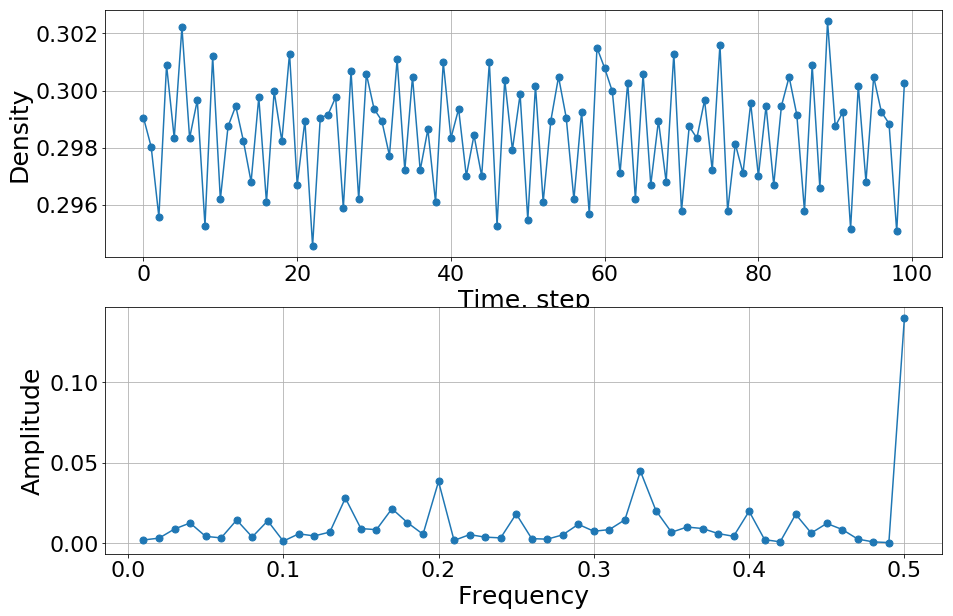

[0.00198075 0.00311103 0.00879743 0.01252792 0.004221   0.00326134
 0.01437108 0.003824   0.01386559 0.0012495  0.00578578 0.00448572
 0.00688327 0.02798572 0.00905961 0.00837454 0.02140359 0.01271793
 0.00552821 0.03830355 0.00168897 0.00529193 0.00373906 0.00327459
 0.01816743 0.0028116  0.00246984 0.00517284 0.01170178 0.00738367
 0.00842684 0.01449953 0.04466978 0.02021697 0.00677348 0.00999988
 0.00909255 0.00596501 0.00424416 0.01981019 0.00214396 0.00083084
 0.01793342 0.00627725 0.0122509  0.00846708 0.00249752 0.00077423
 0.0003616  0.13988369]

===========payoff parameter:  2.01 ===========


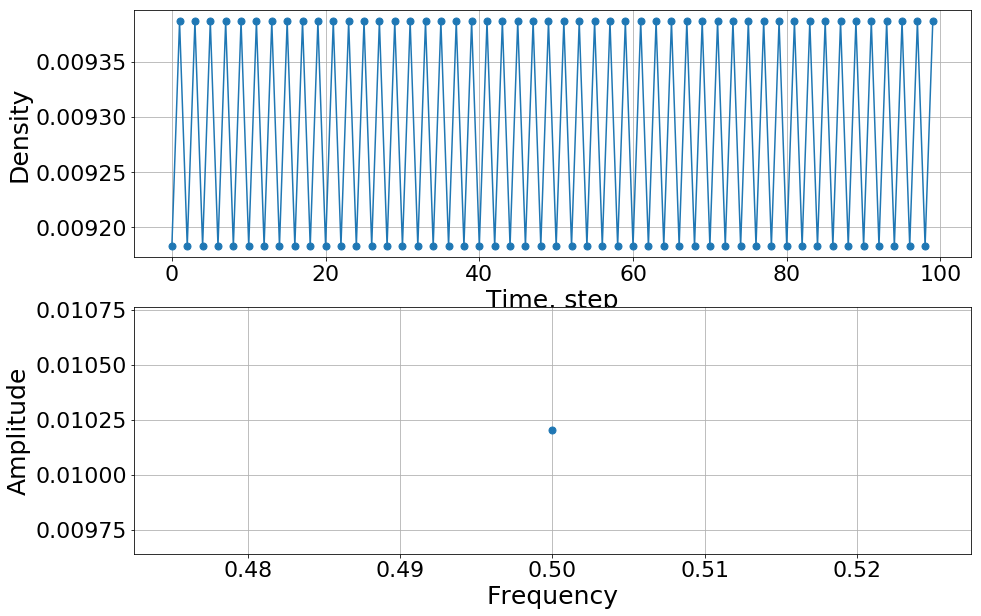

[0.01020304]

===========payoff parameter:  2.26 ===========


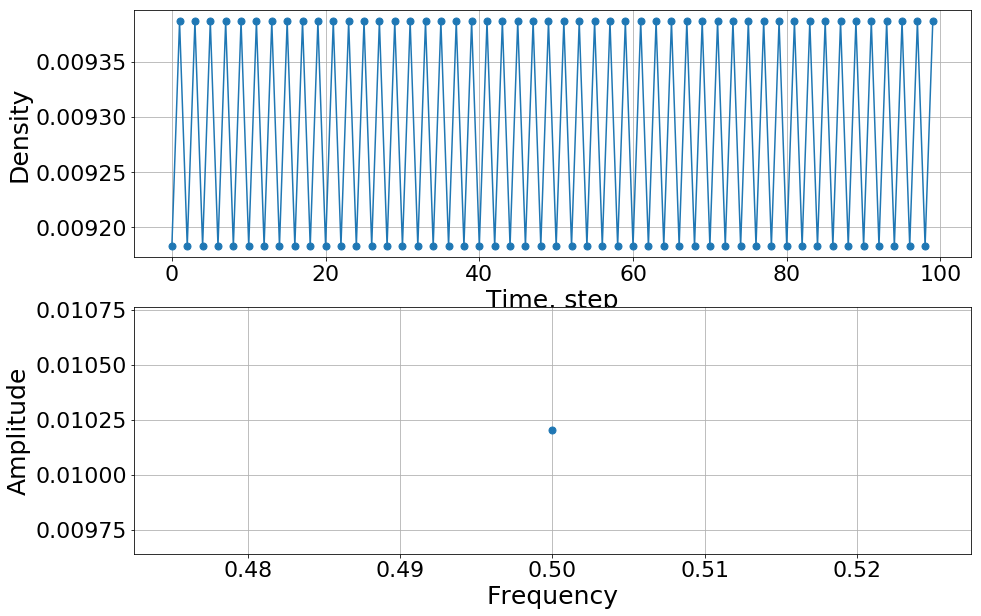

[0.01020304]

===========payoff parameter:  2.3433333333333333 ===========


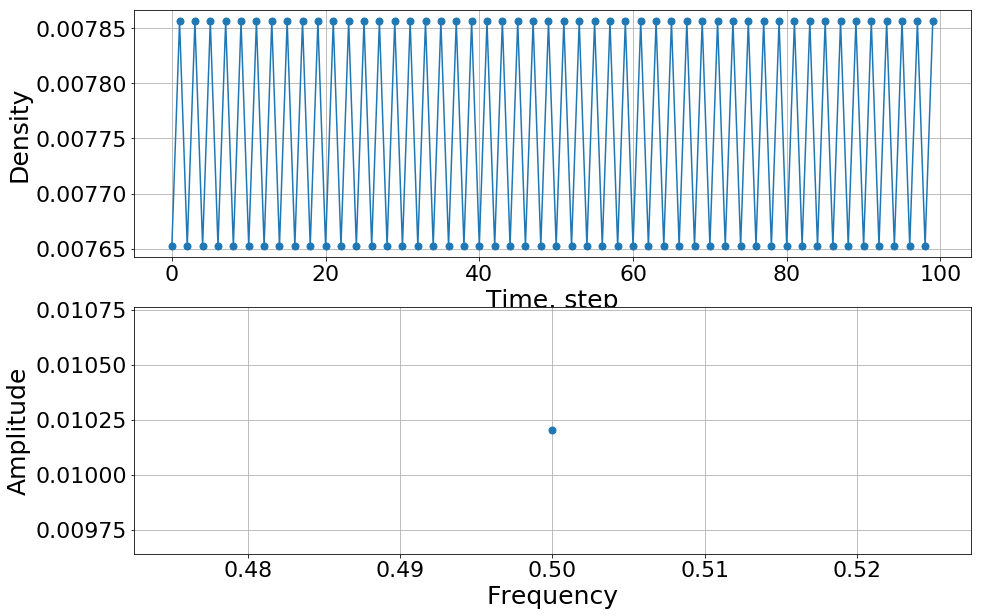

[0.01020304]

===========payoff parameter:  2.51 ===========


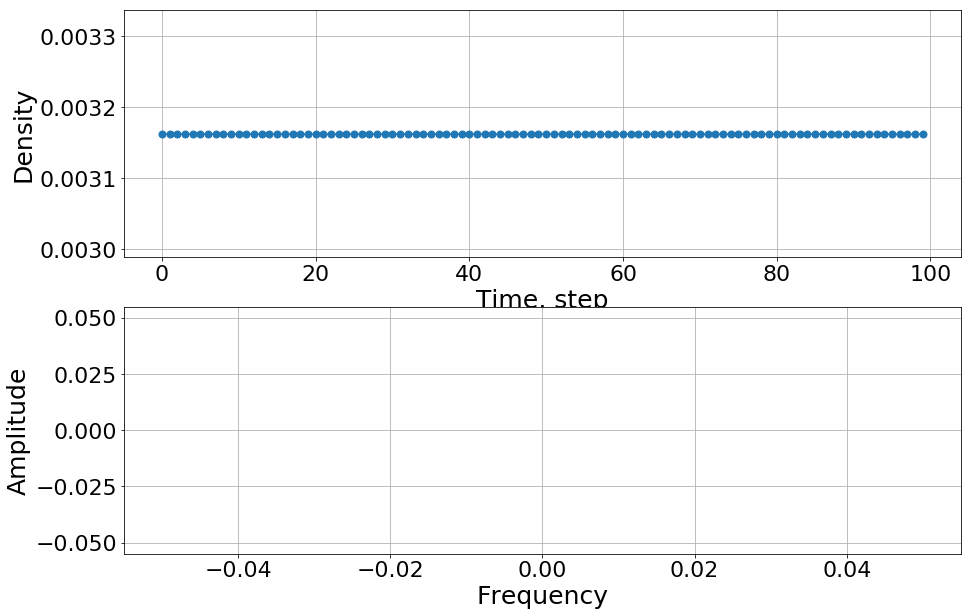

[]

===========payoff parameter:  2.6766666666666663 ===========


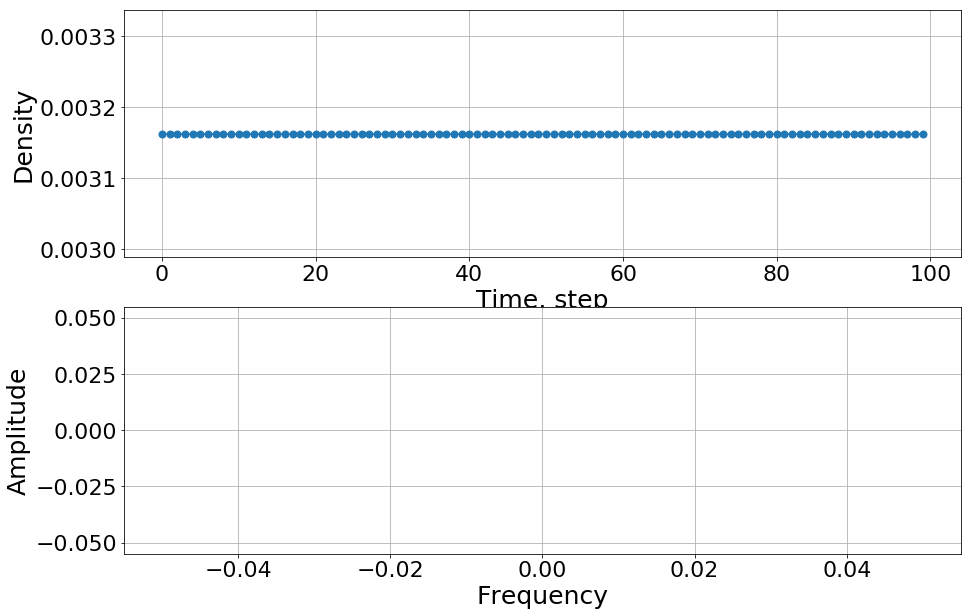

[]


In [9]:
den50=c_density(off_percentage=50, percentage=50)
for i in range(len(b_points)):
    print('\n===========payoff parameter: ',b_points[i],'===========')
    fourier(den50[i])

### cooperator percentage = 70


===========payoff parameter:  1.01 ===========


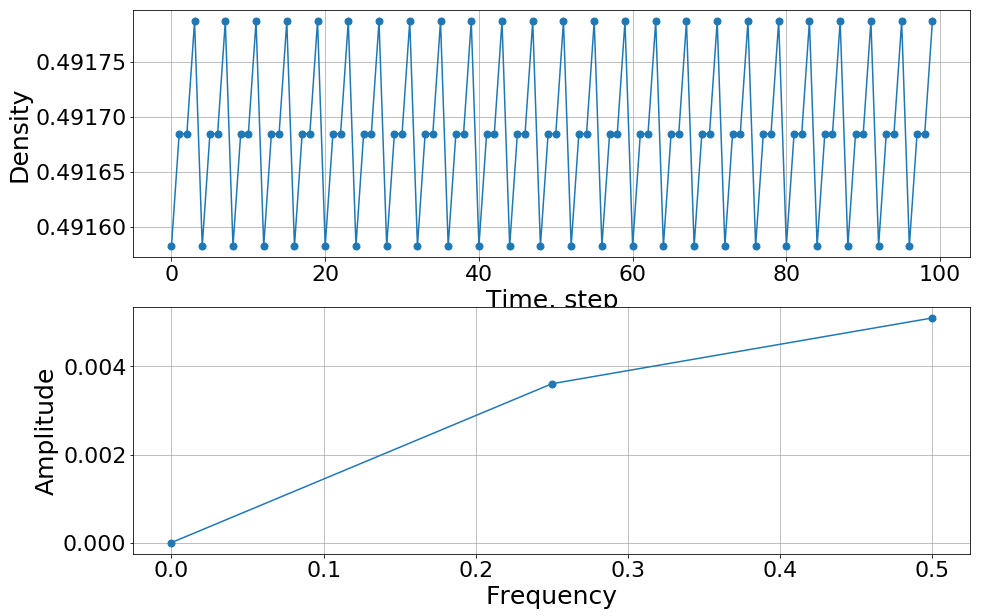

[1.52655666e-14 3.60731957e-03 5.10152025e-03]

===========payoff parameter:  1.135 ===========


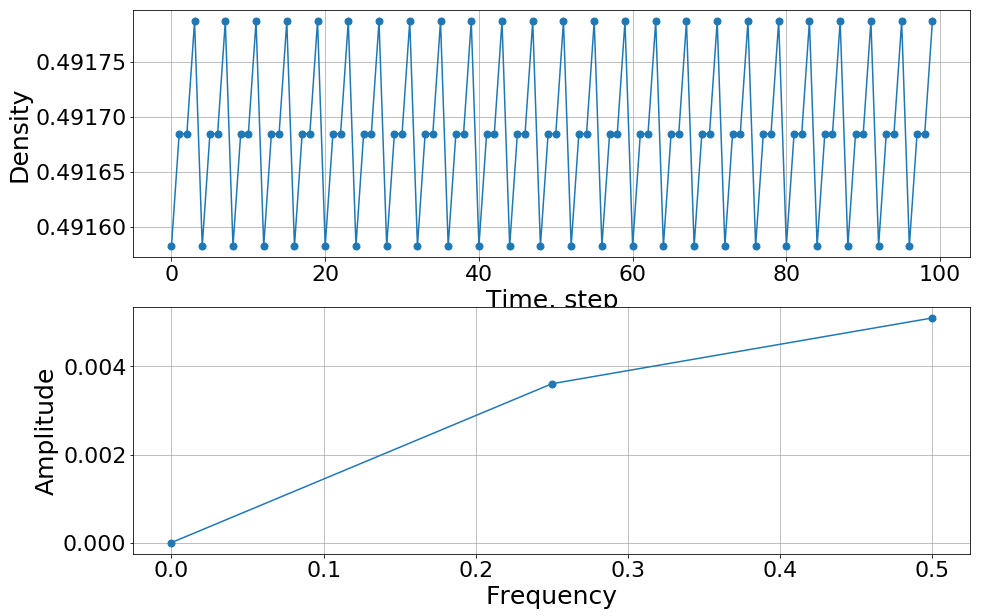

[1.52655666e-14 3.60731957e-03 5.10152025e-03]

===========payoff parameter:  1.1528571428571428 ===========


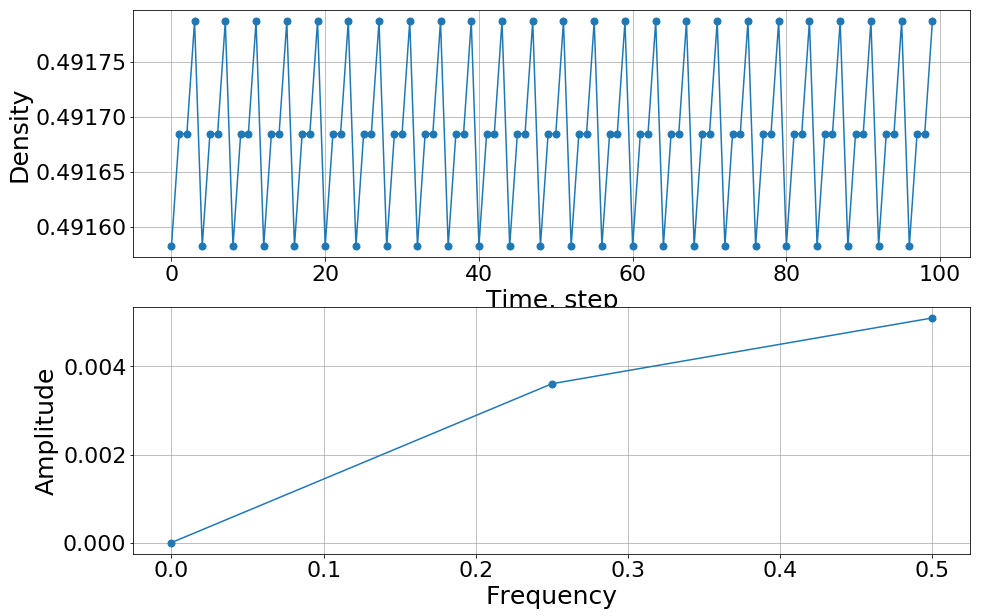

[1.52655666e-14 3.60731957e-03 5.10152025e-03]

===========payoff parameter:  1.1766666666666667 ===========


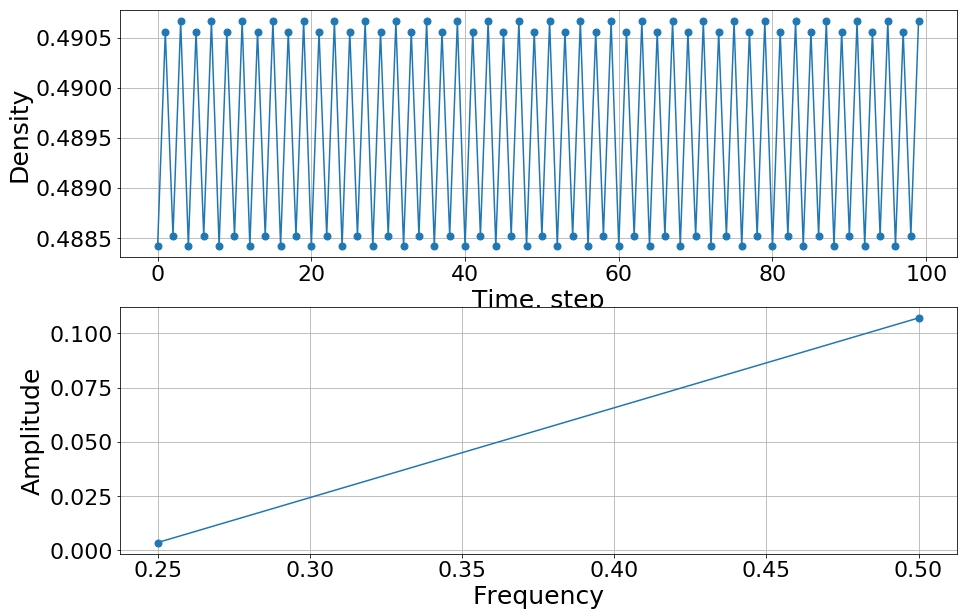

[0.00360732 0.10713193]

===========payoff parameter:  1.21 ===========


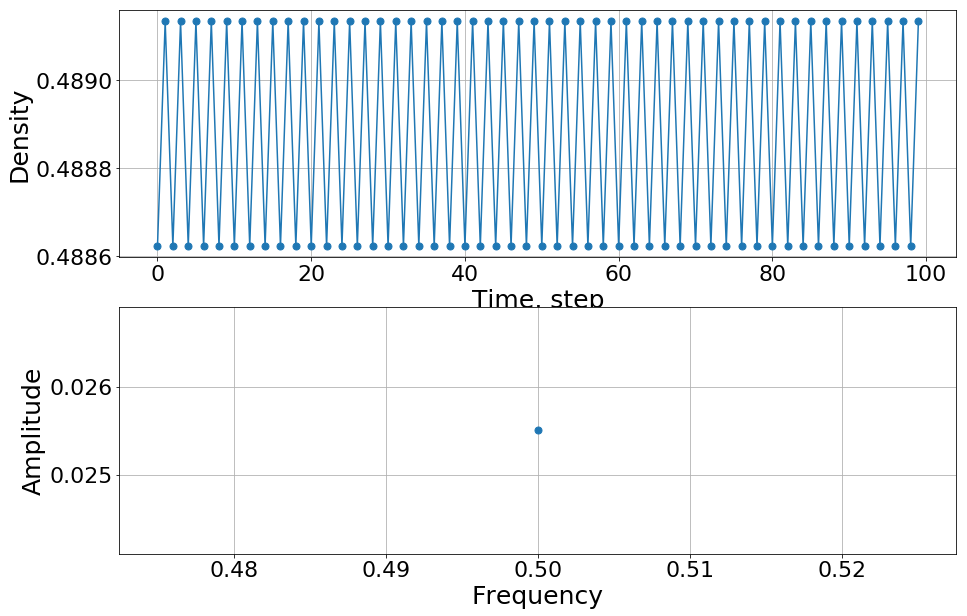

[0.0255076]

===========payoff parameter:  1.26 ===========


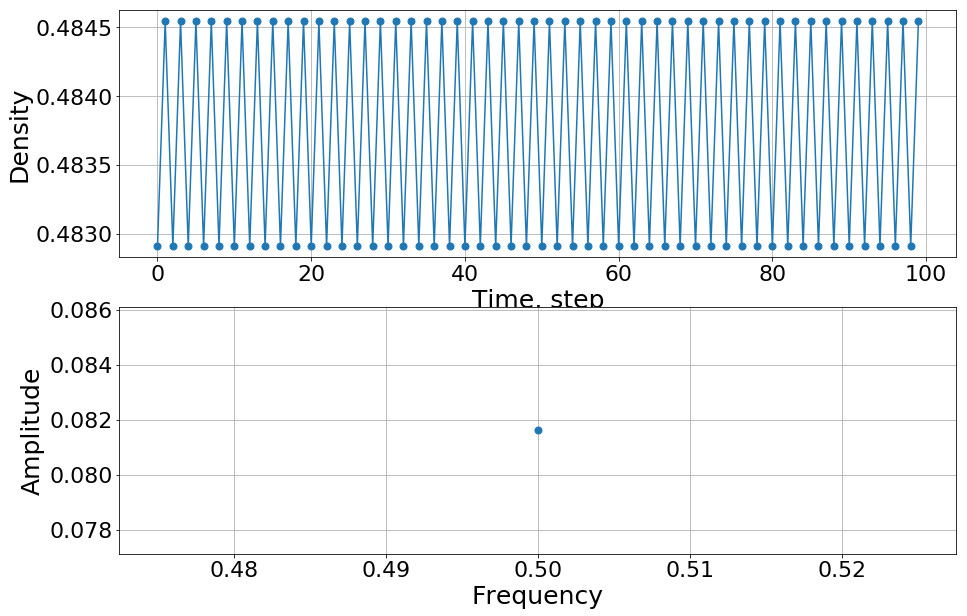

[0.08162432]

===========payoff parameter:  1.2957142857142858 ===========


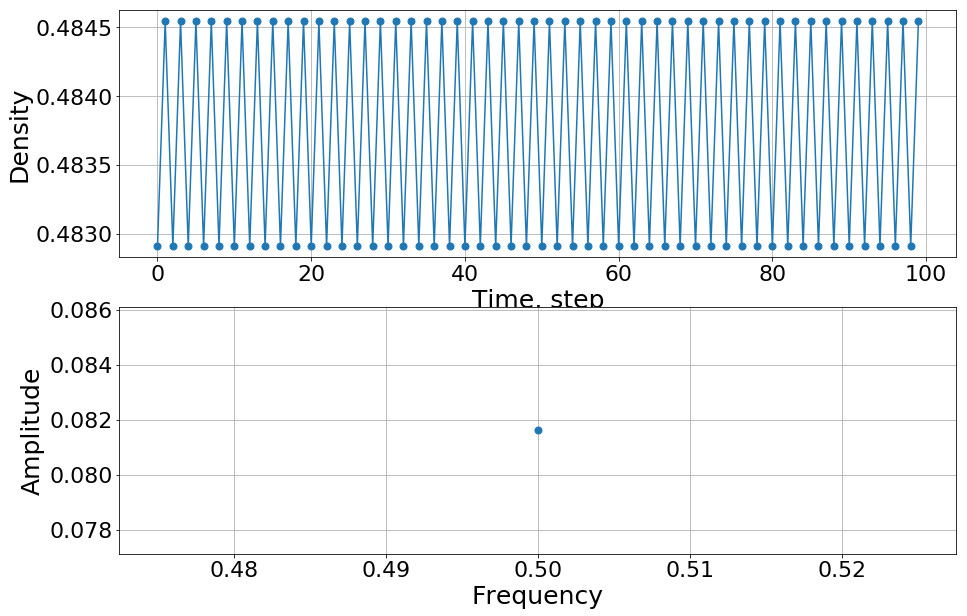

[0.08162432]

===========payoff parameter:  1.3433333333333333 ===========


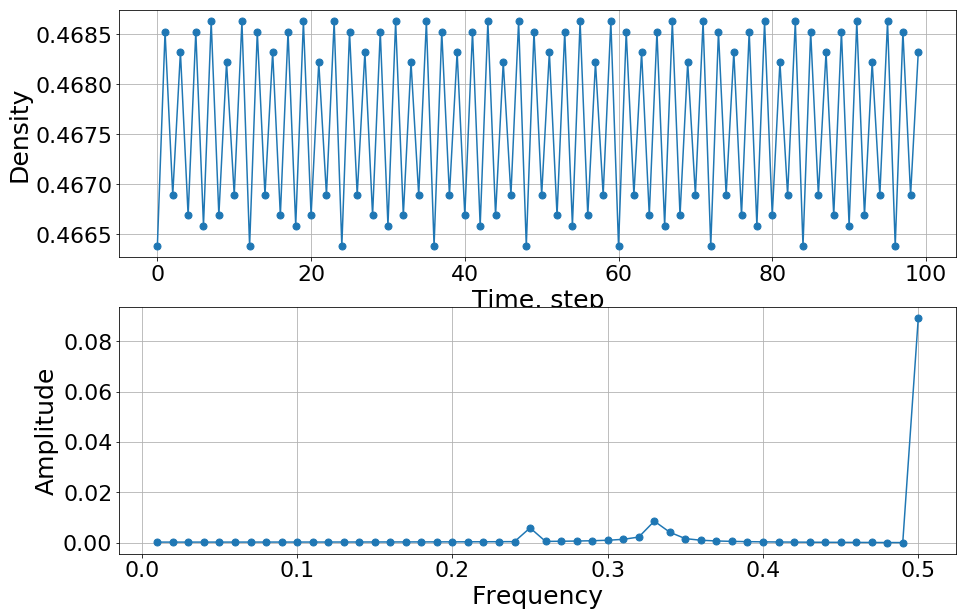

[2.04228784e-04 2.04734404e-04 2.05582805e-04 2.06782702e-04
 2.08346623e-04 2.10291260e-04 2.12637952e-04 2.15413324e-04
 2.18650119e-04 2.22388285e-04 2.26676376e-04 2.31573376e-04
 2.37151083e-04 2.43497249e-04 2.50719771e-04 2.58952344e-04
 2.68362197e-04 2.79160879e-04 2.91619558e-04 3.06091215e-04
 3.23043642e-04 3.43109901e-04 3.67168090e-04 3.96472373e-04
 5.85498081e-03 4.79252772e-04 5.40271437e-04 6.24114593e-04
 7.46509811e-04 9.42051894e-04 1.30463090e-03 2.20978590e-03
 8.53942357e-03 4.11592964e-03 1.58298234e-03 9.48359169e-04
 6.58712473e-04 4.92118475e-04 3.83288820e-04 3.06091215e-04
 2.48009878e-04 2.02286576e-04 1.64938903e-04 1.33454891e-04
 1.06157907e-04 8.18710636e-05 5.97273263e-05 3.90551763e-05
 1.93053040e-05 8.92766044e-02]

===========payoff parameter:  1.41 ===========


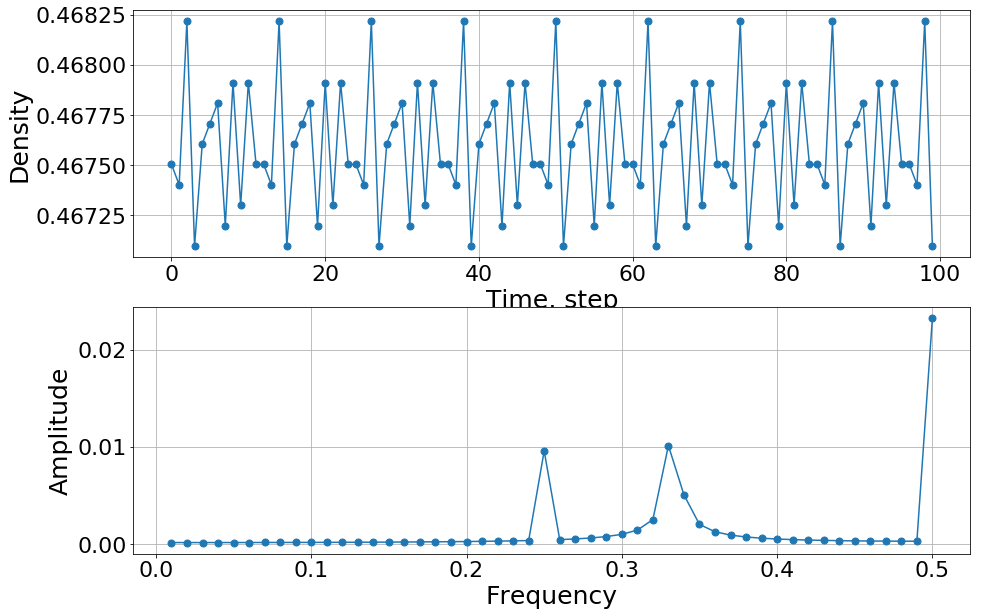

[0.00017022 0.00017073 0.00017159 0.00017281 0.0001744  0.00017639
 0.00017878 0.00018163 0.00018496 0.00018881 0.00019325 0.00019835
 0.00020418 0.00021085 0.00021848 0.00022723 0.0002373  0.00024893
 0.00026244 0.00027826 0.00029693 0.00031921 0.00034614 0.00037923
 0.00959411 0.00047394 0.0005446  0.00064249 0.00078648 0.00101814
 0.00145028 0.00253422 0.01013726 0.00507718 0.00203793 0.00128062
 0.0009384  0.00074459 0.00062079 0.00053566 0.00047423 0.00042848
 0.00039372 0.00036705 0.00034661 0.00033114 0.00031982 0.00031208
 0.00030757 0.02326293]

===========payoff parameter:  1.51 ===========


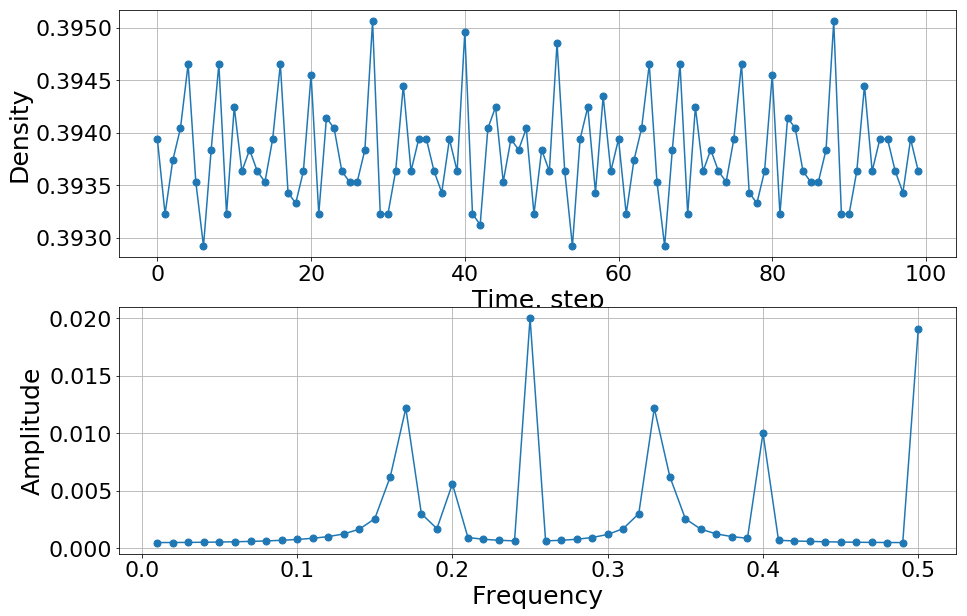

[0.00047789 0.0004832  0.00049232 0.00050566 0.00052391 0.00054806
 0.0005796  0.00062077 0.00067504 0.00074804 0.00084942 0.00099721
 0.00122921 0.00164008 0.00255205 0.0062218  0.0121773  0.00299305
 0.00169218 0.00558857 0.00091842 0.00076577 0.00067565 0.00062742
 0.02003566 0.00062742 0.00067565 0.00076577 0.00091842 0.00118219
 0.00169218 0.00299305 0.0121773  0.0062218  0.00255205 0.00164008
 0.00122921 0.00099721 0.00084942 0.01001139 0.00067504 0.00062077
 0.0005796  0.00054806 0.00052391 0.00050566 0.00049232 0.0004832
 0.00047789 0.01907969]

===========payoff parameter:  1.61 ===========


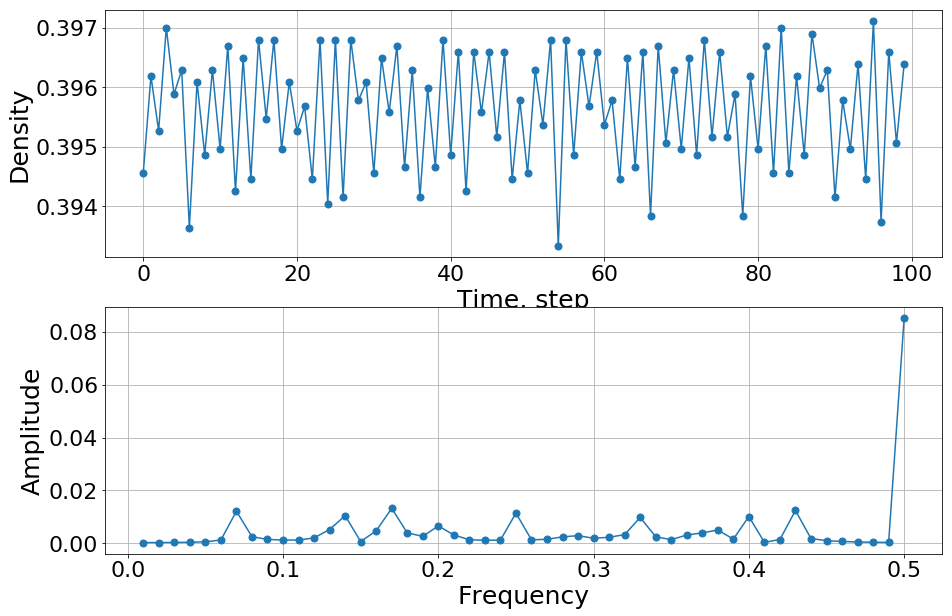

[0.00031653 0.00032813 0.00035684 0.00042763 0.0006179  0.00127056
 0.01216461 0.00254467 0.0015071  0.00127553 0.00126231 0.0020877
 0.00524554 0.0104777  0.00071559 0.00473919 0.0132769  0.0039737
 0.00267176 0.0066162  0.00319803 0.00137942 0.00119731 0.00123075
 0.01145334 0.0013651  0.00155114 0.00247507 0.00292265 0.00195918
 0.00231203 0.0033171  0.00982939 0.00250605 0.00141379 0.00317406
 0.00397908 0.00507376 0.00161112 0.01016116 0.00041816 0.00147005
 0.01244363 0.00183079 0.00105112 0.00073315 0.00055277 0.00043985
 0.00037424 0.08519539]

===========payoff parameter:  1.6766666666666667 ===========


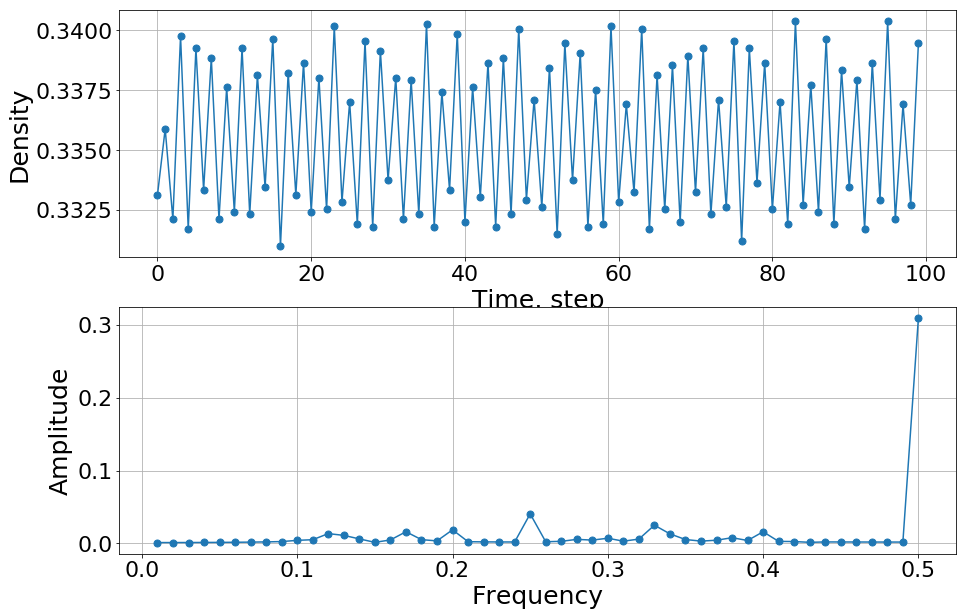

[0.00101532 0.00104466 0.00109558 0.00117153 0.00127847 0.0014265
 0.00163329 0.00193204 0.00239262 0.00406449 0.0049668  0.01333144
 0.01087689 0.00603737 0.00132755 0.00462321 0.01589315 0.00502973
 0.00332843 0.0185393  0.00220644 0.00197493 0.00185178 0.00182086
 0.04047368 0.00212618 0.00272936 0.00540553 0.00442854 0.00695612
 0.0029432  0.00578845 0.02489081 0.01295046 0.00517864 0.00303296
 0.00423432 0.00771259 0.003871   0.01585146 0.00261299 0.00242898
 0.00134253 0.00188534 0.00184091 0.00179047 0.00175049 0.00172245
 0.00170595 0.30966228]

===========payoff parameter:  1.76 ===========


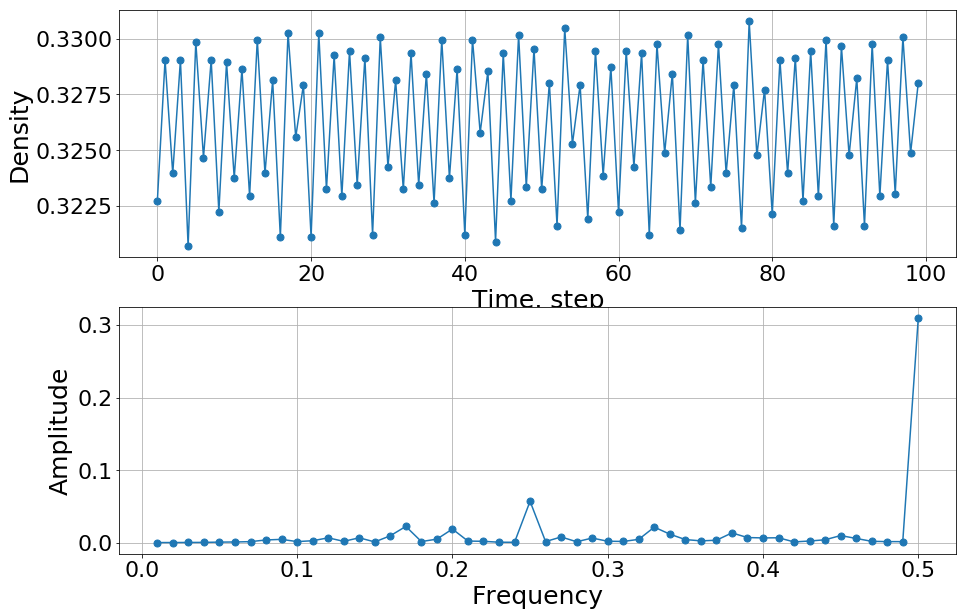

[0.00049057 0.000552   0.00064588 0.00074528 0.00110844 0.00130761
 0.00177447 0.00409911 0.0049109  0.00181304 0.0030175  0.0069933
 0.00220374 0.00703772 0.001366   0.00986156 0.02271624 0.00190595
 0.00520673 0.0191152  0.00253948 0.00221551 0.00098482 0.00087812
 0.05729396 0.00188646 0.00819473 0.00164673 0.0066966  0.00232495
 0.00203123 0.00493209 0.0217368  0.01206421 0.00459896 0.00285909
 0.00368578 0.0137879  0.0073929  0.00690776 0.00708721 0.00138292
 0.00262392 0.00434129 0.0101319  0.00616432 0.002206   0.00181356
 0.00176589 0.30966228]

===========payoff parameter:  1.81 ===========


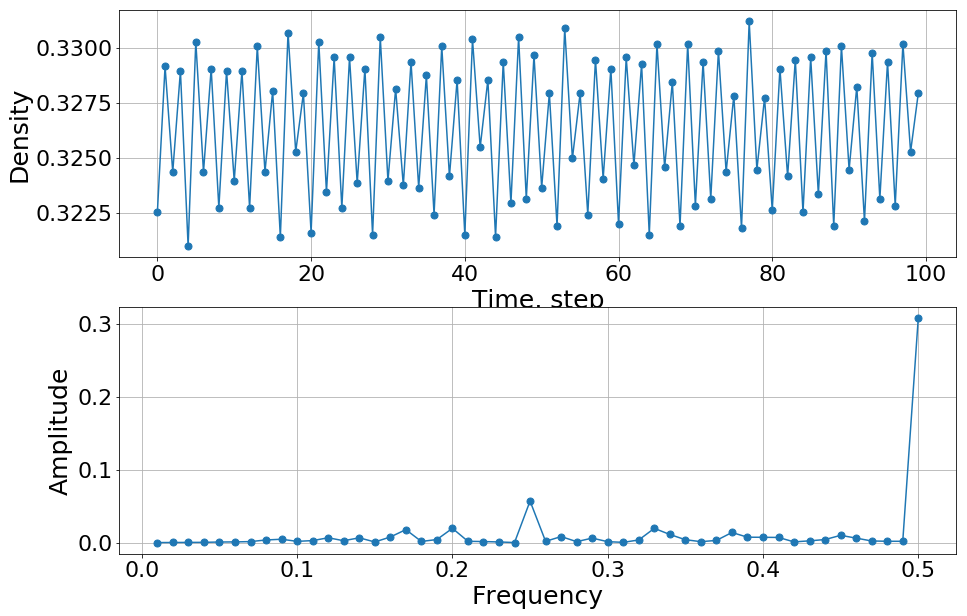

[1.79043631e-04 2.82028774e-04 4.00765117e-04 4.89835394e-04
 9.31323594e-04 1.09067021e-03 1.51520128e-03 3.74589721e-03
 4.74997879e-03 1.82825857e-03 2.87714171e-03 6.73587026e-03
 2.71816487e-03 6.68921616e-03 1.00654843e-03 7.79039083e-03
 1.78852551e-02 1.72705842e-03 4.32611278e-03 1.96899877e-02
 1.88863305e-03 1.57384282e-03 1.02859888e-03 2.14796461e-04
 5.70298856e-02 1.87966133e-03 8.38882670e-03 1.44906227e-03
 6.28006787e-03 1.39493872e-03 4.82189299e-04 3.74868182e-03
 1.96326147e-02 1.12884316e-02 4.09780640e-03 1.42615020e-03
 3.10976745e-03 1.40022173e-02 7.53742064e-03 7.40414197e-03
 7.19115860e-03 1.09793323e-03 2.54977007e-03 4.32766702e-03
 1.00831261e-02 6.27781862e-03 2.36163107e-03 1.96341248e-03
 1.90552108e-03 3.07825732e-01]

===========payoff parameter:  2.01 ===========


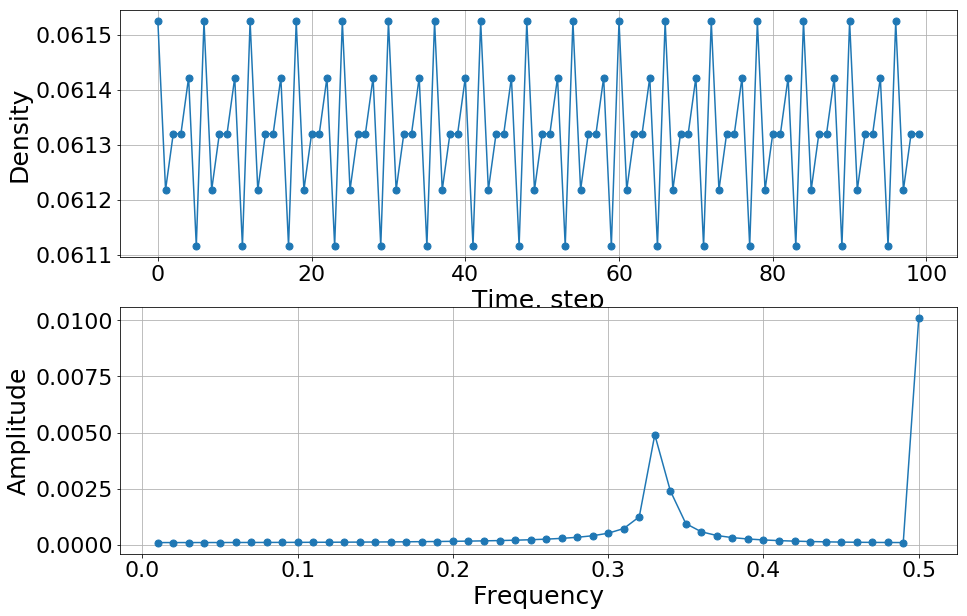

[0.00010212 0.00010239 0.00010284 0.00010348 0.00010432 0.00010536
 0.00010661 0.0001081  0.00010984 0.00011184 0.00011415 0.00011679
 0.0001198  0.00012324 0.00012716 0.00013163 0.00013676 0.00014267
 0.0001495  0.00015747 0.00016683 0.00017796 0.00019135 0.00020772
 0.00022815 0.00025428 0.0002888  0.00033644 0.00040626 0.00051823
 0.00072656 0.00124803 0.00490122 0.00240671 0.00094582 0.00058109
 0.00041574 0.00032165 0.00026117 0.00021926 0.00018873 0.00016575
 0.00014807 0.00013434 0.00012368 0.00011551 0.00010946 0.00010529
 0.00010284 0.01010101]

===========payoff parameter:  2.26 ===========


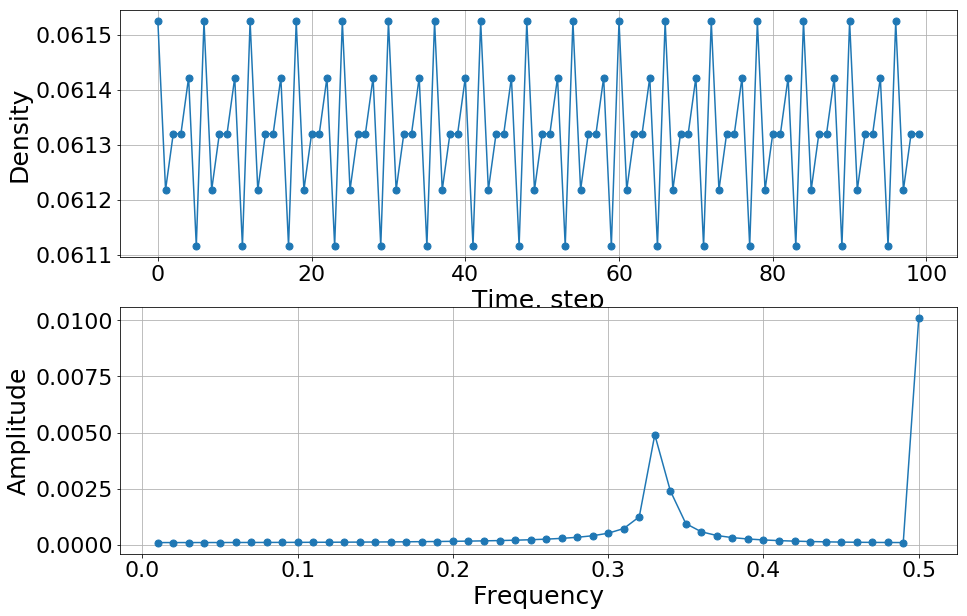

[0.00010212 0.00010239 0.00010284 0.00010348 0.00010432 0.00010536
 0.00010661 0.0001081  0.00010984 0.00011184 0.00011415 0.00011679
 0.0001198  0.00012324 0.00012716 0.00013163 0.00013676 0.00014267
 0.0001495  0.00015747 0.00016683 0.00017796 0.00019135 0.00020772
 0.00022815 0.00025428 0.0002888  0.00033644 0.00040626 0.00051823
 0.00072656 0.00124803 0.00490122 0.00240671 0.00094582 0.00058109
 0.00041574 0.00032165 0.00026117 0.00021926 0.00018873 0.00016575
 0.00014807 0.00013434 0.00012368 0.00011551 0.00010946 0.00010529
 0.00010284 0.01010101]

===========payoff parameter:  2.3433333333333333 ===========


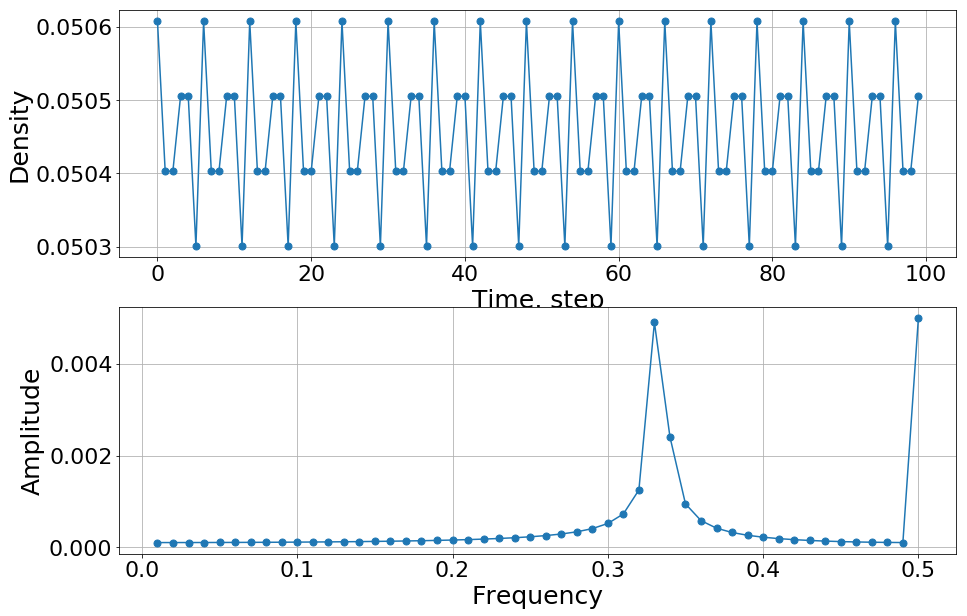

[0.00010212 0.00010239 0.00010284 0.00010348 0.00010432 0.00010536
 0.00010661 0.0001081  0.00010984 0.00011184 0.00011415 0.00011679
 0.0001198  0.00012324 0.00012716 0.00013163 0.00013676 0.00014267
 0.0001495  0.00015747 0.00016683 0.00017796 0.00019135 0.00020772
 0.00022815 0.00025428 0.0002888  0.00033644 0.00040626 0.00051823
 0.00072656 0.00124803 0.00490122 0.00240671 0.00094582 0.00058109
 0.00041574 0.00032165 0.00026117 0.00021926 0.00018873 0.00016575
 0.00014807 0.00013434 0.00012368 0.00011551 0.00010946 0.00010529
 0.00010284 0.00499949]

===========payoff parameter:  2.51 ===========


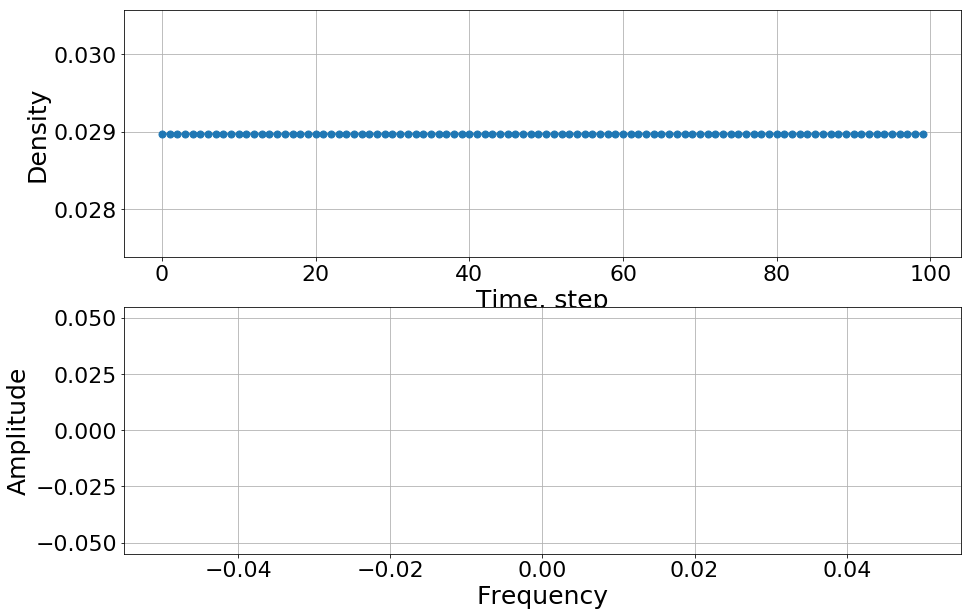

[]

===========payoff parameter:  2.6766666666666663 ===========


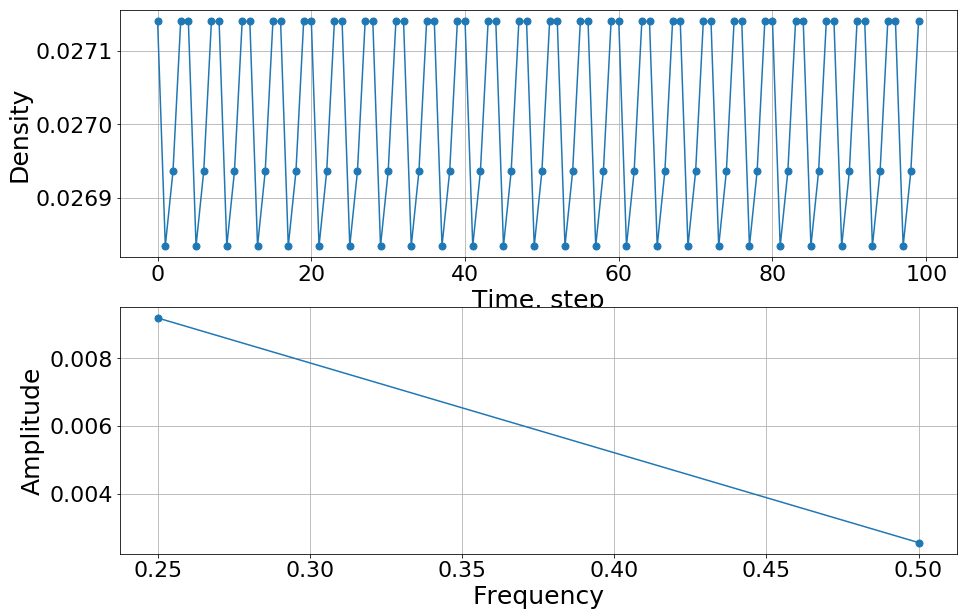

[0.0091969  0.00255076]


In [10]:
den70=c_density(off_percentage=50, percentage=70)
for i in range(len(b_points)):
    print('\n===========payoff parameter: ',b_points[i],'===========')
    fourier(den70[i])